<h1><b>Задача по предсказанию рейтинга шоколада

<h3><b>Никнейм на Kaggle: 

# Описание задачи

In [1045]:
# Даны характеристики шоколадок и по ним нужно предсказать их рейтинг.

# Описание данных
# Company - компания производитель
# Specific Bean Origin - географический регион происхождения
# REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
# Review - дата публикации отзыва
# Cocoa Percent - процентное содержание какао
# Company Location - страна производитель
# Rating - экспертный рейтинг
# Bean Type - используемый сорт какао-бобов, если таковой имеется
# Broad Bean Origin - географический регион происхождения какао-бобов

# Файлы с данными
# choco_train.csv - тренировочные данные
# choco_test_new.csv - тестовые данные
# choco_sample_submission.csv - пример submission

# Импорт библиотек, константы

In [1046]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [1047]:
import warnings
warnings.filterwarnings("ignore")

In [1048]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from category_encoders.ordinal import OrdinalEncoder
from category_encoders.one_hot import OneHotEncoder
from category_encoders.target_encoder import TargetEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder

In [1049]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor, CatBoostClassifier
from xgboost import XGBRegressor
from lightgbm import LGBMRanker, LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
import optuna

In [1050]:
from association_metrics import CramersV
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_absolute_percentage_error as MAPE, mean_absolute_error as MAE, r2_score, mean_squared_error as MSE
from scipy import stats

from sklearn.pipeline import Pipeline

In [1051]:
# SEED = 4784
mae_0 = 1
r2_0 = 0

<!-- # Загрузка данных -->

Загрузка данных

In [1052]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1053]:
train_df = pd.read_csv(TRAIN)

In [1054]:
test_df = pd.read_csv(TEST)

In [1055]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1056]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1057]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1058]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1059]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1060]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1061]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1062]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1063]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1064]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1065]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1066]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1067]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1068]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1069]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1070]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

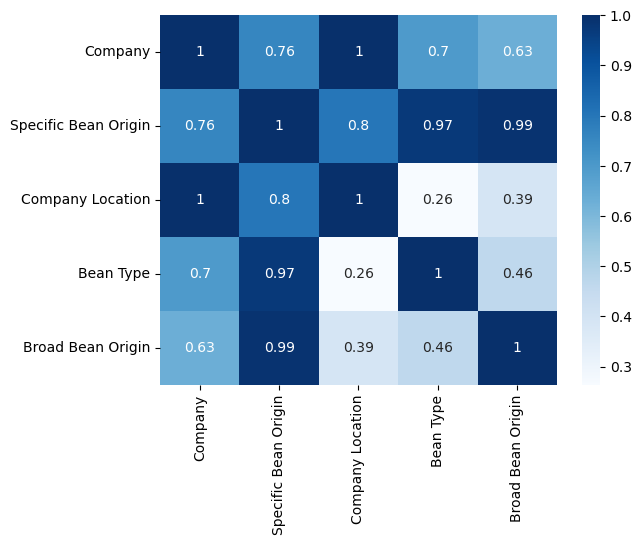

In [1071]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1072]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1073]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1074]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1075]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1076]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1077]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

7519
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1078]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1079]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1080]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1081]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1082]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1083]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1084]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1085]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1086]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1087]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1088]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1089]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1090]:
pred = model.predict(test)

In [1091]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

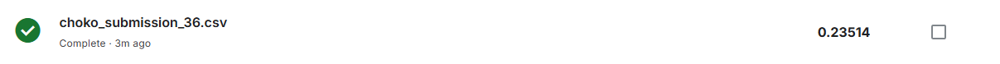

In [1092]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

7519
0.9549752280789302
0.035430117461681426


# Результат

In [1093]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

7519
0.9549752280789302
0.035430117461681426


Загрузка данных

In [1094]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1095]:
train_df = pd.read_csv(TRAIN)

In [1096]:
test_df = pd.read_csv(TEST)

In [1097]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1098]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1099]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1100]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1101]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1102]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1103]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1104]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1105]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1106]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1107]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1108]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1109]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1110]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1111]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1112]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

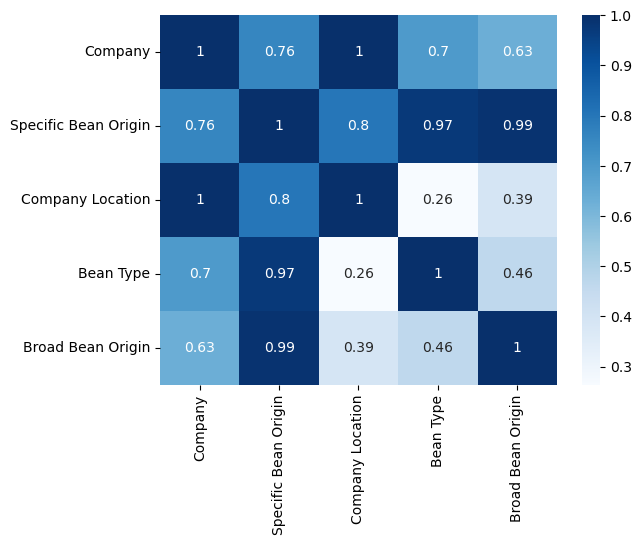

In [1113]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1114]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1115]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1116]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1117]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1118]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1119]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

9991
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1120]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1121]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1122]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1123]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1124]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1125]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1126]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1127]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1128]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1129]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1130]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1131]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1132]:
pred = model.predict(test)

In [1133]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1134]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

9991
0.9569137889564514
0.03424999698631989


# Результат

In [1135]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

9991
0.9569137889564514
0.03424999698631989


Загрузка данных

In [1136]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1137]:
train_df = pd.read_csv(TRAIN)

In [1138]:
test_df = pd.read_csv(TEST)

In [1139]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1140]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1141]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1142]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1143]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1144]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1145]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1146]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1147]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1148]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1149]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1150]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1151]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1152]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1153]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1154]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

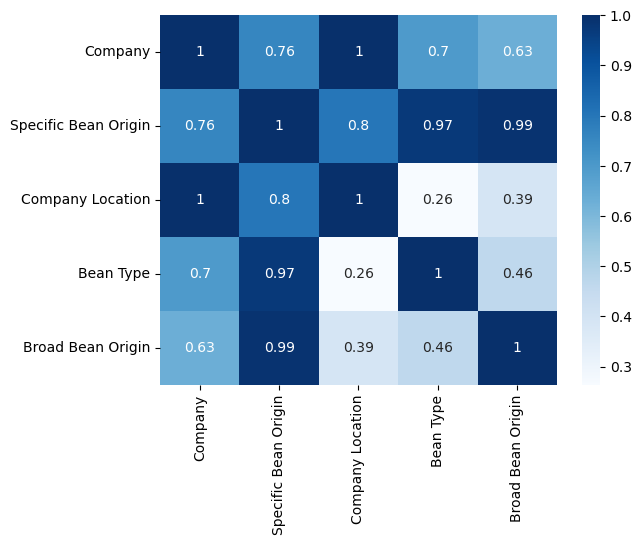

In [1155]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1156]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1157]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1158]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1159]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1160]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1161]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6592
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1162]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1163]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1164]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1165]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1166]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1167]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1168]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1169]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1170]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1171]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1172]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1173]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1174]:
pred = model.predict(test)

In [1175]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1176]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6592
0.9571325716027853
0.03439173852961773


# Результат

In [1177]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

9991
0.9569137889564514
0.03424999698631989


Загрузка данных

In [1178]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1179]:
train_df = pd.read_csv(TRAIN)

In [1180]:
test_df = pd.read_csv(TEST)

In [1181]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1182]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1183]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1184]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1185]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1186]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1187]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1188]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1189]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1190]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1191]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1192]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1193]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1194]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1195]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1196]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

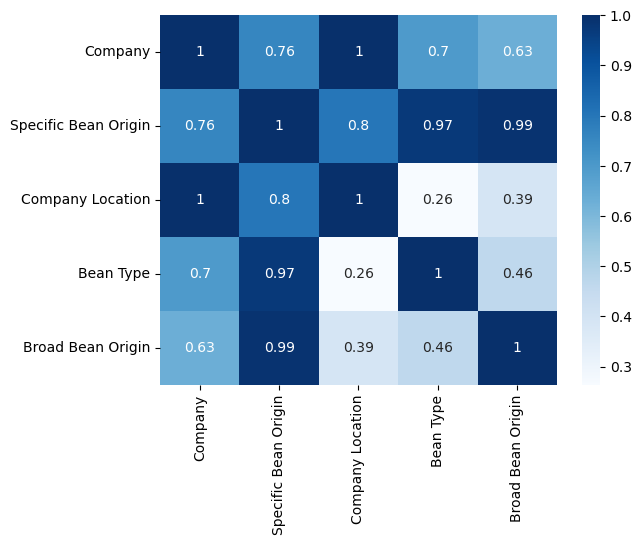

In [1197]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1198]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1199]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1200]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1201]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1202]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1203]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1460
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1204]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1205]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1206]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1207]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1208]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1209]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1210]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1211]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1212]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1213]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1214]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1215]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1216]:
pred = model.predict(test)

In [1217]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1218]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1460
0.9618215556786172
0.03244613751387179


# Результат

In [1219]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1220]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1221]:
train_df = pd.read_csv(TRAIN)

In [1222]:
test_df = pd.read_csv(TEST)

In [1223]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1224]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1225]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1226]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1227]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1228]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1229]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1230]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1231]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1232]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1233]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1234]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1235]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1236]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1237]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1238]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

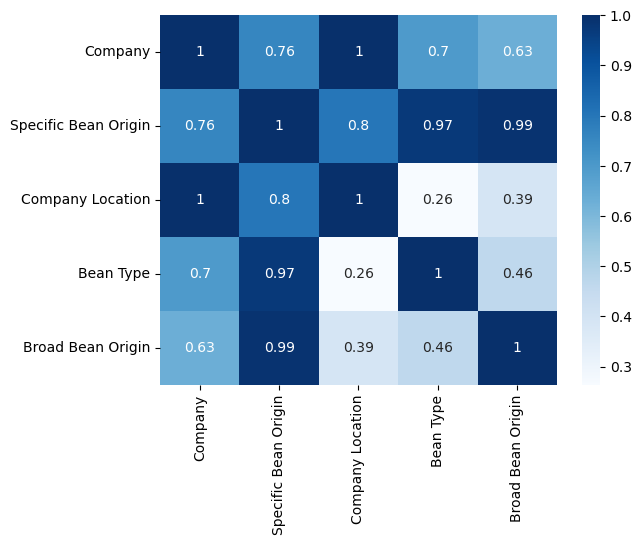

In [1239]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1240]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1241]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1242]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1243]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1244]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1245]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6348
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1246]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1247]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1248]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1249]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1250]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1251]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1252]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1253]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1254]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1255]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1256]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1257]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1258]:
pred = model.predict(test)

In [1259]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1260]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6348
0.952594260043584
0.03581270436407642


# Результат

In [1261]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1262]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1263]:
train_df = pd.read_csv(TRAIN)

In [1264]:
test_df = pd.read_csv(TEST)

In [1265]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1266]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1267]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1268]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1269]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1270]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1271]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1272]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1273]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1274]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1275]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1276]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1277]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1278]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1279]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1280]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

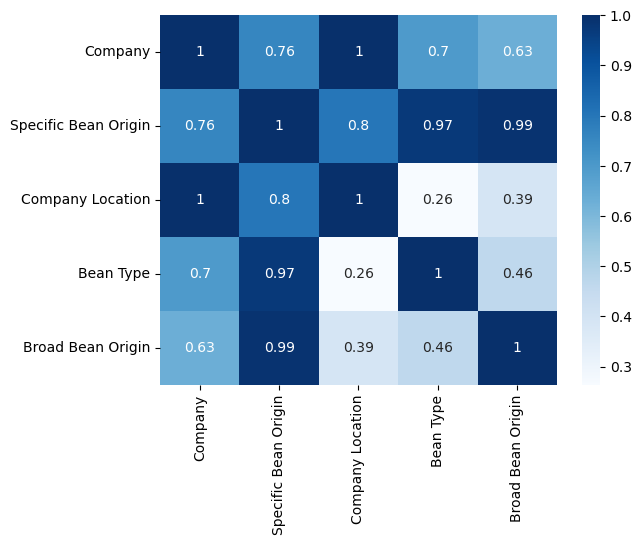

In [1281]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1282]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1283]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1284]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1285]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1286]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1287]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1633
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1288]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1289]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1290]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1291]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1292]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1293]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1294]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1295]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1296]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1297]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1298]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1299]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1300]:
pred = model.predict(test)

In [1301]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1302]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1633
0.9553047475223102
0.03451224940463688


# Результат

In [1303]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1304]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1305]:
train_df = pd.read_csv(TRAIN)

In [1306]:
test_df = pd.read_csv(TEST)

In [1307]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1308]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1309]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1310]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1311]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1312]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1313]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1314]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1315]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1316]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1317]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1318]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1319]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1320]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1321]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1322]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

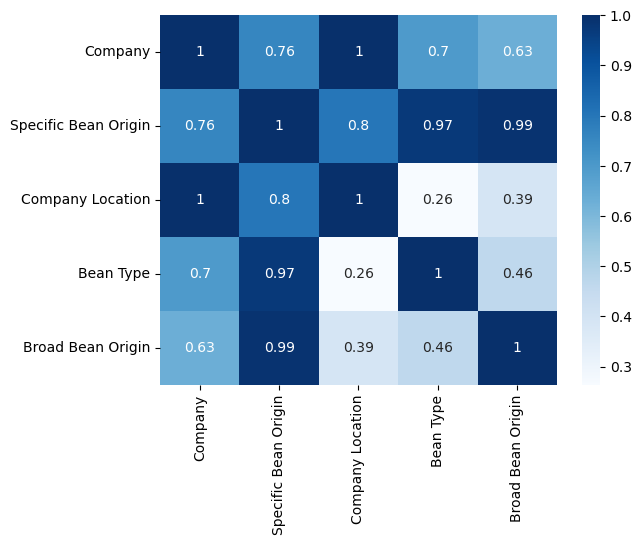

In [1323]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1324]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1325]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1326]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1327]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1328]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1329]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6171
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1330]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1331]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1332]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1333]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1334]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1335]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1336]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1337]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1338]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1339]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1340]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1341]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1342]:
pred = model.predict(test)

In [1343]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1344]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6171
0.9573230964835886
0.034266008392698256


# Результат

In [1345]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1346]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1347]:
train_df = pd.read_csv(TRAIN)

In [1348]:
test_df = pd.read_csv(TEST)

In [1349]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1350]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1351]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1352]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1353]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1354]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1355]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1356]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1357]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1358]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1359]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1360]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1361]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1362]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1363]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1364]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

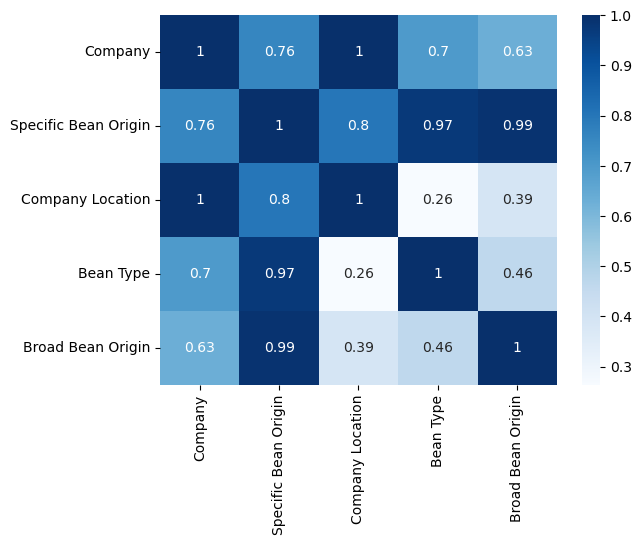

In [1365]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1366]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1367]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1368]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1369]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1370]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1371]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

9328
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1372]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1373]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1374]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1375]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1376]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1377]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1378]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1379]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1380]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1381]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1382]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1383]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1384]:
pred = model.predict(test)

In [1385]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1386]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

9328
0.9528833165190349
0.036731860896114084


# Результат

In [1387]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1388]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1389]:
train_df = pd.read_csv(TRAIN)

In [1390]:
test_df = pd.read_csv(TEST)

In [1391]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1392]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1393]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1394]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1395]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1396]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1397]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1398]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1399]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1400]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1401]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1402]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1403]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1404]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1405]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1406]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

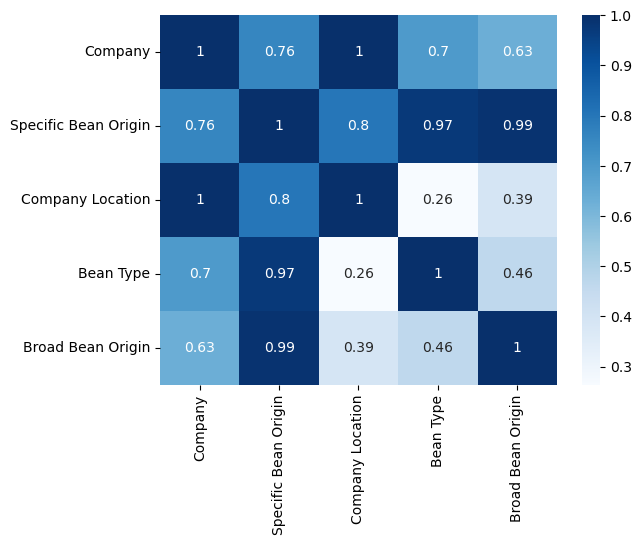

In [1407]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1408]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1409]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1410]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1411]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1412]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1413]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5381
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1414]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1415]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1416]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1417]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1418]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1419]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1420]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1421]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1422]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1423]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1424]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1425]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1426]:
pred = model.predict(test)

In [1427]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1428]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5381
0.9577609144627659
0.03497070923909039


# Результат

In [1429]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1430]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1431]:
train_df = pd.read_csv(TRAIN)

In [1432]:
test_df = pd.read_csv(TEST)

In [1433]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1434]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1435]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1436]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1437]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1438]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1439]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1440]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1441]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1442]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1443]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1444]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1445]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1446]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1447]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1448]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

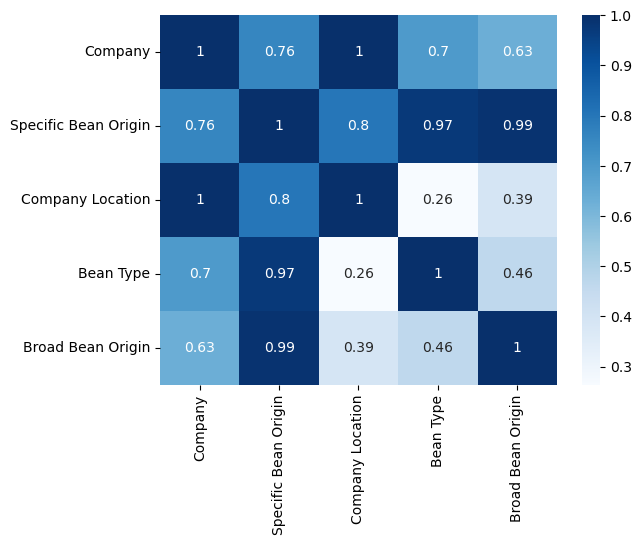

In [1449]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1450]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1451]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1452]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1453]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1454]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1455]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6943
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1456]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1457]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1458]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1459]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1460]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1461]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1462]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1463]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1464]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1465]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1466]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1467]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1468]:
pred = model.predict(test)

In [1469]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1470]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6943
0.9544595213515722
0.03554992644220518


# Результат

In [1471]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1472]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1473]:
train_df = pd.read_csv(TRAIN)

In [1474]:
test_df = pd.read_csv(TEST)

In [1475]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1476]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1477]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1478]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1479]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1480]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1481]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1482]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1483]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1484]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1485]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1486]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1487]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1488]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1489]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1490]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

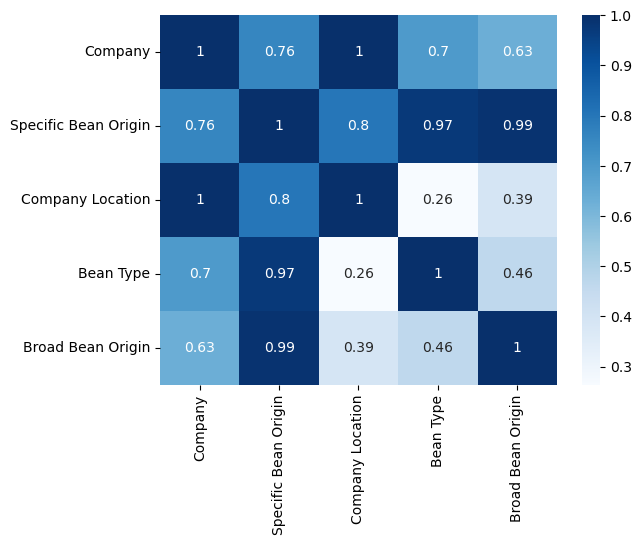

In [1491]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1492]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1493]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1494]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1495]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1496]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1497]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6405
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1498]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1499]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1500]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1501]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1502]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1503]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1504]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1505]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1506]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1507]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1508]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1509]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1510]:
pred = model.predict(test)

In [1511]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1512]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6405
0.9563819271028424
0.035709760751631674


# Результат

In [1513]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1514]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1515]:
train_df = pd.read_csv(TRAIN)

In [1516]:
test_df = pd.read_csv(TEST)

In [1517]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1518]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1519]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1520]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1521]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1522]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1523]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1524]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1525]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1526]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1527]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1528]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1529]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1530]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1531]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1532]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

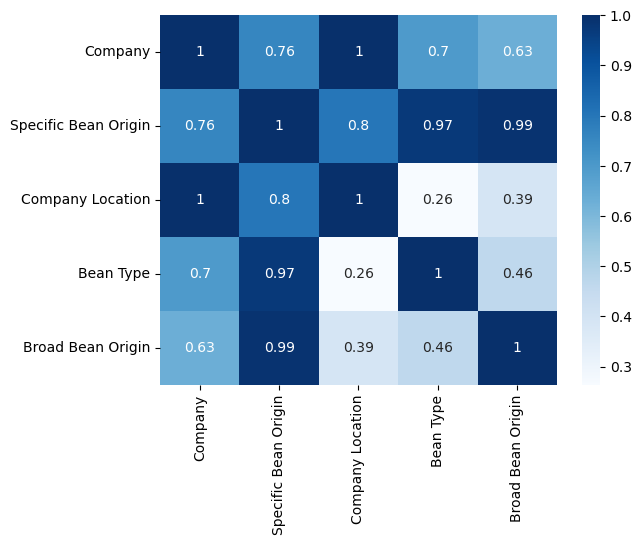

In [1533]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1534]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1535]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1536]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1537]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1538]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1539]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4631
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1540]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1541]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1542]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1543]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1544]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1545]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1546]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1547]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1548]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1549]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1550]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1551]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1552]:
pred = model.predict(test)

In [1553]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1554]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4631
0.9587794271219284
0.03418294522867345


# Результат

In [1555]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1556]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1557]:
train_df = pd.read_csv(TRAIN)

In [1558]:
test_df = pd.read_csv(TEST)

In [1559]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1560]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1561]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1562]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1563]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1564]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1565]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1566]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1567]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1568]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1569]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1570]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1571]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1572]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1573]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1574]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

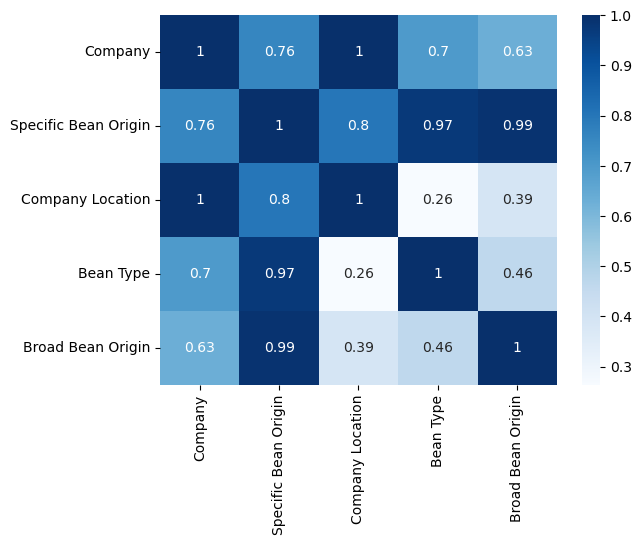

In [1575]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1576]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1577]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1578]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1579]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1580]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1581]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

7805
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1582]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1583]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1584]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1585]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1586]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1587]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1588]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1589]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1590]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1591]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1592]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1593]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1594]:
pred = model.predict(test)

In [1595]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1596]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

7805
0.9580248455648205
0.0333364527048165


# Результат

In [1597]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1598]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1599]:
train_df = pd.read_csv(TRAIN)

In [1600]:
test_df = pd.read_csv(TEST)

In [1601]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1602]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1603]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1604]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1605]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1606]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1607]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1608]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1609]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1610]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1611]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1612]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1613]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1614]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1615]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1616]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

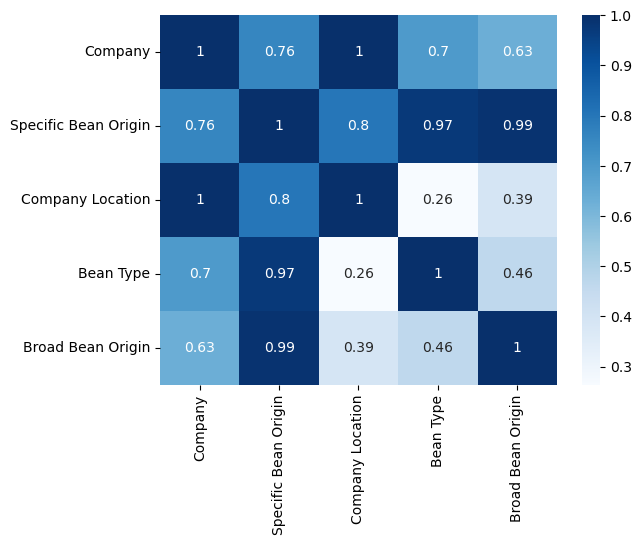

In [1617]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1618]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1619]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1620]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1621]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1622]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1623]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3728
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1624]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1625]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1626]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1627]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1628]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1629]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1630]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1631]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1632]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1633]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1634]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1635]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1636]:
pred = model.predict(test)

In [1637]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1638]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3728
0.9565354757095031
0.03500639065689848


# Результат

In [1639]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1640]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1641]:
train_df = pd.read_csv(TRAIN)

In [1642]:
test_df = pd.read_csv(TEST)

In [1643]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1644]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1645]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1646]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1647]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1648]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1649]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1650]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1651]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1652]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1653]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1654]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1655]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1656]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1657]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1658]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

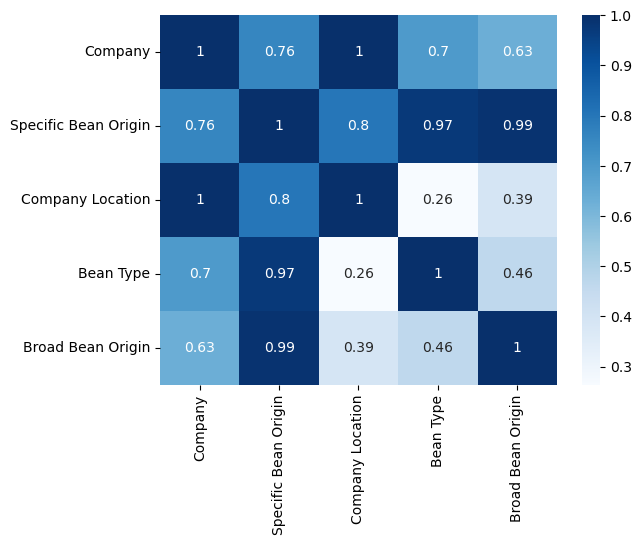

In [1659]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1660]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1661]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1662]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1663]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1664]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1665]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

985
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1666]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1667]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1668]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1669]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1670]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1671]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1672]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1673]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1674]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1675]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1676]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1677]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1678]:
pred = model.predict(test)

In [1679]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1680]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

985
0.955989841475085
0.034481317585721934


# Результат

In [1681]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1682]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1683]:
train_df = pd.read_csv(TRAIN)

In [1684]:
test_df = pd.read_csv(TEST)

In [1685]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1686]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1687]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1688]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1689]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1690]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1691]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1692]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1693]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1694]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1695]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1696]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1697]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1698]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1699]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1700]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

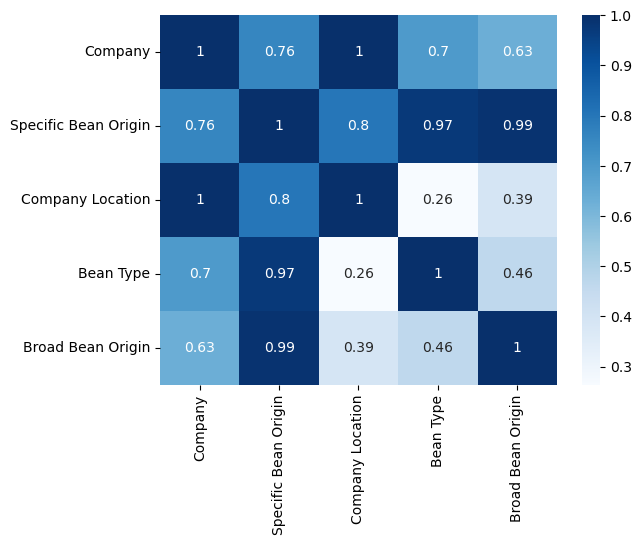

In [1701]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1702]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1703]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1704]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1705]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1706]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1707]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2017
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1708]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1709]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1710]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1711]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1712]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1713]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1714]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1715]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1716]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1717]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1718]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1719]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1720]:
pred = model.predict(test)

In [1721]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1722]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2017
0.9578793400515874
0.034708713596354364


# Результат

In [1723]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1724]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1725]:
train_df = pd.read_csv(TRAIN)

In [1726]:
test_df = pd.read_csv(TEST)

In [1727]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1728]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1729]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1730]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1731]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1732]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1733]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1734]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1735]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1736]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1737]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1738]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1739]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1740]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1741]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1742]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

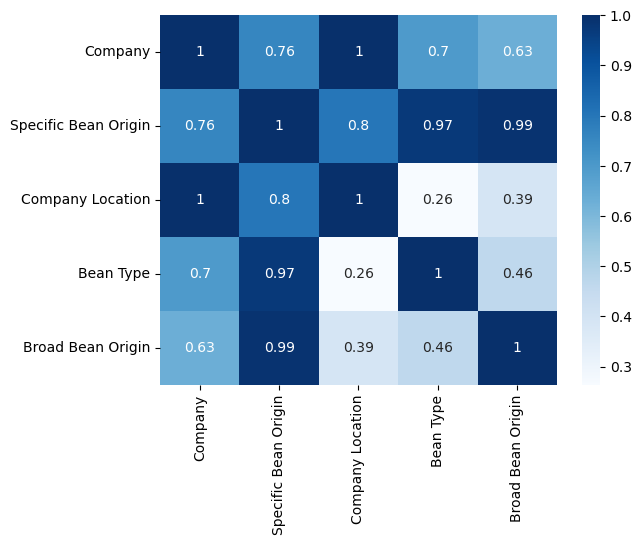

In [1743]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1744]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1745]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1746]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1747]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1748]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1749]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

9511
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1750]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1751]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1752]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1753]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1754]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1755]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1756]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1757]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1758]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1759]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1760]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1761]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1762]:
pred = model.predict(test)

In [1763]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1764]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

9511
0.9551421505679657
0.035313715224426126


# Результат

In [1765]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1766]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1767]:
train_df = pd.read_csv(TRAIN)

In [1768]:
test_df = pd.read_csv(TEST)

In [1769]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1770]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1771]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1772]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1773]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1774]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1775]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1776]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1777]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1778]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1779]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1780]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1781]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1782]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1783]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1784]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

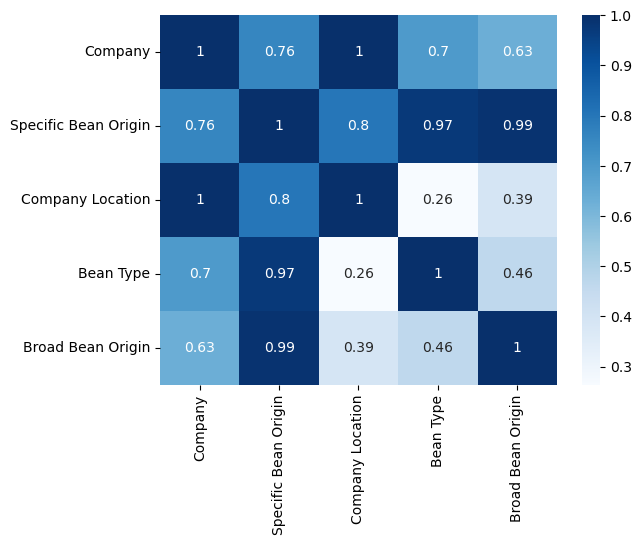

In [1785]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1786]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1787]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1788]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1789]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1790]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1791]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

9157
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1792]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1793]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1794]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1795]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1796]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1797]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1798]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1799]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1800]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1801]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1802]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1803]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1804]:
pred = model.predict(test)

In [1805]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1806]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

9157
0.956704927700765
0.03488762677477102


# Результат

In [1807]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1808]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1809]:
train_df = pd.read_csv(TRAIN)

In [1810]:
test_df = pd.read_csv(TEST)

In [1811]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1812]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1813]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1814]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1815]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1816]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1817]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1818]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1819]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1820]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1821]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1822]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1823]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1824]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1825]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1826]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

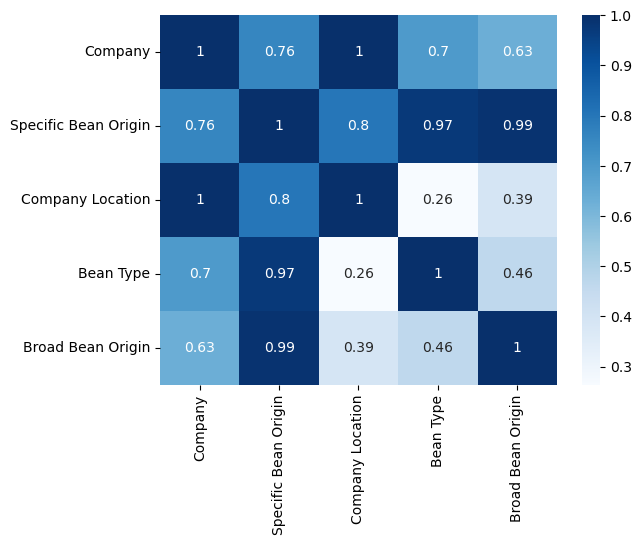

In [1827]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1828]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1829]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1830]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1831]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1832]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1833]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5919
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1834]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1835]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1836]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1837]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1838]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1839]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1840]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1841]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1842]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1843]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1844]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1845]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1846]:
pred = model.predict(test)

In [1847]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1848]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5919
0.9594119336670612
0.0334985338854133


# Результат

In [1849]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1850]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1851]:
train_df = pd.read_csv(TRAIN)

In [1852]:
test_df = pd.read_csv(TEST)

In [1853]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1854]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1855]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1856]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1857]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1858]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1859]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1860]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1861]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1862]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1863]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1864]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1865]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1866]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1867]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1868]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

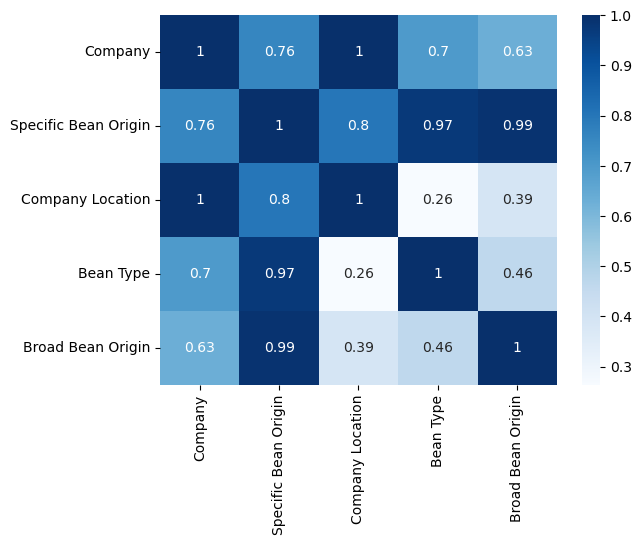

In [1869]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1870]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1871]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1872]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1873]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1874]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1875]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3875
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1876]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1877]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1878]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1879]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1880]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1881]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1882]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1883]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1884]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1885]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1886]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1887]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1888]:
pred = model.predict(test)

In [1889]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1890]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3875
0.9516467486864554
0.037769025967925605


# Результат

In [1891]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1892]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1893]:
train_df = pd.read_csv(TRAIN)

In [1894]:
test_df = pd.read_csv(TEST)

In [1895]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1896]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1897]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1898]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1899]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1900]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1901]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1902]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1903]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1904]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1905]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1906]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1907]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1908]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1909]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1910]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

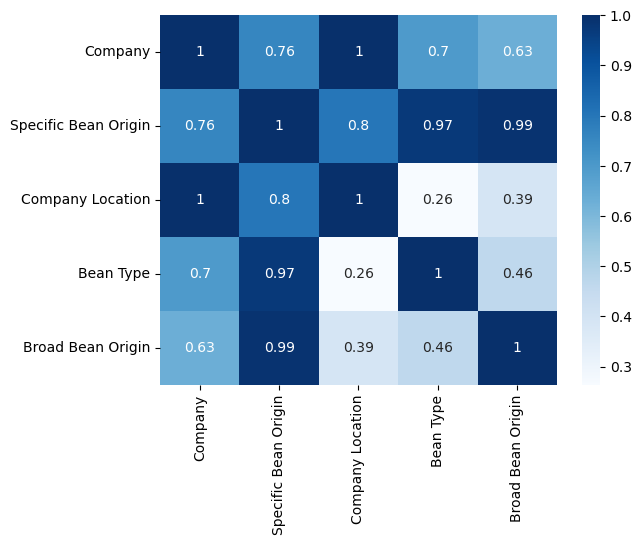

In [1911]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1912]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1913]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1914]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1915]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1916]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1917]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4691
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1918]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1919]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1920]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1921]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1922]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1923]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1924]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1925]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1926]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1927]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1928]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1929]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1930]:
pred = model.predict(test)

In [1931]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1932]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4691
0.9553224143103312
0.035169042743166706


# Результат

In [1933]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1934]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1935]:
train_df = pd.read_csv(TRAIN)

In [1936]:
test_df = pd.read_csv(TEST)

In [1937]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1938]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1939]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1940]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1941]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1942]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1943]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1944]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1945]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1946]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1947]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1948]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1949]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1950]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1951]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1952]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

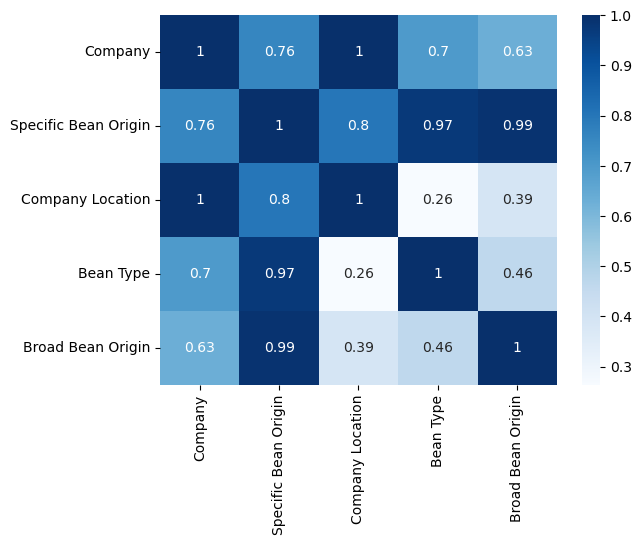

In [1953]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1954]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1955]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1956]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1957]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [1958]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [1959]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

9836
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [1960]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [1961]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [1962]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [1963]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1964]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1965]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [1966]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [1967]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [1968]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [1969]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [1970]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [1971]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [1972]:
pred = model.predict(test)

In [1973]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [1974]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

9836
0.9592475837899479
0.033941777069328466


# Результат

In [1975]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [1976]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [1977]:
train_df = pd.read_csv(TRAIN)

In [1978]:
test_df = pd.read_csv(TEST)

In [1979]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [1980]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [1981]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [1982]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1983]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [1984]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [1985]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [1986]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [1987]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [1988]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [1989]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [1990]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [1991]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [1992]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [1993]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [1994]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

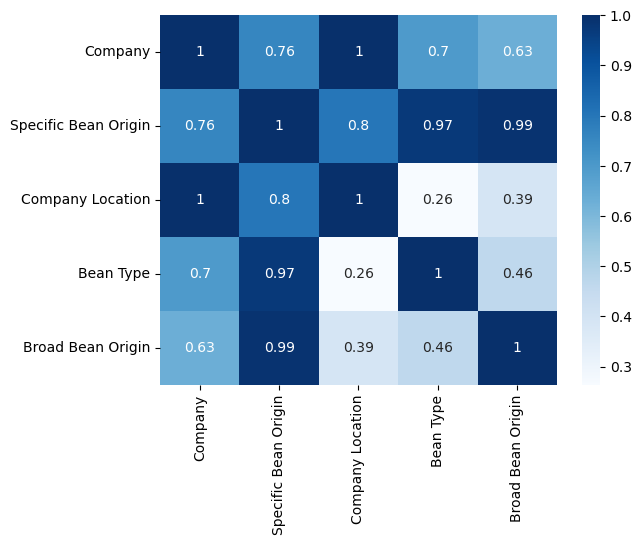

In [1995]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [1996]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [1997]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [1998]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [1999]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2000]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2001]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3794
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2002]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2003]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2004]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2005]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2006]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2007]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2008]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2009]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2010]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2011]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2012]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2013]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2014]:
pred = model.predict(test)

In [2015]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2016]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3794
0.9543636127488423
0.03561680048773467


# Результат

In [2017]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2018]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2019]:
train_df = pd.read_csv(TRAIN)

In [2020]:
test_df = pd.read_csv(TEST)

In [2021]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2022]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2023]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2024]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2025]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2026]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2027]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2028]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2029]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2030]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2031]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2032]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2033]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2034]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2035]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2036]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

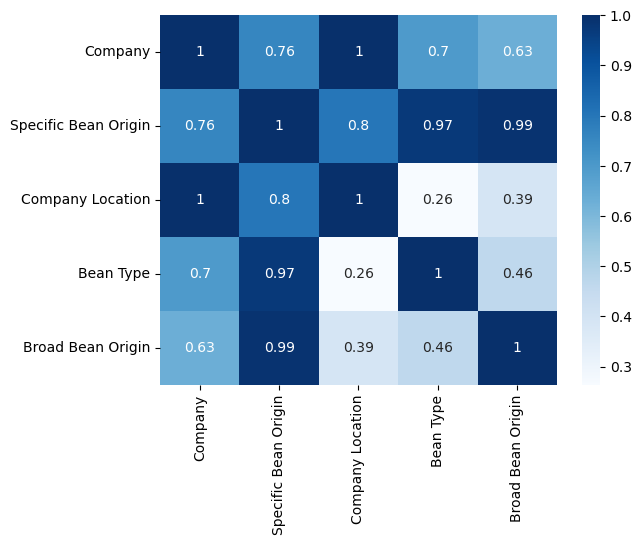

In [2037]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2038]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2039]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2040]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2041]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2042]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2043]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2695
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2044]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2045]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2046]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2047]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2048]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2049]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2050]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2051]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2052]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2053]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2054]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2055]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2056]:
pred = model.predict(test)

In [2057]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2058]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2695
0.9578729506983005
0.034285013240265075


# Результат

In [2059]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2060]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2061]:
train_df = pd.read_csv(TRAIN)

In [2062]:
test_df = pd.read_csv(TEST)

In [2063]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2064]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2065]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2066]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2067]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2068]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2069]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2070]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2071]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2072]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2073]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2074]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2075]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2076]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2077]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2078]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

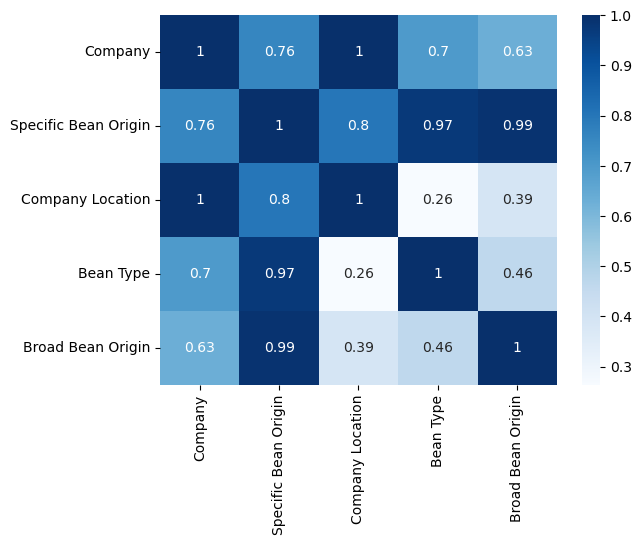

In [2079]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2080]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2081]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2082]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2083]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2084]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2085]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6699
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2086]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2087]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2088]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2089]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2090]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2091]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2092]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2093]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2094]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2095]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2096]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2097]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2098]:
pred = model.predict(test)

In [2099]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2100]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6699
0.9557835088061145
0.035618789659567114


# Результат

In [2101]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2102]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2103]:
train_df = pd.read_csv(TRAIN)

In [2104]:
test_df = pd.read_csv(TEST)

In [2105]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2106]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2107]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2108]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2109]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2110]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2111]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2112]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2113]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2114]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2115]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2116]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2117]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2118]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2119]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2120]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

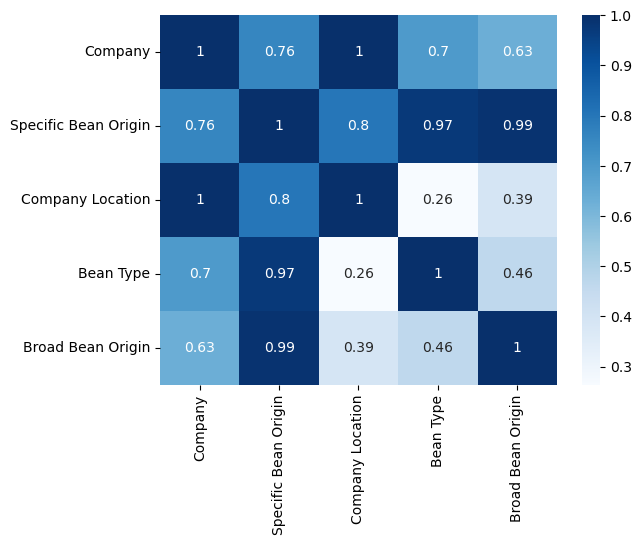

In [2121]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2122]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2123]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2124]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2125]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2126]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2127]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

918
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2128]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2129]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2130]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2131]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2132]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2133]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2134]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2135]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2136]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2137]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2138]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2139]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2140]:
pred = model.predict(test)

In [2141]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2142]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

918
0.9578101045576701
0.0345861301353898


# Результат

In [2143]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2144]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2145]:
train_df = pd.read_csv(TRAIN)

In [2146]:
test_df = pd.read_csv(TEST)

In [2147]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2148]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2149]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2150]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2151]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2152]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2153]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2154]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2155]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2156]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2157]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2158]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2159]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2160]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2161]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2162]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

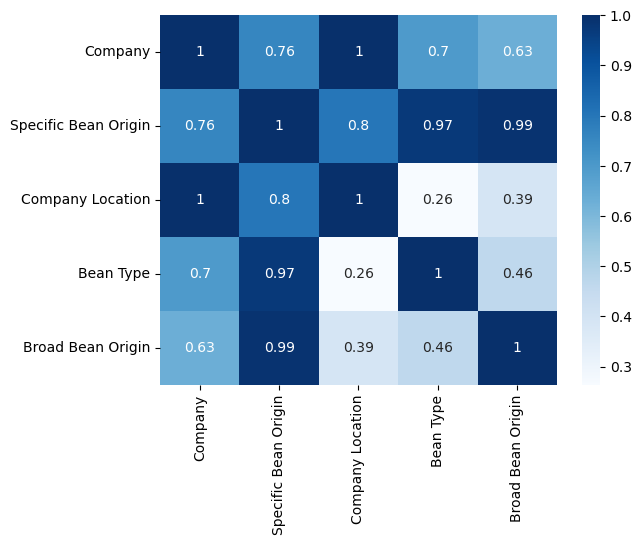

In [2163]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2164]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2165]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2166]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2167]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2168]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2169]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6032
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2170]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2171]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2172]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2173]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2174]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2175]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2176]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2177]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2178]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2179]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2180]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2181]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2182]:
pred = model.predict(test)

In [2183]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2184]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6032
0.9589120721542062
0.033931211021769436


# Результат

In [2185]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2186]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2187]:
train_df = pd.read_csv(TRAIN)

In [2188]:
test_df = pd.read_csv(TEST)

In [2189]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2190]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2191]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2192]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2193]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2194]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2195]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2196]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2197]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2198]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2199]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2200]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2201]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2202]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2203]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2204]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

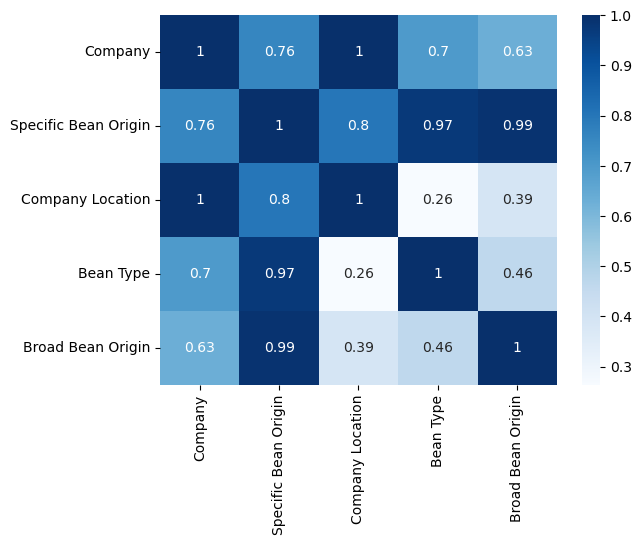

In [2205]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2206]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2207]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2208]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2209]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2210]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2211]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3635
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2212]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2213]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2214]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2215]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2216]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2217]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2218]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2219]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2220]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2221]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2222]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2223]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2224]:
pred = model.predict(test)

In [2225]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2226]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3635
0.958253706600038
0.03427614026653564


# Результат

In [2227]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2228]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2229]:
train_df = pd.read_csv(TRAIN)

In [2230]:
test_df = pd.read_csv(TEST)

In [2231]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2232]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2233]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2234]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2235]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2236]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2237]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2238]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2239]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2240]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2241]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2242]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2243]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2244]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2245]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2246]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

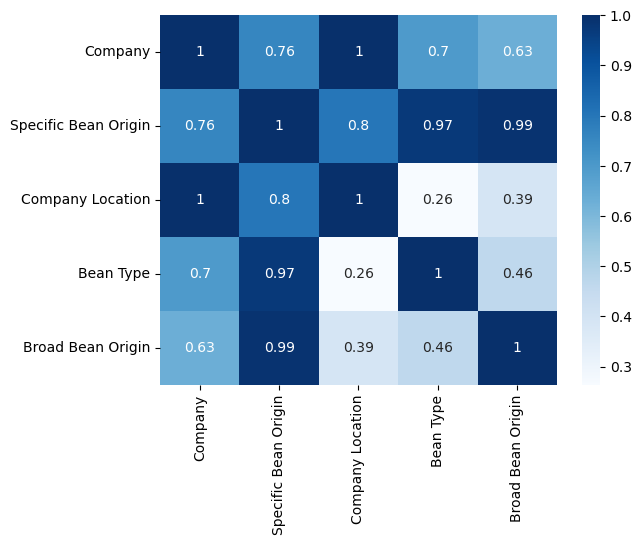

In [2247]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2248]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2249]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2250]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2251]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2252]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2253]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5457
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2254]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2255]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2256]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2257]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2258]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2259]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2260]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2261]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2262]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2263]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2264]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2265]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2266]:
pred = model.predict(test)

In [2267]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2268]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5457
0.9556985120826701
0.0354906640163328


# Результат

In [2269]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2270]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2271]:
train_df = pd.read_csv(TRAIN)

In [2272]:
test_df = pd.read_csv(TEST)

In [2273]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2274]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2275]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2276]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2277]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2278]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2279]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2280]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2281]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2282]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2283]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2284]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2285]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2286]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2287]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2288]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

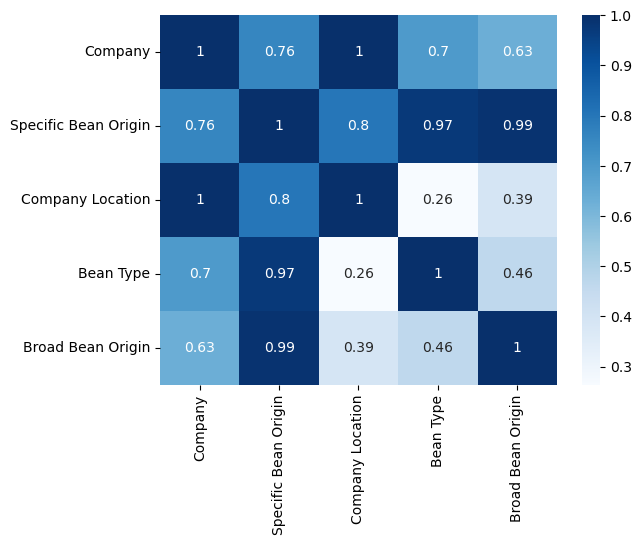

In [2289]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2290]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2291]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2292]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2293]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2294]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2295]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3827
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2296]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2297]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2298]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2299]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2300]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2301]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2302]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2303]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2304]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2305]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2306]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2307]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2308]:
pred = model.predict(test)

In [2309]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2310]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3827
0.9506945418090209
0.03612813584783472


# Результат

In [2311]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2312]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2313]:
train_df = pd.read_csv(TRAIN)

In [2314]:
test_df = pd.read_csv(TEST)

In [2315]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2316]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2317]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2318]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2319]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2320]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2321]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2322]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2323]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2324]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2325]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2326]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2327]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2328]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2329]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2330]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

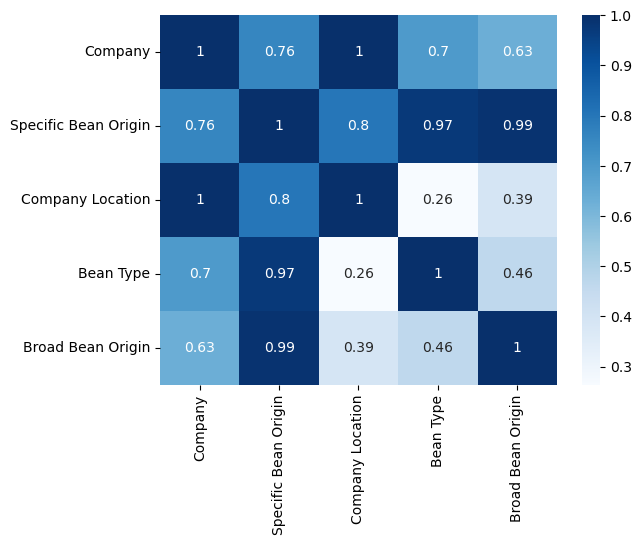

In [2331]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2332]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2333]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2334]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2335]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2336]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2337]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3097
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2338]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2339]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2340]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2341]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2342]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2343]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2344]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2345]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2346]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2347]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2348]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2349]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2350]:
pred = model.predict(test)

In [2351]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2352]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3097
0.9595748601144342
0.03390121852010723


# Результат

In [2353]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2354]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2355]:
train_df = pd.read_csv(TRAIN)

In [2356]:
test_df = pd.read_csv(TEST)

In [2357]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2358]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2359]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2360]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2361]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2362]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2363]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2364]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2365]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2366]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2367]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2368]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2369]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2370]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2371]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2372]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

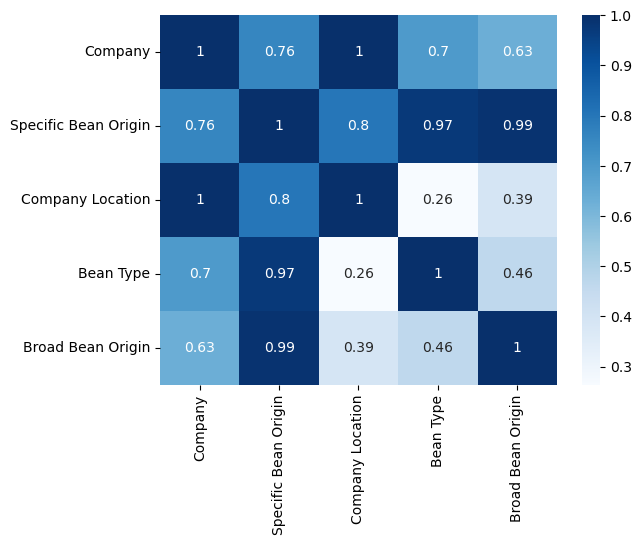

In [2373]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2374]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2375]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2376]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2377]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2378]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2379]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

205
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2380]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2381]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2382]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2383]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2384]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2385]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2386]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2387]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2388]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2389]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2390]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2391]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2392]:
pred = model.predict(test)

In [2393]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2394]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

205
0.9572047513365977
0.03425310367691098


# Результат

In [2395]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2396]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2397]:
train_df = pd.read_csv(TRAIN)

In [2398]:
test_df = pd.read_csv(TEST)

In [2399]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2400]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2401]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2402]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2403]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2404]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2405]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2406]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2407]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2408]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2409]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2410]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2411]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2412]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2413]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2414]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

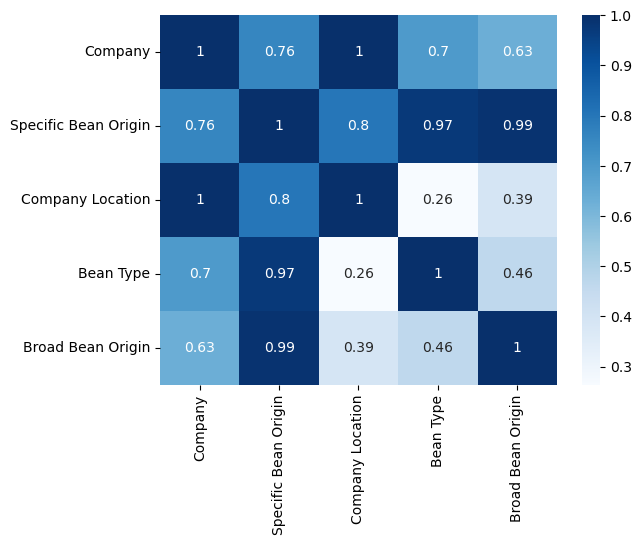

In [2415]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2416]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2417]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2418]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2419]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2420]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2421]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5570
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2422]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2423]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2424]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2425]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2426]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2427]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2428]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2429]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2430]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2431]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2432]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2433]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2434]:
pred = model.predict(test)

In [2435]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2436]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5570
0.954610834347867
0.03498240938528683


# Результат

In [2437]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2438]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2439]:
train_df = pd.read_csv(TRAIN)

In [2440]:
test_df = pd.read_csv(TEST)

In [2441]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2442]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2443]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2444]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2445]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2446]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2447]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2448]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2449]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2450]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2451]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2452]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2453]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2454]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2455]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2456]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

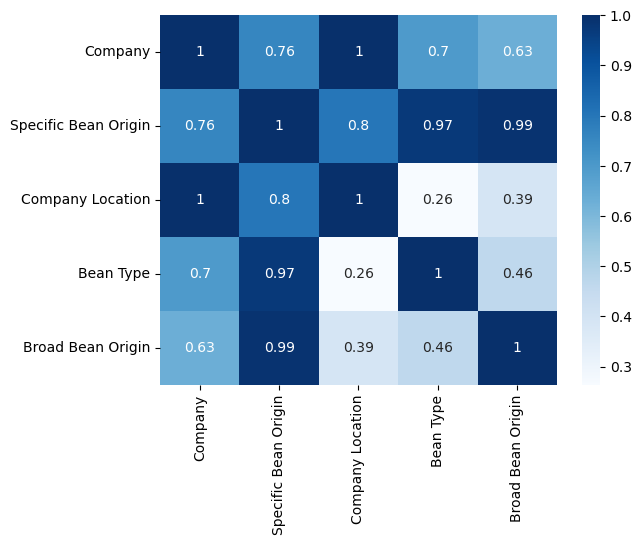

In [2457]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2458]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2459]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2460]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2461]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2462]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2463]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

443
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2464]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2465]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2466]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2467]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2468]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2469]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2470]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2471]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2472]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2473]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2474]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2475]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2476]:
pred = model.predict(test)

In [2477]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2478]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

443
0.9585885093426494
0.03365363584504861


# Результат

In [2479]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2480]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2481]:
train_df = pd.read_csv(TRAIN)

In [2482]:
test_df = pd.read_csv(TEST)

In [2483]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2484]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2485]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2486]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2487]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2488]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2489]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2490]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2491]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2492]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2493]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2494]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2495]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2496]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2497]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2498]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

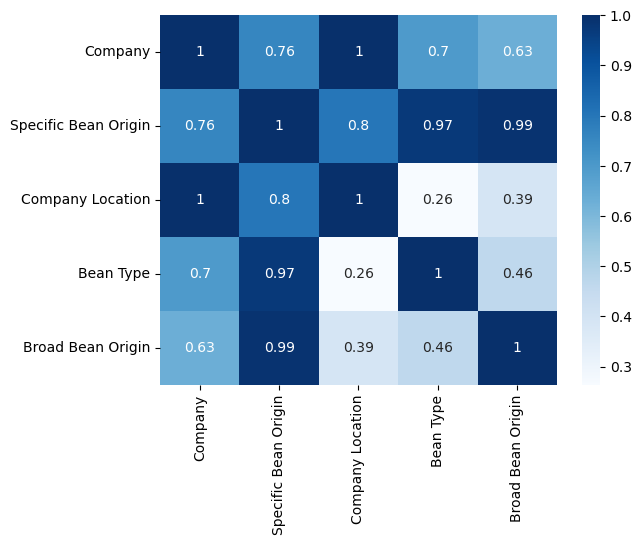

In [2499]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2500]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2501]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2502]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2503]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2504]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2505]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5653
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2506]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2507]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2508]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2509]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2510]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2511]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2512]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2513]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2514]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2515]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2516]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2517]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2518]:
pred = model.predict(test)

In [2519]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2520]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5653
0.9573427260032971
0.03387367921971788


# Результат

In [2521]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2522]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2523]:
train_df = pd.read_csv(TRAIN)

In [2524]:
test_df = pd.read_csv(TEST)

In [2525]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2526]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2527]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2528]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2529]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2530]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2531]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2532]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2533]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2534]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2535]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2536]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2537]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2538]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2539]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2540]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

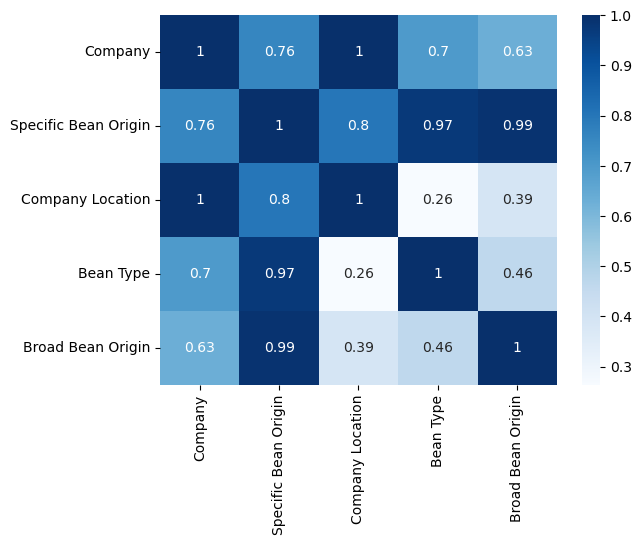

In [2541]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2542]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2543]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2544]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2545]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2546]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2547]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5047
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2548]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2549]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2550]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2551]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2552]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2553]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2554]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2555]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2556]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2557]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2558]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2559]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2560]:
pred = model.predict(test)

In [2561]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2562]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5047
0.9579410549115155
0.03413486148997879


# Результат

In [2563]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2564]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2565]:
train_df = pd.read_csv(TRAIN)

In [2566]:
test_df = pd.read_csv(TEST)

In [2567]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2568]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2569]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2570]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2571]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2572]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2573]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2574]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2575]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2576]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2577]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2578]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2579]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2580]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2581]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2582]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

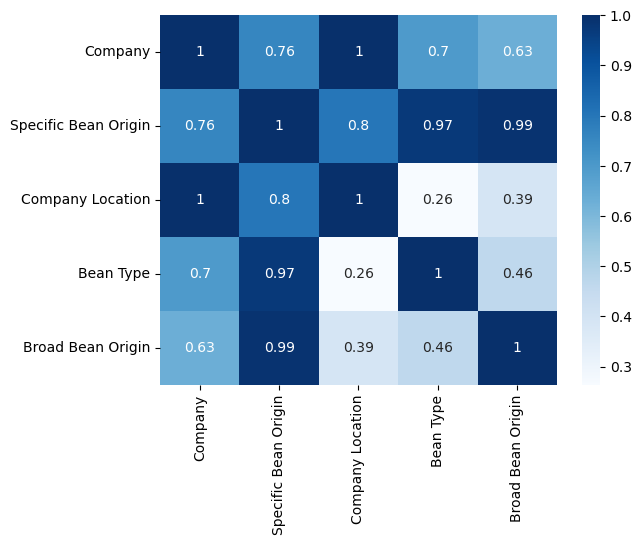

In [2583]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2584]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2585]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2586]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2587]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2588]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2589]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5410
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2590]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2591]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2592]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2593]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2594]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2595]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2596]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2597]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2598]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2599]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2600]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2601]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2602]:
pred = model.predict(test)

In [2603]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2604]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5410
0.9530955746524911
0.03694015912574716


# Результат

In [2605]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2606]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2607]:
train_df = pd.read_csv(TRAIN)

In [2608]:
test_df = pd.read_csv(TEST)

In [2609]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2610]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2611]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2612]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2613]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2614]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2615]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2616]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2617]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2618]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2619]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2620]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2621]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2622]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2623]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2624]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

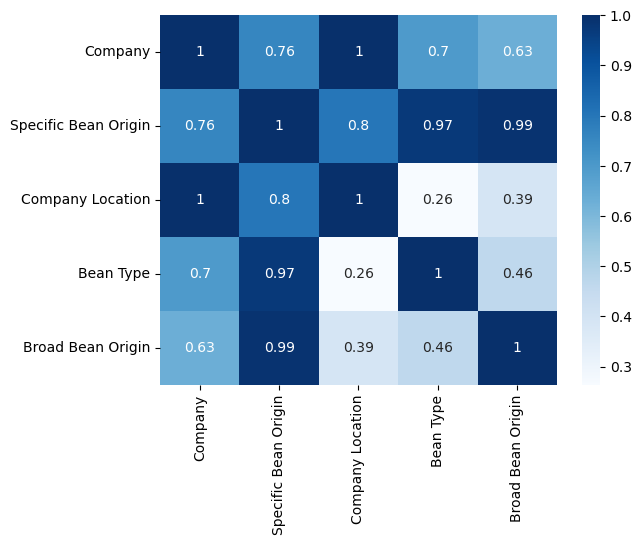

In [2625]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2626]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2627]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2628]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2629]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2630]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2631]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

8292
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2632]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2633]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2634]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2635]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2636]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2637]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2638]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2639]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2640]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2641]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2642]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2643]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2644]:
pred = model.predict(test)

In [2645]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2646]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

8292
0.9551355724289169
0.03555282601521556


# Результат

In [2647]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2648]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2649]:
train_df = pd.read_csv(TRAIN)

In [2650]:
test_df = pd.read_csv(TEST)

In [2651]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2652]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2653]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2654]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2655]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2656]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2657]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2658]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2659]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2660]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2661]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2662]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2663]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2664]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2665]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2666]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

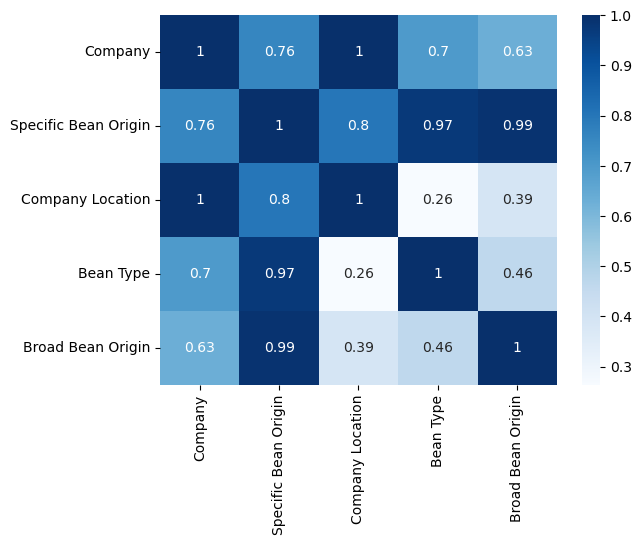

In [2667]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2668]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2669]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2670]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2671]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2672]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2673]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2647
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2674]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2675]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2676]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2677]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2678]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2679]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2680]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2681]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2682]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2683]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2684]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2685]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2686]:
pred = model.predict(test)

In [2687]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2688]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2647
0.954361767533425
0.03597715956019696


# Результат

In [2689]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2690]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2691]:
train_df = pd.read_csv(TRAIN)

In [2692]:
test_df = pd.read_csv(TEST)

In [2693]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2694]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2695]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2696]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2697]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2698]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2699]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2700]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2701]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2702]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2703]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2704]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2705]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2706]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2707]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2708]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

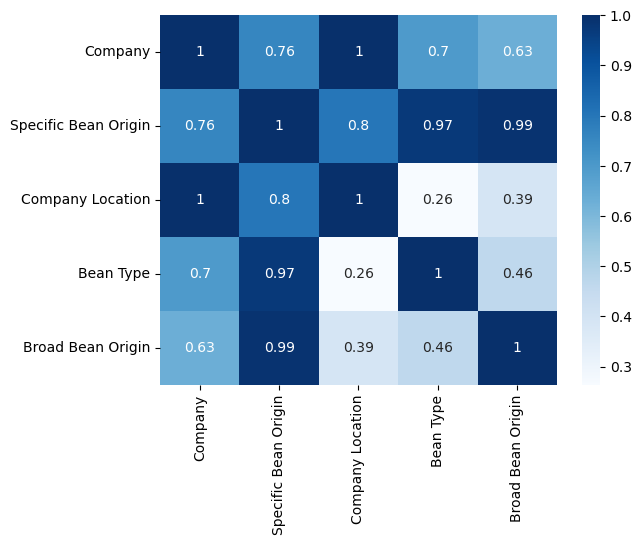

In [2709]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2710]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2711]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2712]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2713]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2714]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2715]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1512
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2716]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2717]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2718]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2719]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2720]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2721]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2722]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2723]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2724]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2725]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2726]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2727]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2728]:
pred = model.predict(test)

In [2729]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2730]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1512
0.9552631635935156
0.03520284453540604


# Результат

In [2731]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


<!-- # Загрузка данных -->

Загрузка данных

In [2732]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2733]:
train_df = pd.read_csv(TRAIN)

In [2734]:
test_df = pd.read_csv(TEST)

In [2735]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2736]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2737]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2738]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2739]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2740]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2741]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2742]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2743]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2744]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2745]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2746]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2747]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2748]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2749]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2750]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

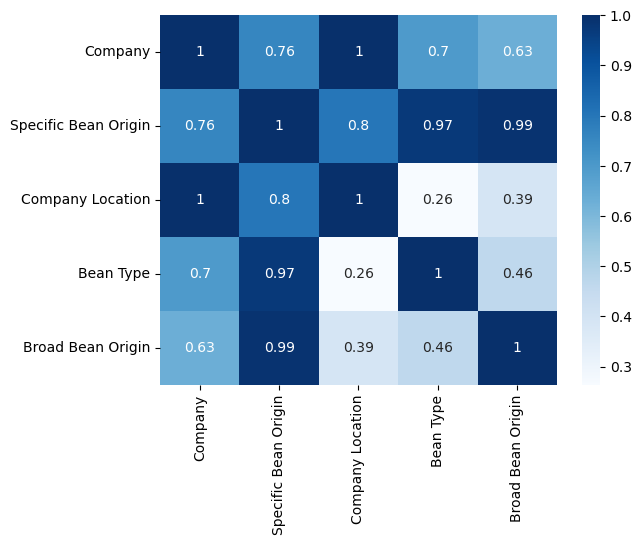

In [2751]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2752]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2753]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2754]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2755]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2756]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2757]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2958
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2758]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2759]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2760]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2761]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2762]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2763]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2764]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2765]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2766]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2767]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2768]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2769]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2770]:
pred = model.predict(test)

In [2771]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2772]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2958
0.9572637652356053
0.033631593453610734


# Результат

In [2773]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2774]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2775]:
train_df = pd.read_csv(TRAIN)

In [2776]:
test_df = pd.read_csv(TEST)

In [2777]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2778]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2779]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2780]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2781]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2782]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2783]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2784]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2785]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2786]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2787]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2788]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2789]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2790]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2791]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2792]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

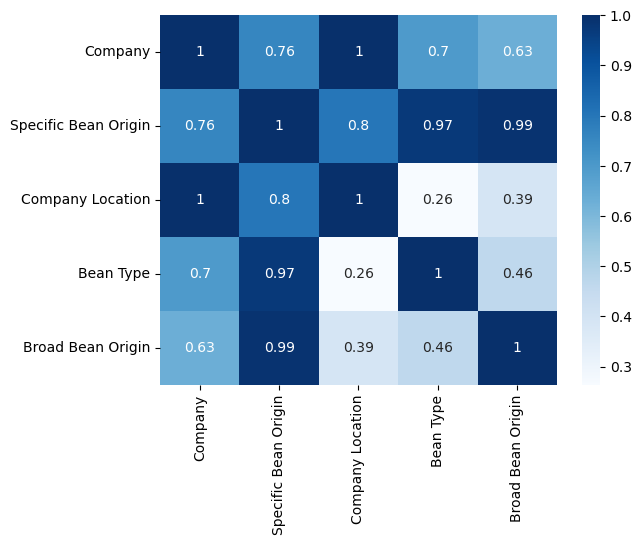

In [2793]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2794]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2795]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2796]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2797]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2798]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2799]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

8742
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2800]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2801]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2802]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2803]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2804]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2805]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2806]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2807]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2808]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2809]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2810]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2811]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2812]:
pred = model.predict(test)

In [2813]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2814]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

8742
0.9554425061828208
0.03462477860063802


# Результат

In [2815]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2816]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2817]:
train_df = pd.read_csv(TRAIN)

In [2818]:
test_df = pd.read_csv(TEST)

In [2819]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2820]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2821]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2822]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2823]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2824]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2825]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2826]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2827]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2828]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2829]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2830]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2831]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2832]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2833]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2834]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

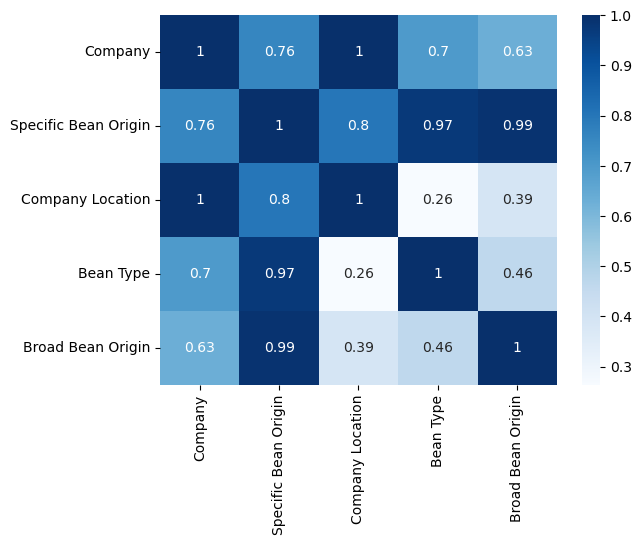

In [2835]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2836]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2837]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2838]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2839]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2840]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2841]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5294
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2842]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2843]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2844]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2845]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2846]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2847]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2848]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2849]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2850]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2851]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2852]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2853]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2854]:
pred = model.predict(test)

In [2855]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2856]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5294
0.9545649802553015
0.03644094125094186


# Результат

In [2857]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2858]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2859]:
train_df = pd.read_csv(TRAIN)

In [2860]:
test_df = pd.read_csv(TEST)

In [2861]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2862]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2863]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2864]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2865]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2866]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2867]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2868]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2869]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2870]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2871]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2872]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2873]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2874]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2875]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2876]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

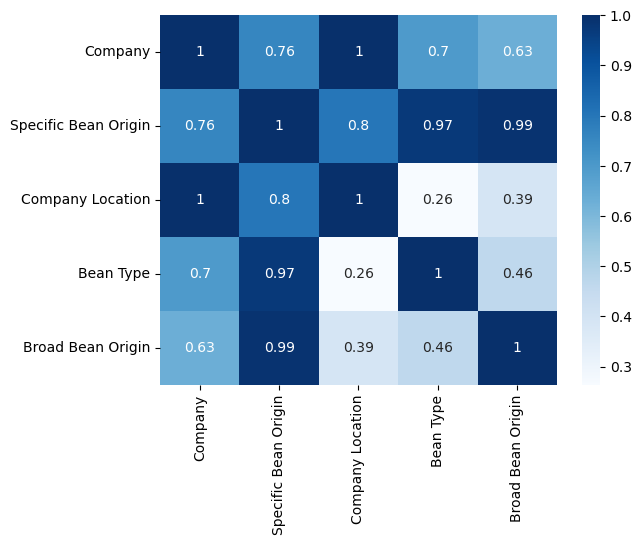

In [2877]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2878]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2879]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2880]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2881]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2882]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2883]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

713
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2884]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2885]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2886]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2887]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2888]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2889]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2890]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2891]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2892]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2893]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2894]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2895]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2896]:
pred = model.predict(test)

In [2897]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2898]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

713
0.9576758466700099
0.03389269470341621


# Результат

In [2899]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2900]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2901]:
train_df = pd.read_csv(TRAIN)

In [2902]:
test_df = pd.read_csv(TEST)

In [2903]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2904]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2905]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2906]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2907]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2908]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2909]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2910]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2911]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2912]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2913]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2914]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2915]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2916]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2917]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2918]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

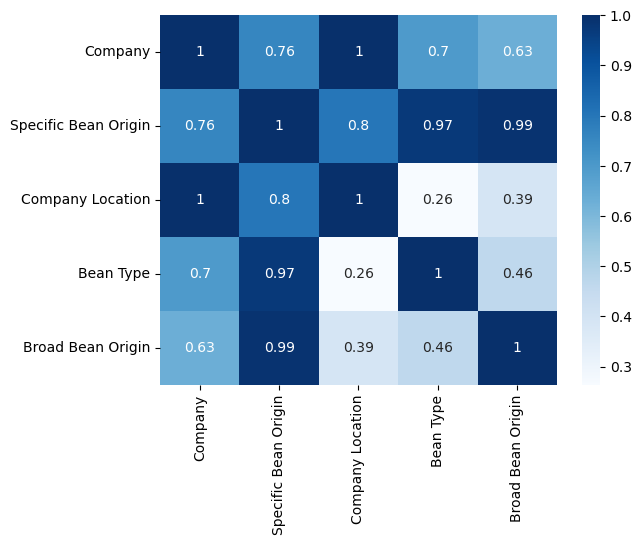

In [2919]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2920]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2921]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2922]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2923]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2924]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2925]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5990
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2926]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2927]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2928]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2929]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2930]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2931]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2932]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2933]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2934]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2935]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2936]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2937]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2938]:
pred = model.predict(test)

In [2939]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2940]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5990
0.9574058324306898
0.0339830379819312


# Результат

In [2941]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2942]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2943]:
train_df = pd.read_csv(TRAIN)

In [2944]:
test_df = pd.read_csv(TEST)

In [2945]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2946]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2947]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2948]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2949]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2950]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2951]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2952]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2953]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2954]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2955]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2956]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2957]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [2958]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2959]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [2960]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

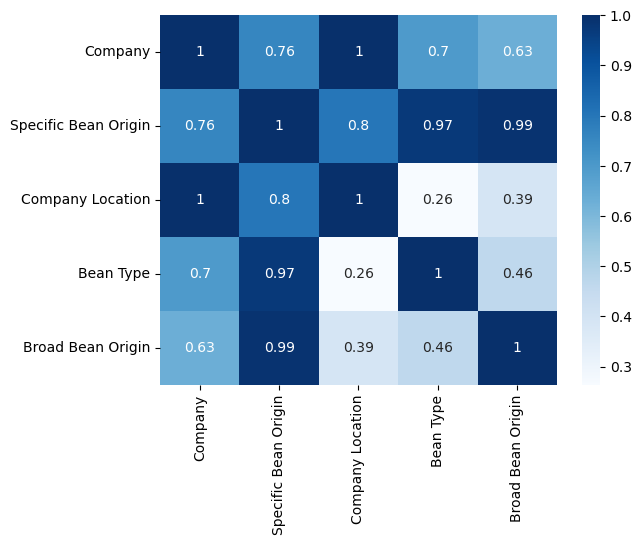

In [2961]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [2962]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [2963]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [2964]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [2965]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [2966]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [2967]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4221
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [2968]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [2969]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [2970]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [2971]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2972]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [2973]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [2974]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [2975]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [2976]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [2977]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [2978]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [2979]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [2980]:
pred = model.predict(test)

In [2981]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [2982]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4221
0.9575889373762545
0.03444063552076981


# Результат

In [2983]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [2984]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [2985]:
train_df = pd.read_csv(TRAIN)

In [2986]:
test_df = pd.read_csv(TEST)

In [2987]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [2988]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [2989]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [2990]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2991]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [2992]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [2993]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [2994]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [2995]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [2996]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [2997]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [2998]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [2999]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3000]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3001]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3002]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

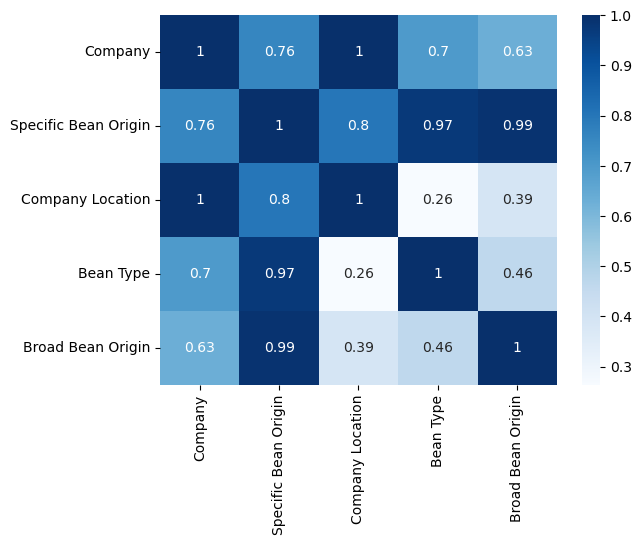

In [3003]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3004]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3005]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3006]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3007]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3008]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3009]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4785
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3010]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3011]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3012]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3013]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3014]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3015]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3016]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3017]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3018]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3019]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3020]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3021]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3022]:
pred = model.predict(test)

In [3023]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3024]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4785
0.9594497232648238
0.033474904737331654


# Результат

In [3025]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3026]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3027]:
train_df = pd.read_csv(TRAIN)

In [3028]:
test_df = pd.read_csv(TEST)

In [3029]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3030]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3031]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3032]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3033]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3034]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3035]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3036]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3037]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3038]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3039]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3040]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3041]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3042]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3043]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3044]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

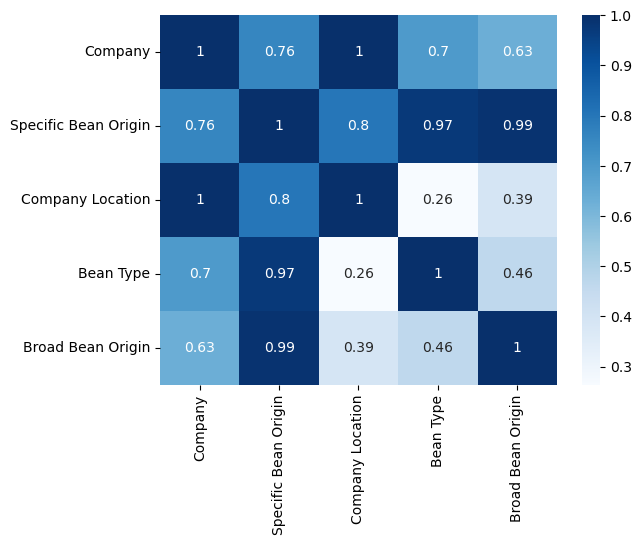

In [3045]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3046]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3047]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3048]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3049]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3050]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3051]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3431
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3052]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3053]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3054]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3055]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3056]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3057]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3058]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3059]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3060]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3061]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3062]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3063]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3064]:
pred = model.predict(test)

In [3065]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3066]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3431
0.9565794003795045
0.03490074880182042


# Результат

In [3067]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3068]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3069]:
train_df = pd.read_csv(TRAIN)

In [3070]:
test_df = pd.read_csv(TEST)

In [3071]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3072]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3073]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3074]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3075]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3076]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3077]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3078]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3079]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3080]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3081]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3082]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3083]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3084]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3085]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3086]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

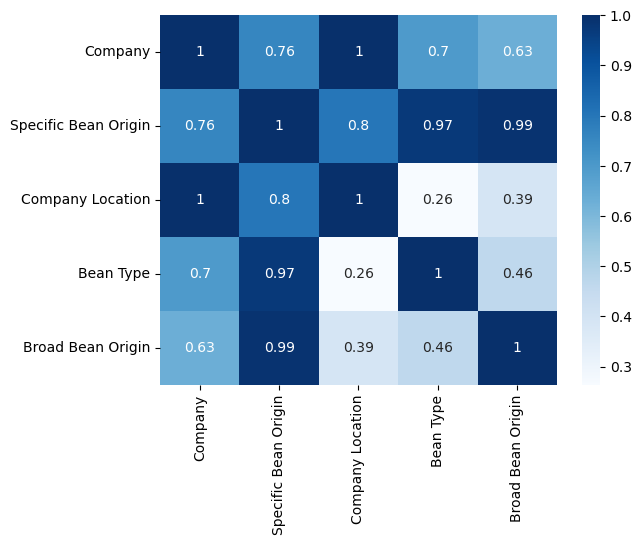

In [3087]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3088]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3089]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3090]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3091]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3092]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3093]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4151
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3094]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3095]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3096]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3097]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3098]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3099]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3100]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3101]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3102]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3103]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3104]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3105]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3106]:
pred = model.predict(test)

In [3107]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3108]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4151
0.9565591836727108
0.035058079584457405


# Результат

In [3109]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3110]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3111]:
train_df = pd.read_csv(TRAIN)

In [3112]:
test_df = pd.read_csv(TEST)

In [3113]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3114]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3115]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3116]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3117]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3118]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3119]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3120]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3121]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3122]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3123]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3124]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3125]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3126]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3127]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3128]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

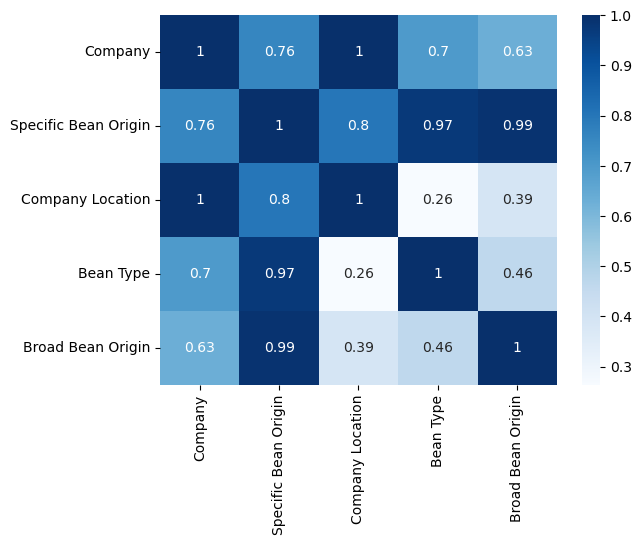

In [3129]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3130]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3131]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3132]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3133]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3134]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3135]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

390
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3136]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3137]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3138]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3139]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3140]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3141]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3142]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3143]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3144]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3145]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3146]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3147]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3148]:
pred = model.predict(test)

In [3149]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3150]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

390
0.9579432053176561
0.03441088866736974


# Результат

In [3151]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3152]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3153]:
train_df = pd.read_csv(TRAIN)

In [3154]:
test_df = pd.read_csv(TEST)

In [3155]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3156]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3157]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3158]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3159]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3160]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3161]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3162]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3163]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3164]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3165]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3166]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3167]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3168]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3169]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3170]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

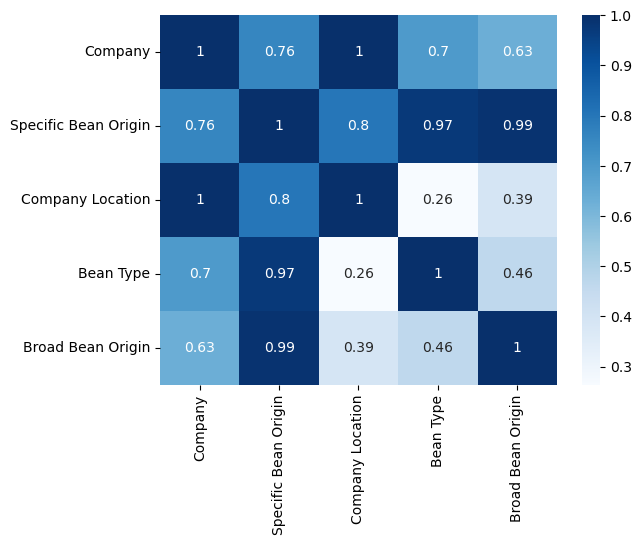

In [3171]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3172]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3173]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3174]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3175]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3176]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3177]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6799
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3178]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3179]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3180]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3181]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3182]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3183]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3184]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3185]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3186]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3187]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3188]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3189]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3190]:
pred = model.predict(test)

In [3191]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3192]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6799
0.9543914085163778
0.03555467934806072


# Результат

In [3193]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3194]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3195]:
train_df = pd.read_csv(TRAIN)

In [3196]:
test_df = pd.read_csv(TEST)

In [3197]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3198]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3199]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3200]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3201]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3202]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3203]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3204]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3205]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3206]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3207]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3208]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3209]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3210]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3211]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3212]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

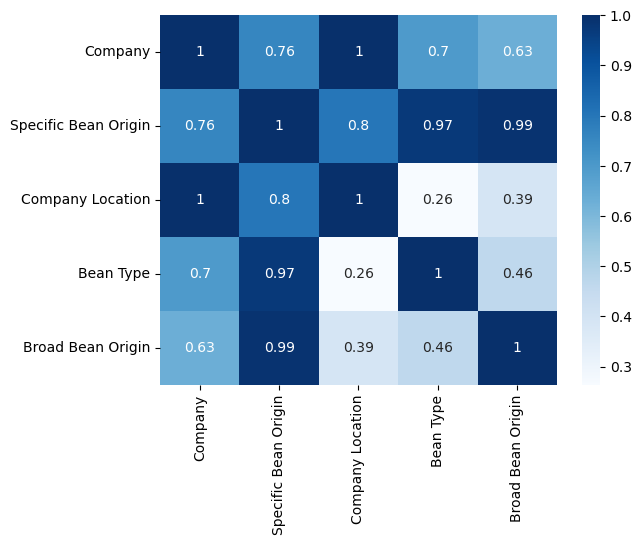

In [3213]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3214]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3215]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3216]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3217]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3218]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3219]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4587
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3220]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3221]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3222]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3223]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3224]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3225]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3226]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3227]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3228]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3229]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3230]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3231]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3232]:
pred = model.predict(test)

In [3233]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3234]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4587
0.9574519237806449
0.03398971812341342


# Результат

In [3235]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3236]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3237]:
train_df = pd.read_csv(TRAIN)

In [3238]:
test_df = pd.read_csv(TEST)

In [3239]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3240]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3241]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3242]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3243]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3244]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3245]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3246]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3247]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3248]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3249]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3250]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3251]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3252]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3253]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3254]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

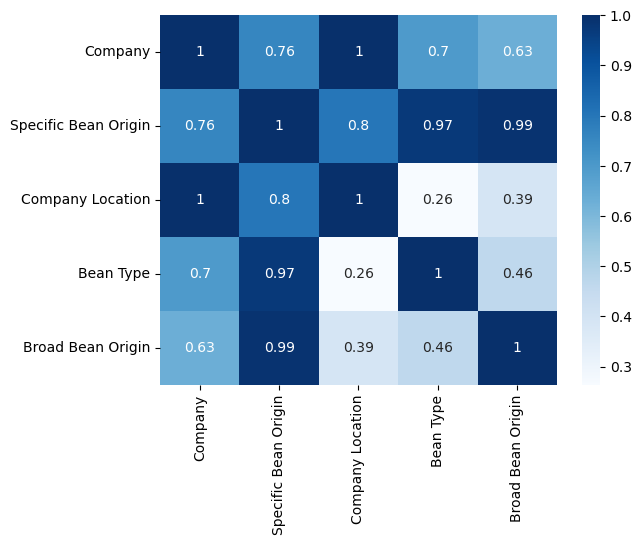

In [3255]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3256]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3257]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3258]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3259]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3260]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3261]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

596
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3262]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3263]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3264]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3265]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3266]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3267]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3268]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3269]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3270]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3271]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3272]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3273]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3274]:
pred = model.predict(test)

In [3275]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3276]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

596
0.9575704333728816
0.03393548118147152


# Результат

In [3277]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3278]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3279]:
train_df = pd.read_csv(TRAIN)

In [3280]:
test_df = pd.read_csv(TEST)

In [3281]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3282]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3283]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3284]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3285]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3286]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3287]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3288]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3289]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3290]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3291]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3292]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3293]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3294]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3295]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3296]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

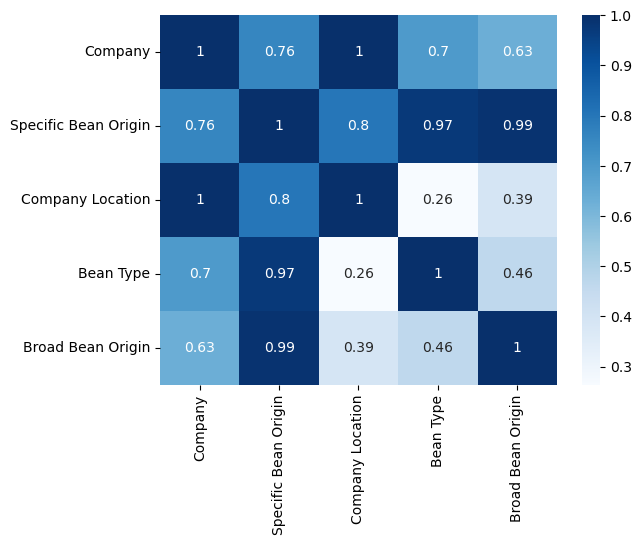

In [3297]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3298]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3299]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3300]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3301]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3302]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3303]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5263
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3304]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3305]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3306]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3307]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3308]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3309]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3310]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3311]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3312]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3313]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3314]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3315]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3316]:
pred = model.predict(test)

In [3317]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3318]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5263
0.9604179179877995
0.0325866049166109


# Результат

In [3319]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3320]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3321]:
train_df = pd.read_csv(TRAIN)

In [3322]:
test_df = pd.read_csv(TEST)

In [3323]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3324]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3325]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3326]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3327]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3328]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3329]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3330]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3331]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3332]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3333]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3334]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3335]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3336]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3337]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3338]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

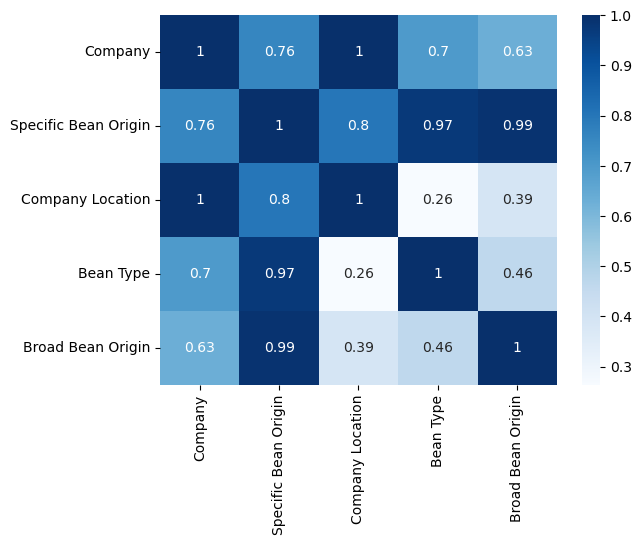

In [3339]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3340]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3341]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3342]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3343]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3344]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3345]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

7978
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3346]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3347]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3348]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3349]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3350]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3351]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3352]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3353]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3354]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3355]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3356]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3357]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3358]:
pred = model.predict(test)

In [3359]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3360]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

7978
0.9599845406834726
0.03375775840443443


# Результат

In [3361]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3362]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3363]:
train_df = pd.read_csv(TRAIN)

In [3364]:
test_df = pd.read_csv(TEST)

In [3365]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3366]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3367]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3368]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3369]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3370]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3371]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3372]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3373]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3374]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3375]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3376]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3377]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3378]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3379]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3380]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

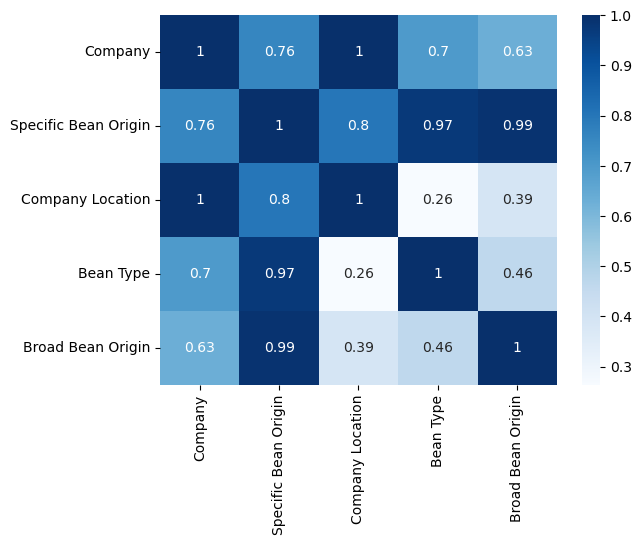

In [3381]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3382]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3383]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3384]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3385]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3386]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3387]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

531
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3388]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3389]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3390]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3391]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3392]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3393]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3394]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3395]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3396]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3397]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3398]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3399]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3400]:
pred = model.predict(test)

In [3401]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3402]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

531
0.9588374571285546
0.03324233069494229


# Результат

In [3403]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3404]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3405]:
train_df = pd.read_csv(TRAIN)

In [3406]:
test_df = pd.read_csv(TEST)

In [3407]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3408]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3409]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3410]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3411]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3412]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3413]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3414]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3415]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3416]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3417]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3418]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3419]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3420]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3421]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3422]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

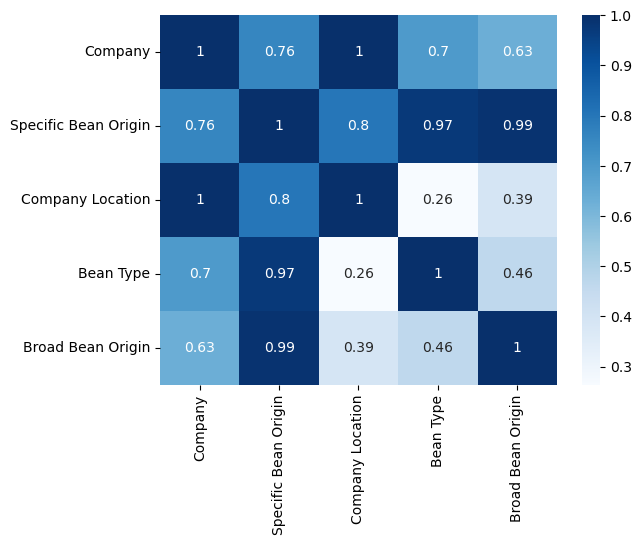

In [3423]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3424]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3425]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3426]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3427]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3428]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3429]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5897
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3430]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3431]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3432]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3433]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3434]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3435]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3436]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3437]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3438]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3439]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3440]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3441]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3442]:
pred = model.predict(test)

In [3443]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3444]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5897
0.9518336974100934
0.036548387399772904


# Результат

In [3445]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3446]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3447]:
train_df = pd.read_csv(TRAIN)

In [3448]:
test_df = pd.read_csv(TEST)

In [3449]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3450]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3451]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3452]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3453]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3454]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3455]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3456]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3457]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3458]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3459]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3460]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3461]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3462]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3463]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3464]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

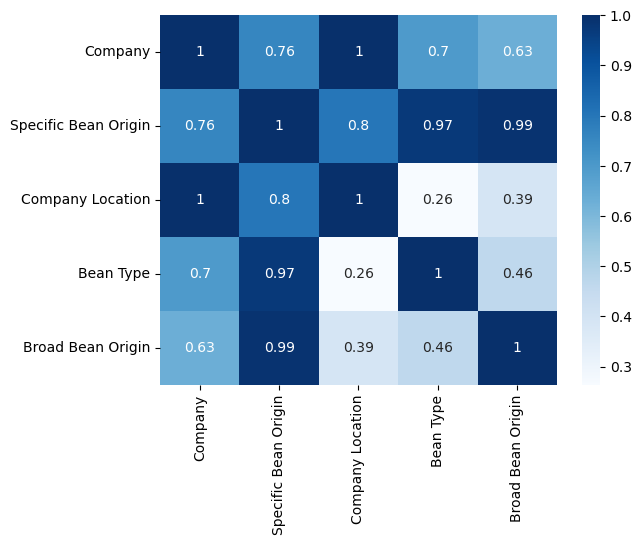

In [3465]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3466]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3467]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3468]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3469]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3470]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3471]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

8839
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3472]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3473]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3474]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3475]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3476]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3477]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3478]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3479]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3480]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3481]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3482]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3483]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3484]:
pred = model.predict(test)

In [3485]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3486]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

8839
0.9576161695445775
0.03415682616996089


# Результат

In [3487]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3488]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3489]:
train_df = pd.read_csv(TRAIN)

In [3490]:
test_df = pd.read_csv(TEST)

In [3491]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3492]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3493]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3494]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3495]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3496]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3497]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3498]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3499]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3500]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3501]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3502]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3503]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3504]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3505]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3506]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

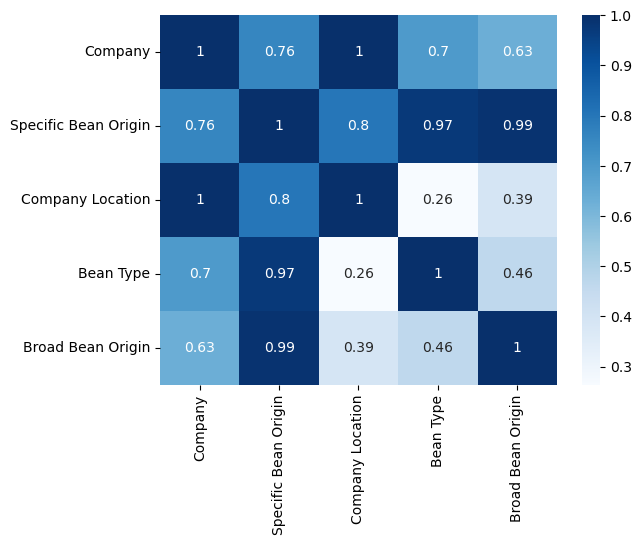

In [3507]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3508]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3509]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3510]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3511]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3512]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3513]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5788
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3514]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3515]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3516]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3517]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3518]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3519]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3520]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3521]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3522]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3523]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3524]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3525]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3526]:
pred = model.predict(test)

In [3527]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3528]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5788
0.9626783573528789
0.03257293184911955


# Результат

In [3529]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3530]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3531]:
train_df = pd.read_csv(TRAIN)

In [3532]:
test_df = pd.read_csv(TEST)

In [3533]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3534]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3535]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3536]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3537]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3538]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3539]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3540]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3541]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3542]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3543]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3544]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3545]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3546]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3547]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3548]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

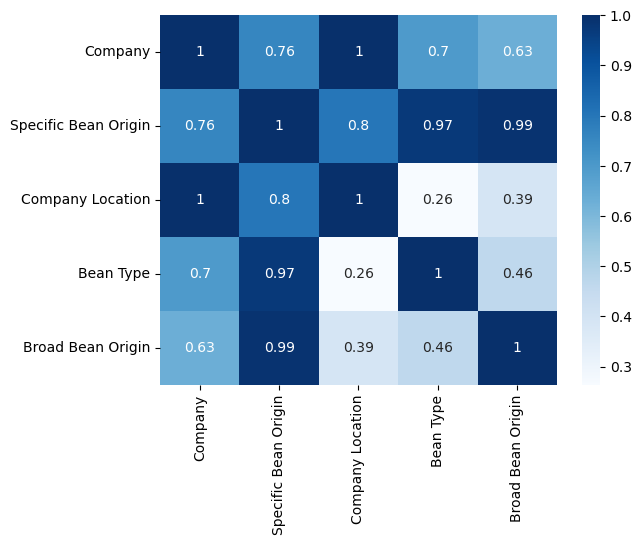

In [3549]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3550]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3551]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3552]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3553]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3554]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3555]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4428
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3556]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3557]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3558]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3559]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3560]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3561]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3562]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3563]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3564]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3565]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3566]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3567]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3568]:
pred = model.predict(test)

In [3569]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3570]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4428
0.9574124171654143
0.03420389657995484


# Результат

In [3571]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3572]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3573]:
train_df = pd.read_csv(TRAIN)

In [3574]:
test_df = pd.read_csv(TEST)

In [3575]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3576]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3577]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3578]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3579]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3580]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3581]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3582]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3583]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3584]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3585]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3586]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3587]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3588]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3589]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3590]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

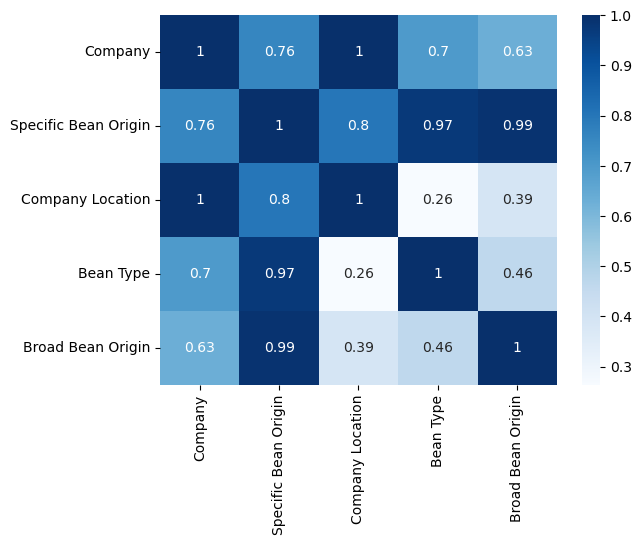

In [3591]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3592]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3593]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3594]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3595]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3596]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3597]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2993
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3598]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3599]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3600]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3601]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3602]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3603]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3604]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3605]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3606]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3607]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3608]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3609]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3610]:
pred = model.predict(test)

In [3611]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3612]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2993
0.9549122507703787
0.03596201831252982


# Результат

In [3613]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3614]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3615]:
train_df = pd.read_csv(TRAIN)

In [3616]:
test_df = pd.read_csv(TEST)

In [3617]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3618]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3619]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3620]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3621]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3622]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3623]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3624]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3625]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3626]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3627]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3628]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3629]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3630]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3631]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3632]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

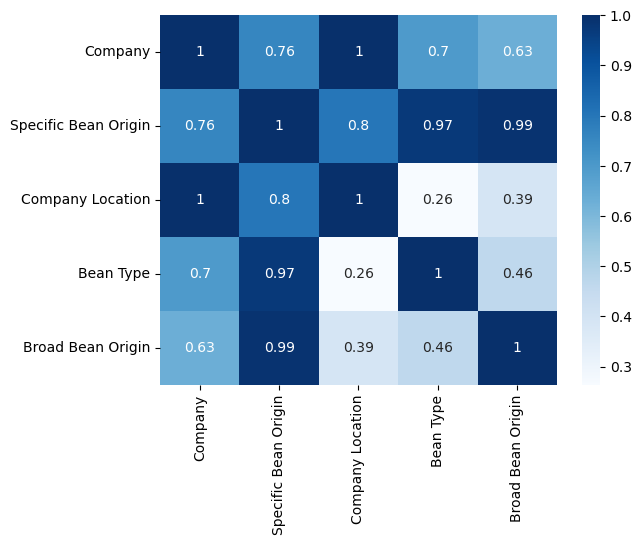

In [3633]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3634]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3635]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3636]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3637]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3638]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3639]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

8734
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3640]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3641]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3642]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3643]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3644]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3645]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3646]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3647]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3648]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3649]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3650]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3651]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3652]:
pred = model.predict(test)

In [3653]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3654]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

8734
0.9604968486806
0.032697985676703484


# Результат

In [3655]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3656]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3657]:
train_df = pd.read_csv(TRAIN)

In [3658]:
test_df = pd.read_csv(TEST)

In [3659]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3660]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3661]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3662]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3663]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3664]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3665]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3666]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3667]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3668]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3669]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3670]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3671]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3672]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3673]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3674]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

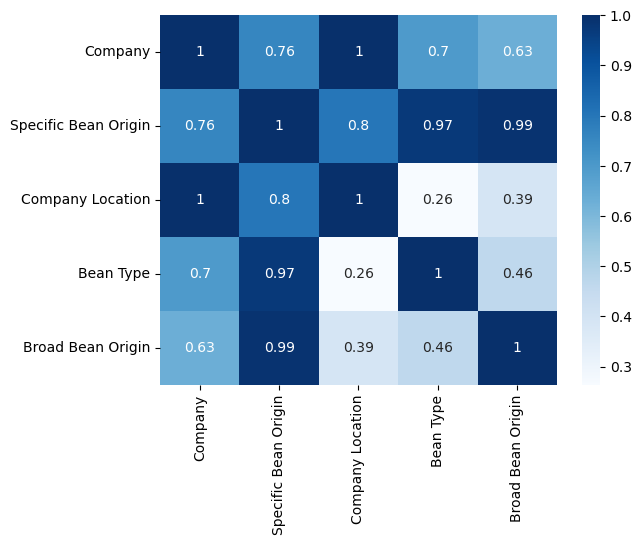

In [3675]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3676]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3677]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3678]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3679]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3680]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3681]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

7029
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3682]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3683]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3684]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3685]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3686]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3687]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3688]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3689]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3690]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3691]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3692]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3693]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3694]:
pred = model.predict(test)

In [3695]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3696]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

7029
0.9559613714327666
0.035999288801730096


# Результат

In [3697]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3698]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3699]:
train_df = pd.read_csv(TRAIN)

In [3700]:
test_df = pd.read_csv(TEST)

In [3701]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3702]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3703]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3704]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3705]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3706]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3707]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3708]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3709]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3710]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3711]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3712]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3713]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3714]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3715]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3716]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

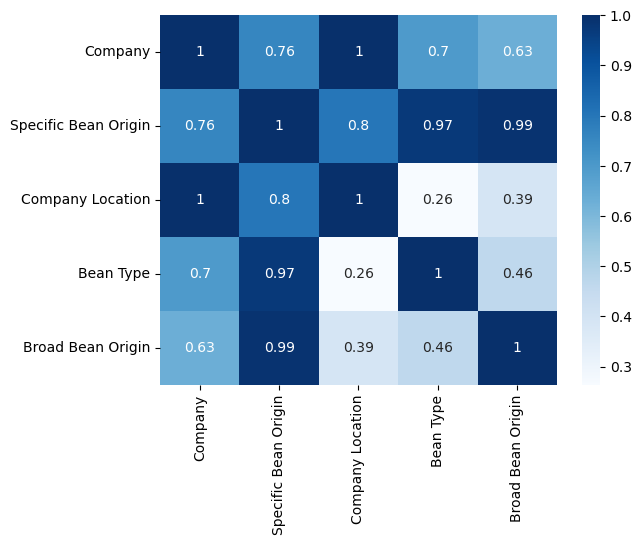

In [3717]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3718]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3719]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3720]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3721]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3722]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3723]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5306
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3724]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3725]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3726]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3727]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3728]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3729]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3730]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3731]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3732]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3733]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3734]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3735]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3736]:
pred = model.predict(test)

In [3737]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3738]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5306
0.9583159524623257
0.03447181672953295


# Результат

In [3739]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3740]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3741]:
train_df = pd.read_csv(TRAIN)

In [3742]:
test_df = pd.read_csv(TEST)

In [3743]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3744]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3745]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3746]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3747]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3748]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3749]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3750]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3751]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3752]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3753]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3754]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3755]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3756]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3757]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3758]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

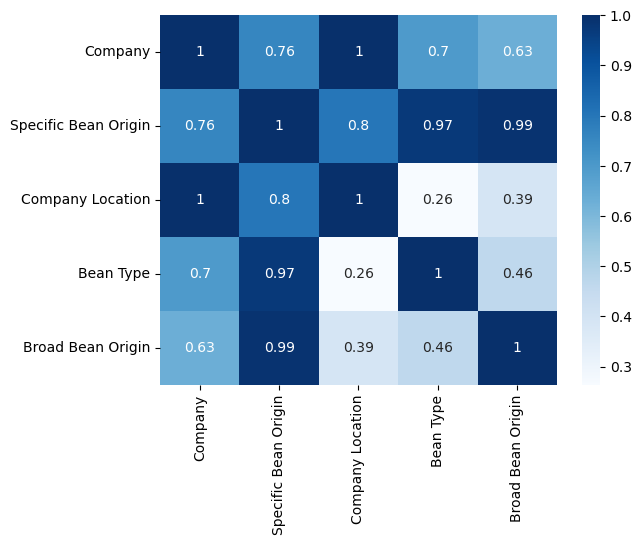

In [3759]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3760]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3761]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3762]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3763]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3764]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3765]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

917
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3766]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3767]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3768]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3769]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3770]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3771]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3772]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3773]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3774]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3775]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3776]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3777]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3778]:
pred = model.predict(test)

In [3779]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3780]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

917
0.9618697975267911
0.03297666554407999


# Результат

In [3781]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3782]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3783]:
train_df = pd.read_csv(TRAIN)

In [3784]:
test_df = pd.read_csv(TEST)

In [3785]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3786]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3787]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3788]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3789]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3790]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3791]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3792]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3793]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3794]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3795]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3796]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3797]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3798]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3799]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3800]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

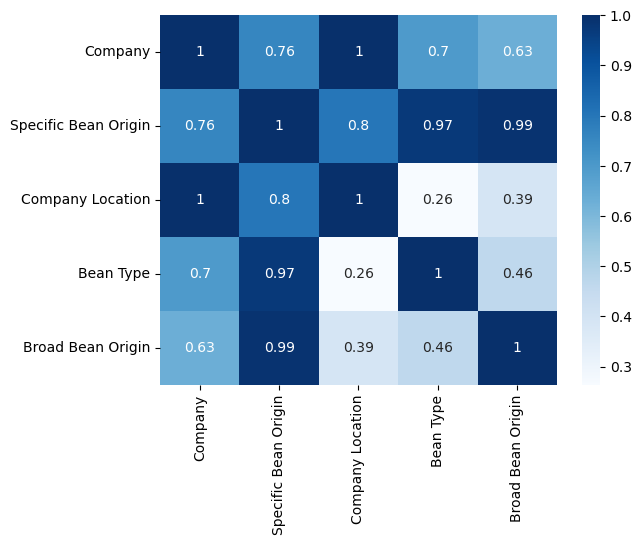

In [3801]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3802]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3803]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3804]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3805]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3806]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3807]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1420
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3808]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3809]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3810]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3811]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3812]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3813]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3814]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3815]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3816]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3817]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3818]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3819]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3820]:
pred = model.predict(test)

In [3821]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3822]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1420
0.9536573756544389
0.03598587498350929


# Результат

In [3823]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3824]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3825]:
train_df = pd.read_csv(TRAIN)

In [3826]:
test_df = pd.read_csv(TEST)

In [3827]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3828]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3829]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3830]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3831]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3832]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3833]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3834]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3835]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3836]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3837]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3838]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3839]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3840]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3841]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3842]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

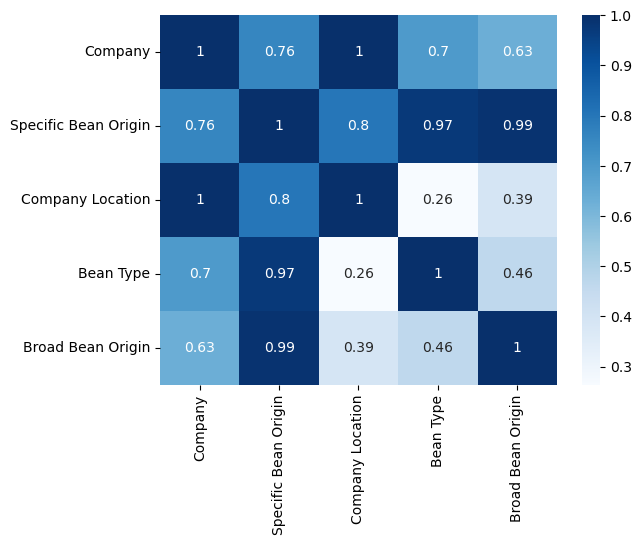

In [3843]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3844]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3845]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3846]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3847]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3848]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3849]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5635
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3850]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3851]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3852]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3853]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3854]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3855]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3856]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3857]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3858]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3859]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3860]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3861]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3862]:
pred = model.predict(test)

In [3863]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3864]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5635
0.9601368543464397
0.032908806774599994


# Результат

In [3865]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3866]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3867]:
train_df = pd.read_csv(TRAIN)

In [3868]:
test_df = pd.read_csv(TEST)

In [3869]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3870]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3871]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3872]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3873]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3874]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3875]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3876]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3877]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3878]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3879]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3880]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3881]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3882]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3883]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3884]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

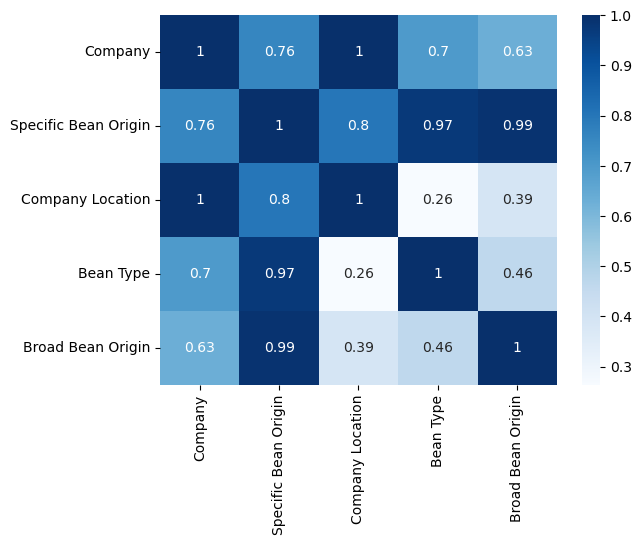

In [3885]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3886]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3887]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3888]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3889]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3890]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3891]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1688
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3892]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3893]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3894]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3895]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3896]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3897]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3898]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3899]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3900]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3901]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3902]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3903]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3904]:
pred = model.predict(test)

In [3905]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3906]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1688
0.9598485609977289
0.03359385638912082


# Результат

In [3907]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3908]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3909]:
train_df = pd.read_csv(TRAIN)

In [3910]:
test_df = pd.read_csv(TEST)

In [3911]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3912]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3913]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3914]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3915]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3916]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3917]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3918]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3919]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3920]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3921]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3922]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3923]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3924]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3925]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3926]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

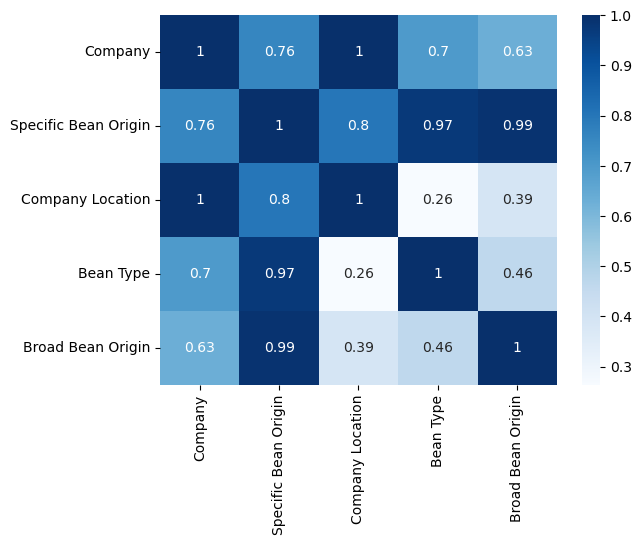

In [3927]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3928]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3929]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3930]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3931]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3932]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3933]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1508
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3934]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3935]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3936]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3937]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3938]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3939]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3940]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3941]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3942]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3943]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3944]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3945]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3946]:
pred = model.predict(test)

In [3947]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3948]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1508
0.9553554867104598
0.03581601832427674


# Результат

In [3949]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3950]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3951]:
train_df = pd.read_csv(TRAIN)

In [3952]:
test_df = pd.read_csv(TEST)

In [3953]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3954]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3955]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3956]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3957]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3958]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [3959]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [3960]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [3961]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [3962]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [3963]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [3964]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [3965]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [3966]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3967]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [3968]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

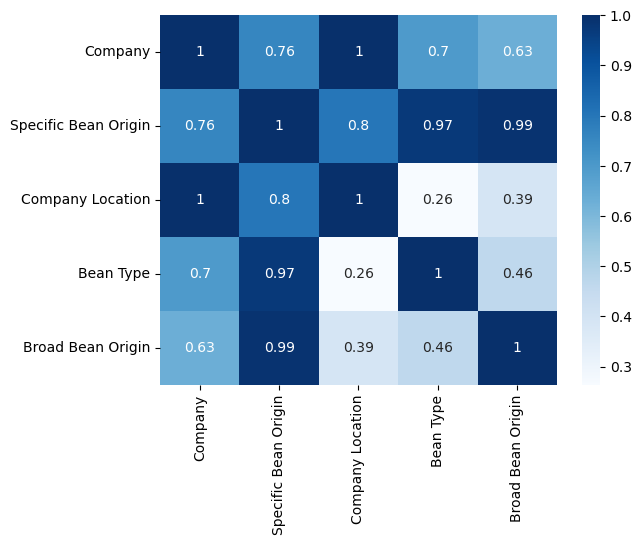

In [3969]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [3970]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [3971]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [3972]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [3973]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [3974]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [3975]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4351
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [3976]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [3977]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [3978]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [3979]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3980]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [3981]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [3982]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [3983]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [3984]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [3985]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [3986]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [3987]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [3988]:
pred = model.predict(test)

In [3989]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [3990]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4351
0.9576078416886955
0.0341718496469111


# Результат

In [3991]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [3992]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [3993]:
train_df = pd.read_csv(TRAIN)

In [3994]:
test_df = pd.read_csv(TEST)

In [3995]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [3996]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [3997]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [3998]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [3999]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4000]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4001]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4002]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4003]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4004]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4005]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4006]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4007]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4008]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4009]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4010]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

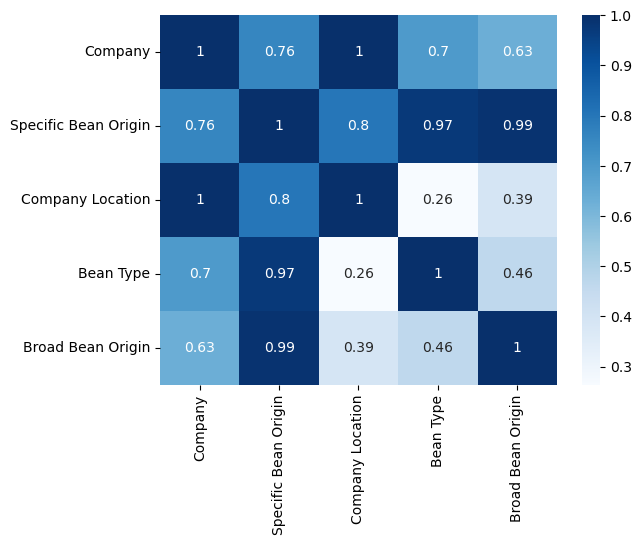

In [4011]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4012]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4013]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4014]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4015]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4016]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4017]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1440
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4018]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4019]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4020]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4021]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4022]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4023]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4024]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4025]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4026]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4027]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4028]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4029]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4030]:
pred = model.predict(test)

In [4031]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4032]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

1440
0.9600227013917587
0.03279494329747772


# Результат

In [4033]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4034]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4035]:
train_df = pd.read_csv(TRAIN)

In [4036]:
test_df = pd.read_csv(TEST)

In [4037]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4038]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4039]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4040]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4041]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4042]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4043]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4044]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4045]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4046]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4047]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4048]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4049]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4050]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4051]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4052]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

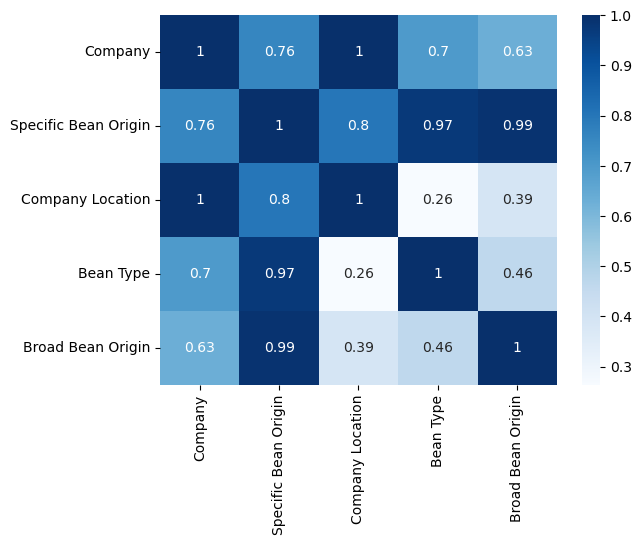

In [4053]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4054]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4055]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4056]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4057]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4058]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4059]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3684
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4060]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4061]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4062]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4063]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4064]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4065]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4066]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4067]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4068]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4069]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4070]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4071]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4072]:
pred = model.predict(test)

In [4073]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4074]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3684
0.9586107354215453
0.03423759829745051


# Результат

In [4075]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4076]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4077]:
train_df = pd.read_csv(TRAIN)

In [4078]:
test_df = pd.read_csv(TEST)

In [4079]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4080]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4081]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4082]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4083]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4084]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4085]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4086]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4087]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4088]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4089]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4090]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4091]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4092]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4093]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4094]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

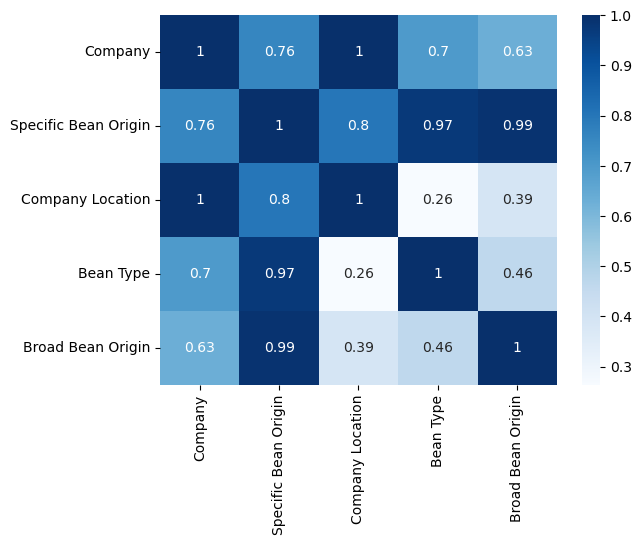

In [4095]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4096]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4097]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4098]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4099]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4100]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4101]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2038
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4102]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4103]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4104]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4105]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4106]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4107]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4108]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4109]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4110]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4111]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4112]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4113]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4114]:
pred = model.predict(test)

In [4115]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4116]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2038
0.956572082387772
0.03377399474154514


# Результат

In [4117]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4118]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4119]:
train_df = pd.read_csv(TRAIN)

In [4120]:
test_df = pd.read_csv(TEST)

In [4121]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4122]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4123]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4124]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4125]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4126]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4127]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4128]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4129]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4130]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4131]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4132]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4133]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4134]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4135]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4136]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

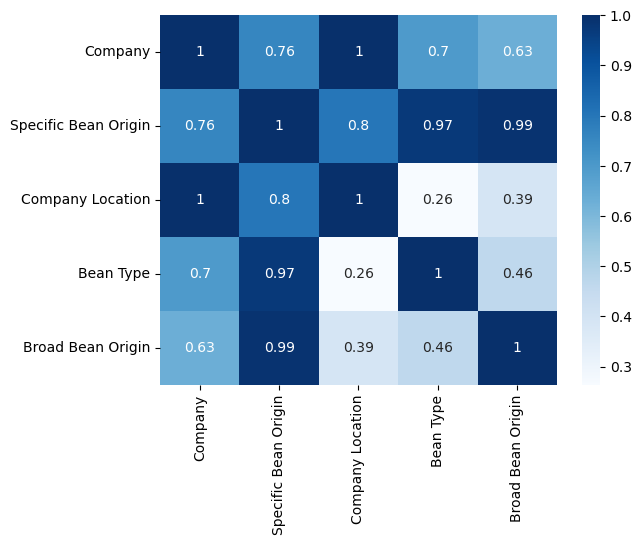

In [4137]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4138]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4139]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4140]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4141]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4142]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4143]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

5649
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4144]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4145]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4146]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4147]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4148]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4149]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4150]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4151]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4152]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4153]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4154]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4155]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4156]:
pred = model.predict(test)

In [4157]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4158]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

5649
0.9562035548708525
0.03462503031682442


# Результат

In [4159]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4160]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4161]:
train_df = pd.read_csv(TRAIN)

In [4162]:
test_df = pd.read_csv(TEST)

In [4163]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4164]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4165]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4166]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4167]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4168]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4169]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4170]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4171]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4172]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4173]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4174]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4175]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4176]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4177]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4178]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

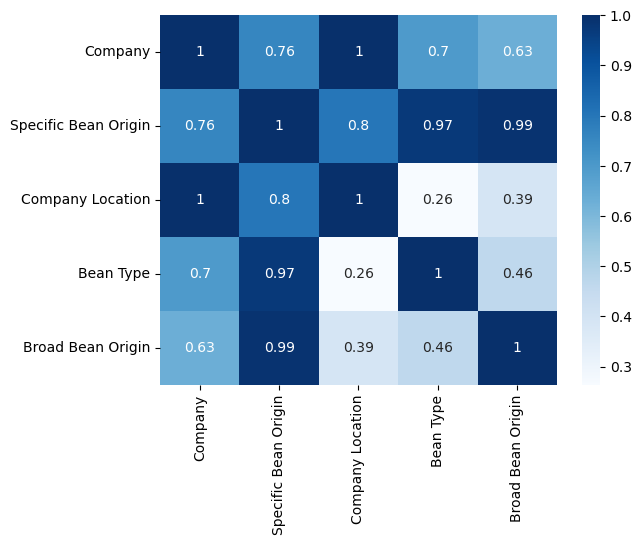

In [4179]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4180]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4181]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4182]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4183]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4184]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4185]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6743
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4186]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4187]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4188]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4189]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4190]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4191]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4192]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4193]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4194]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4195]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4196]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4197]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4198]:
pred = model.predict(test)

In [4199]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4200]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6743
0.9605419167955918
0.033144485606945


# Результат

In [4201]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4202]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4203]:
train_df = pd.read_csv(TRAIN)

In [4204]:
test_df = pd.read_csv(TEST)

In [4205]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4206]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4207]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4208]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4209]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4210]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4211]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4212]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4213]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4214]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4215]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4216]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4217]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4218]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4219]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4220]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

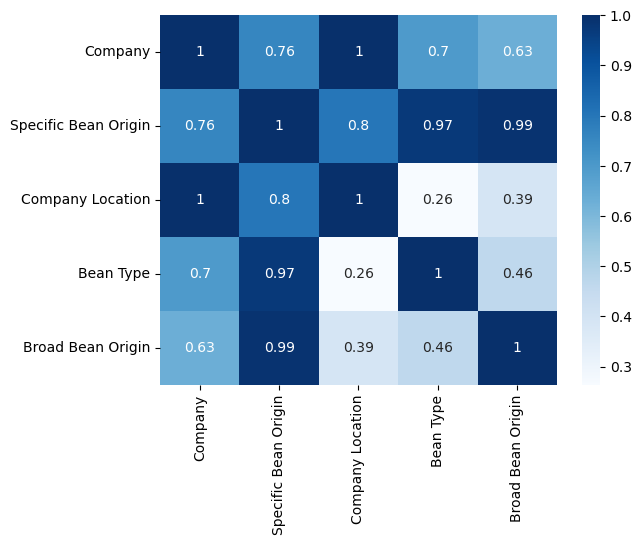

In [4221]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4222]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4223]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4224]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4225]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4226]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4227]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4231
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4228]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4229]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4230]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4231]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4232]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4233]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4234]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4235]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4236]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4237]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4238]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4239]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4240]:
pred = model.predict(test)

In [4241]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4242]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4231
0.9568885490270467
0.03485077945209218


# Результат

In [4243]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4244]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4245]:
train_df = pd.read_csv(TRAIN)

In [4246]:
test_df = pd.read_csv(TEST)

In [4247]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4248]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4249]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4250]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4251]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4252]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4253]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4254]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4255]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4256]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4257]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4258]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4259]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4260]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4261]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4262]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

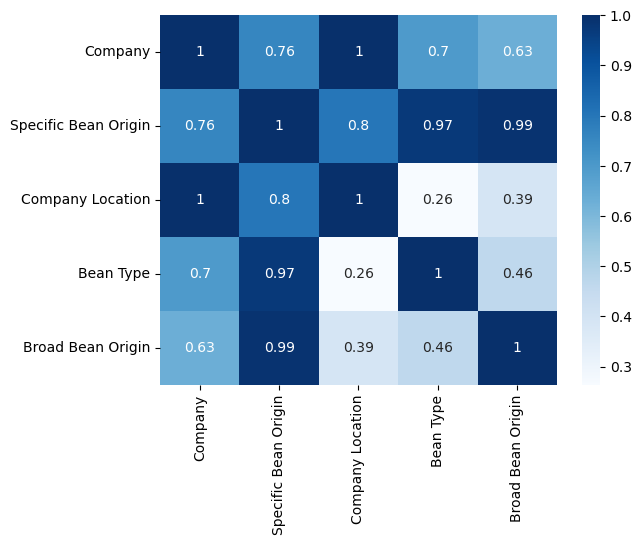

In [4263]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4264]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4265]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4266]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4267]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4268]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4269]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4270]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4271]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4272]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4273]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4274]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4275]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4276]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4277]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4278]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4279]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4280]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4281]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4282]:
pred = model.predict(test)

In [4283]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4284]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [4285]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4286]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4287]:
train_df = pd.read_csv(TRAIN)

In [4288]:
test_df = pd.read_csv(TEST)

In [4289]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4290]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4291]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4292]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4293]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4294]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4295]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4296]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4297]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4298]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4299]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4300]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4301]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4302]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4303]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4304]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

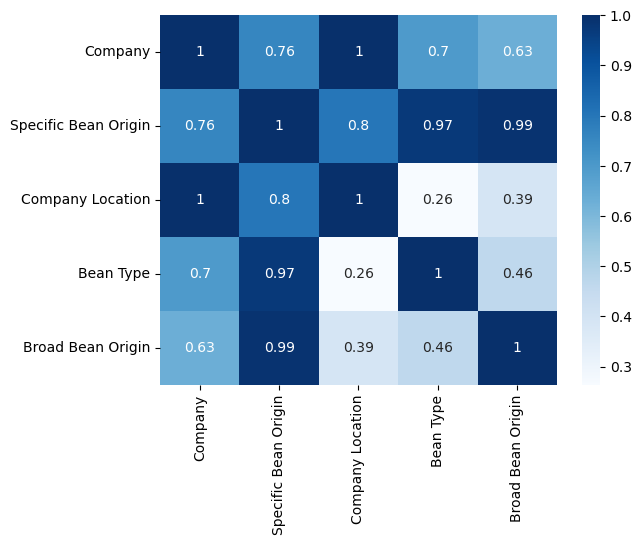

In [4305]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4306]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4307]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4308]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4309]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4310]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4311]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

2391
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4312]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4313]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4314]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4315]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4316]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4317]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4318]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4319]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4320]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4321]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4322]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4323]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4324]:
pred = model.predict(test)

In [4325]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4326]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

2391
0.958206522252767
0.033370931277501605


# Результат

In [4327]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4328]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4329]:
train_df = pd.read_csv(TRAIN)

In [4330]:
test_df = pd.read_csv(TEST)

In [4331]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4332]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4333]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4334]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4335]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4336]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4337]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4338]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4339]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4340]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4341]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4342]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4343]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4344]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4345]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4346]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

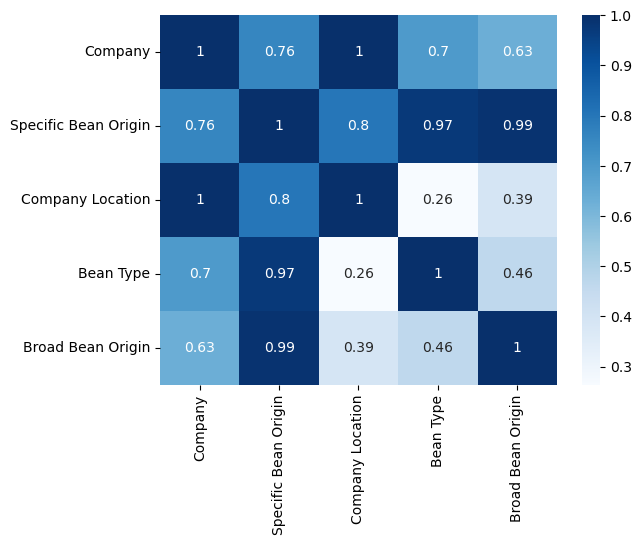

In [4347]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4348]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4349]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4350]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4351]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4352]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4353]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

4702
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4354]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4355]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4356]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4357]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4358]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4359]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4360]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4361]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4362]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4363]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4364]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4365]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4366]:
pred = model.predict(test)

In [4367]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4368]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

4702
0.962088755205081
0.03268005599379542


# Результат

In [4369]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4370]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4371]:
train_df = pd.read_csv(TRAIN)

In [4372]:
test_df = pd.read_csv(TEST)

In [4373]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4374]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4375]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4376]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4377]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4378]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4379]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4380]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4381]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4382]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4383]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4384]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4385]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4386]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4387]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4388]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

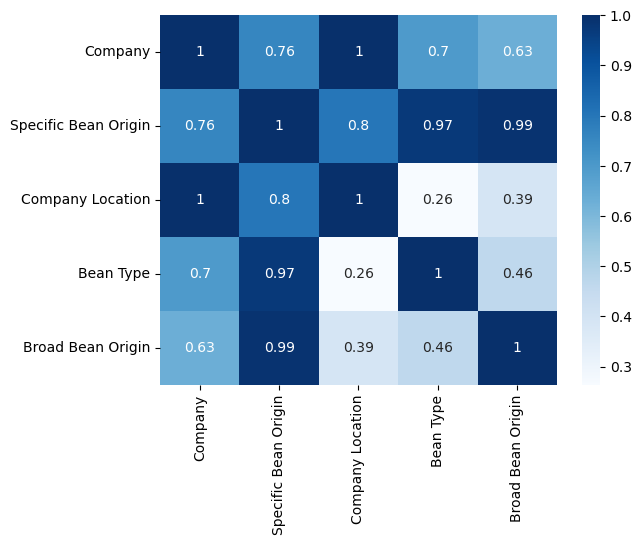

In [4389]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4390]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4391]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4392]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4393]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4394]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4395]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3869
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4396]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4397]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4398]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4399]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4400]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4401]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4402]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4403]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4404]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4405]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4406]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4407]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4408]:
pred = model.predict(test)

In [4409]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4410]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3869
0.9579358640413639
0.033432526038093886


# Результат

In [4411]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


<!-- # Загрузка данных -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- # Загрузка данных -->

Загрузка данных

In [4412]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4413]:
train_df = pd.read_csv(TRAIN)

In [4414]:
test_df = pd.read_csv(TEST)

In [4415]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4416]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4417]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4418]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4419]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4420]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4421]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4422]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4423]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4424]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4425]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4426]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4427]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4428]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4429]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4430]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

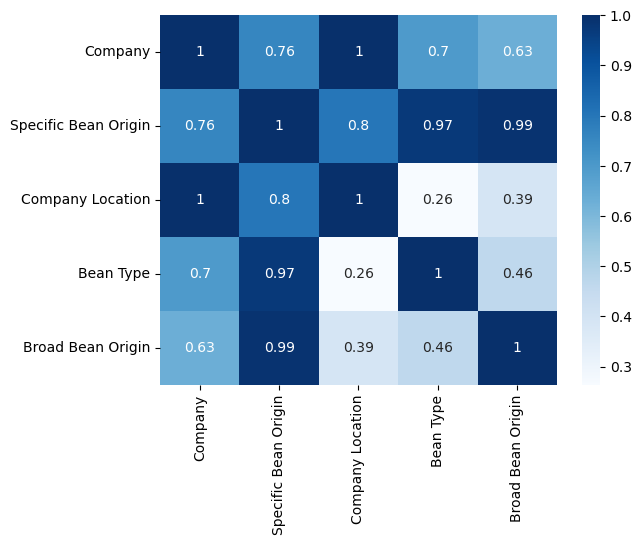

In [4431]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4432]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4433]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4434]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4435]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4436]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4437]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

7519
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4438]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4439]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4440]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4441]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4442]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4443]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4444]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4445]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4446]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4447]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4448]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4449]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4450]:
pred = model.predict(test)

In [4451]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4452]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

7519
0.9549752280789302
0.035430117461681426


# Результат

In [4453]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4454]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4455]:
train_df = pd.read_csv(TRAIN)

In [4456]:
test_df = pd.read_csv(TEST)

In [4457]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4458]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4459]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4460]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4461]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4462]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4463]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4464]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4465]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4466]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4467]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4468]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4469]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4470]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4471]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4472]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

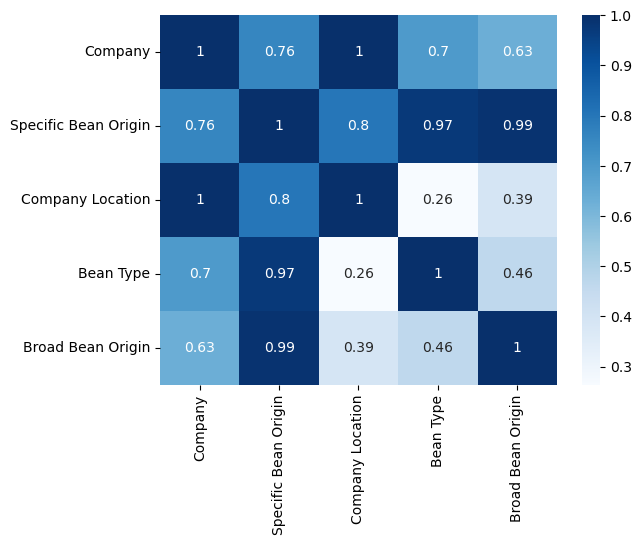

In [4473]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4474]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4475]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4476]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4477]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4478]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4479]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

9991
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4480]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4481]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4482]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4483]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4484]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4485]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4486]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4487]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4488]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4489]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4490]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4491]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4492]:
pred = model.predict(test)

In [4493]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4494]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

9991
0.9569137889564514
0.03424999698631989


# Результат

In [4495]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4496]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4497]:
train_df = pd.read_csv(TRAIN)

In [4498]:
test_df = pd.read_csv(TEST)

In [4499]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4500]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4501]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4502]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4503]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4504]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4505]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4506]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4507]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4508]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4509]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4510]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4511]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4512]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4513]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4514]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

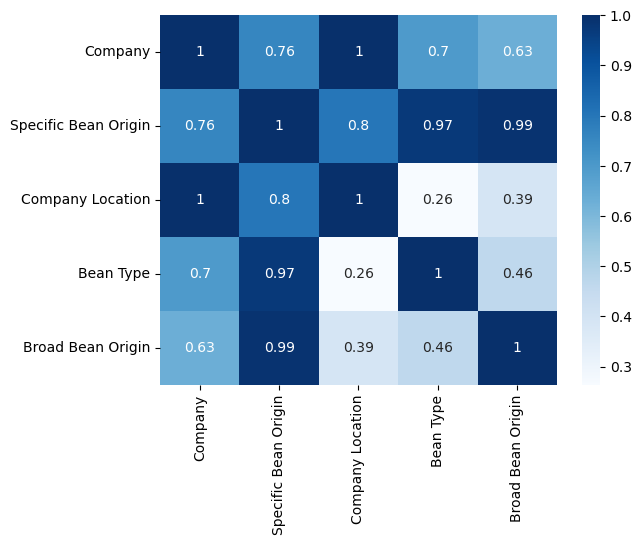

In [4515]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4516]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4517]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4518]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4519]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4520]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4521]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

6592
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4522]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4523]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4524]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4525]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4526]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4527]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4528]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4529]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4530]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4531]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4532]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [4533]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [4534]:
pred = model.predict(test)

In [4535]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [4536]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

6592
0.9571325716027853
0.03439173852961773


# Результат

In [4537]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

1460
0.9618215556786172
0.03244613751387179


Загрузка данных

In [4538]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [4539]:
train_df = pd.read_csv(TRAIN)

In [4540]:
test_df = pd.read_csv(TEST)

In [4541]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [4542]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [4543]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [4544]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4545]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [4546]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [4547]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [4548]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [4549]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [4550]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [4551]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [4552]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [4553]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [4554]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4555]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [4556]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

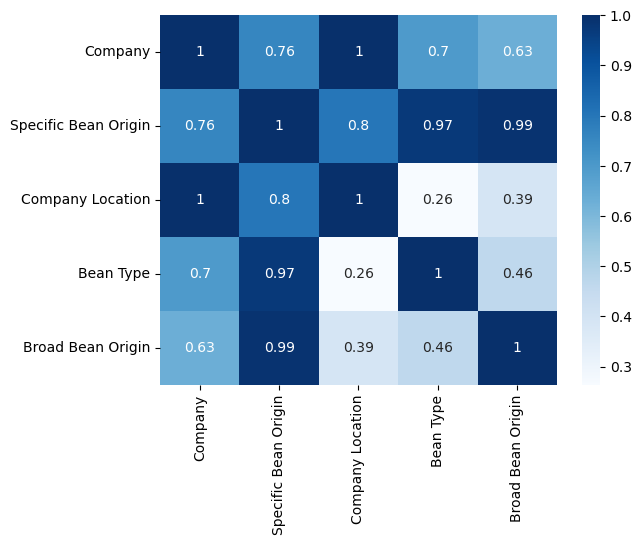

In [4557]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [4558]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [4559]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [4560]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [4561]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [4562]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [4563]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

1460
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']


['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [4564]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [4565]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [4566]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [4567]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4568]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [4569]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [4570]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [4571]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [4572]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [4573]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [4574]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

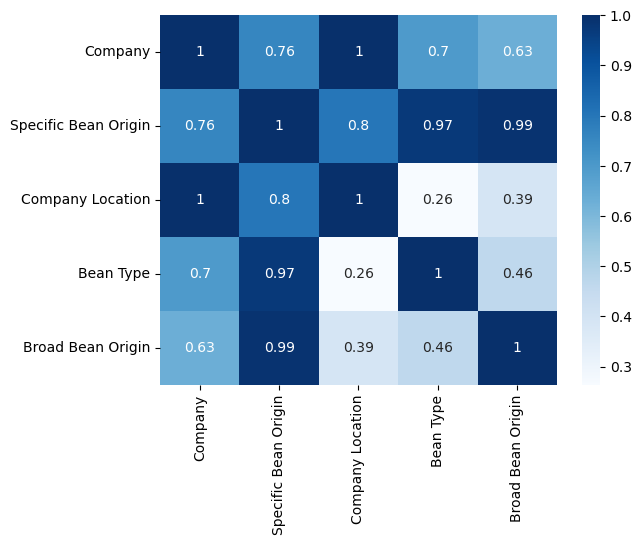

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

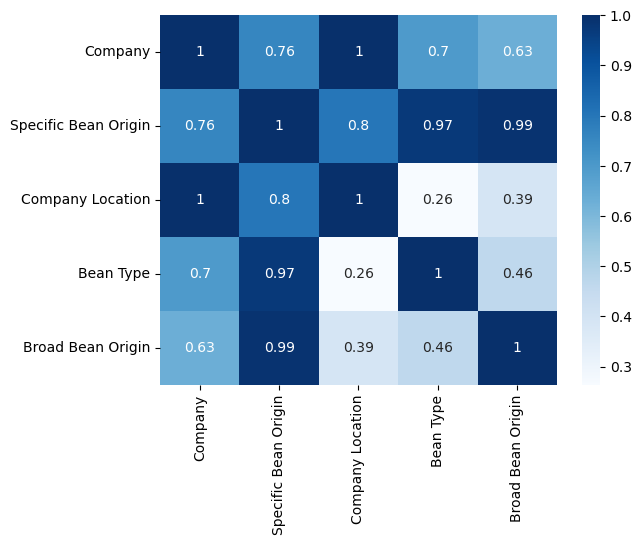

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

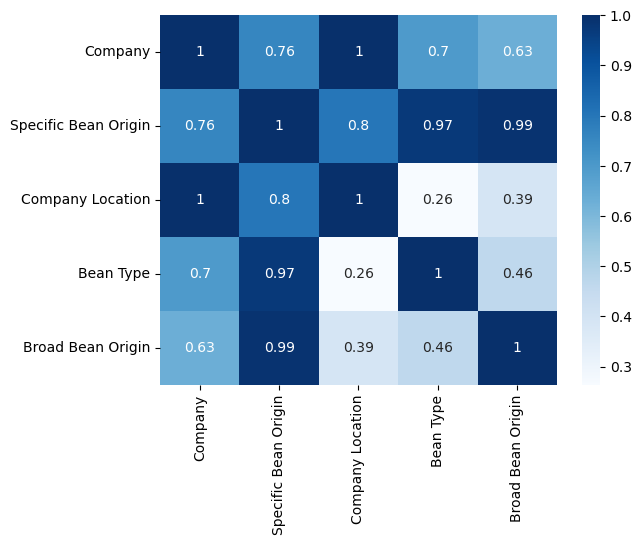

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

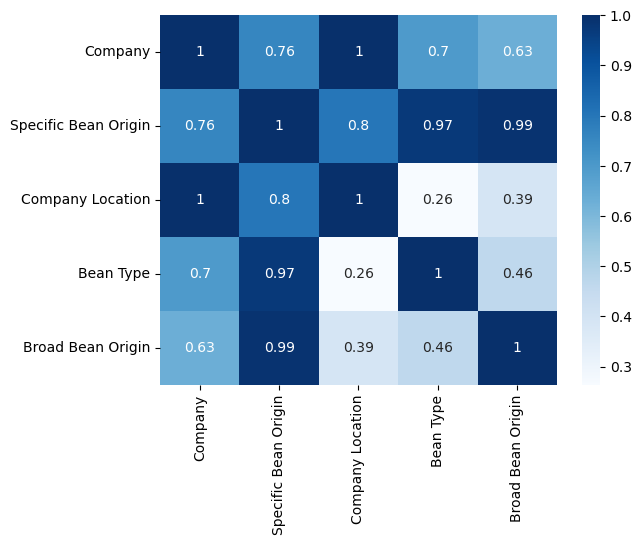

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

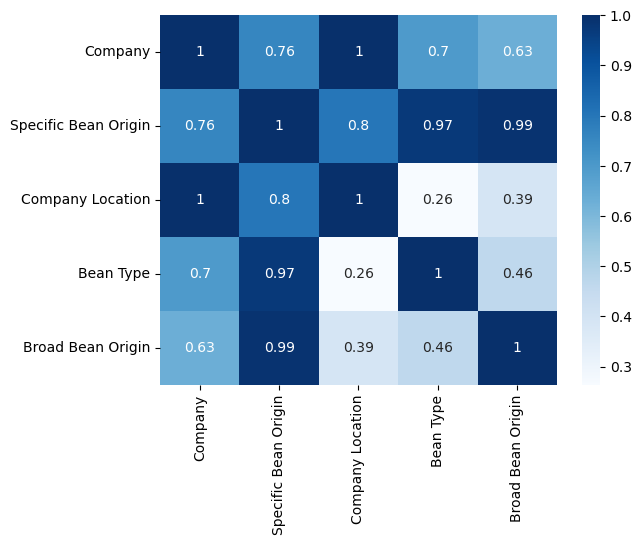

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

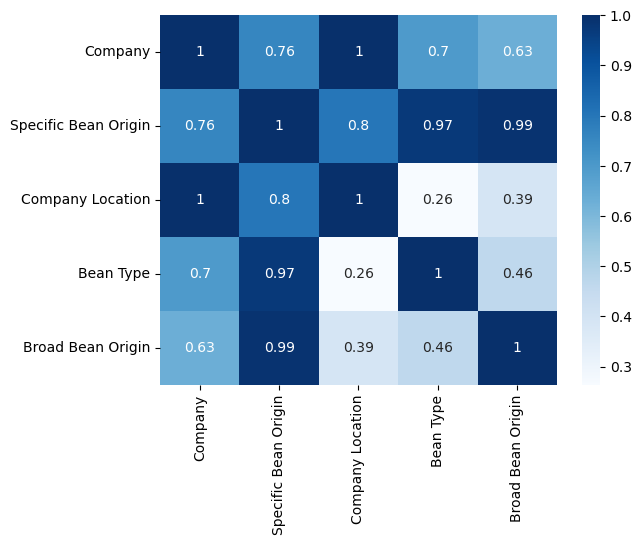

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

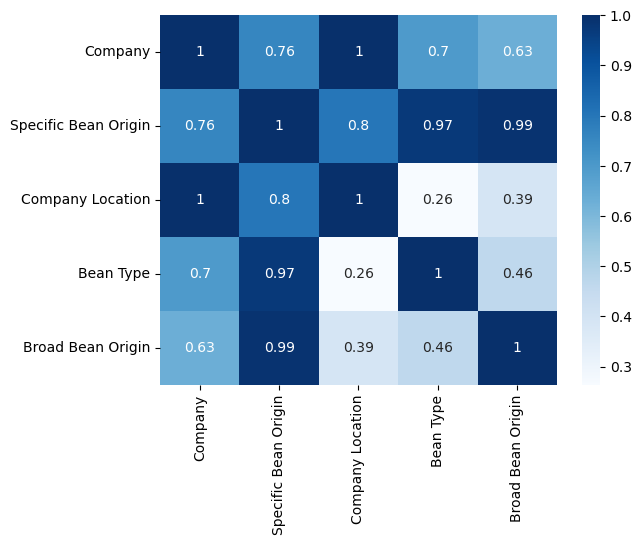

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

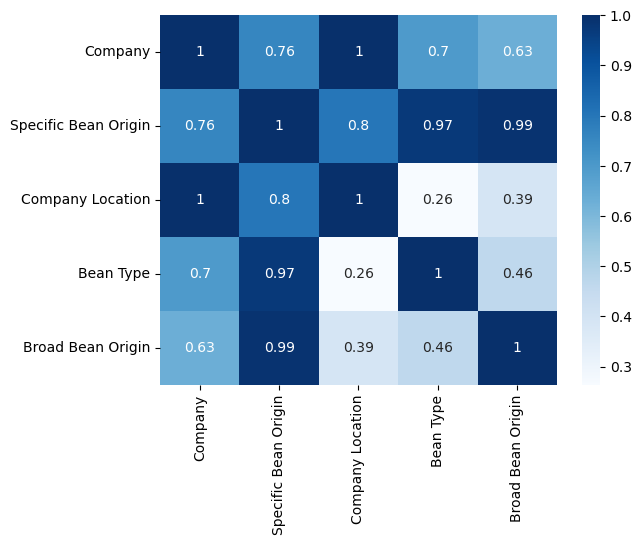

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

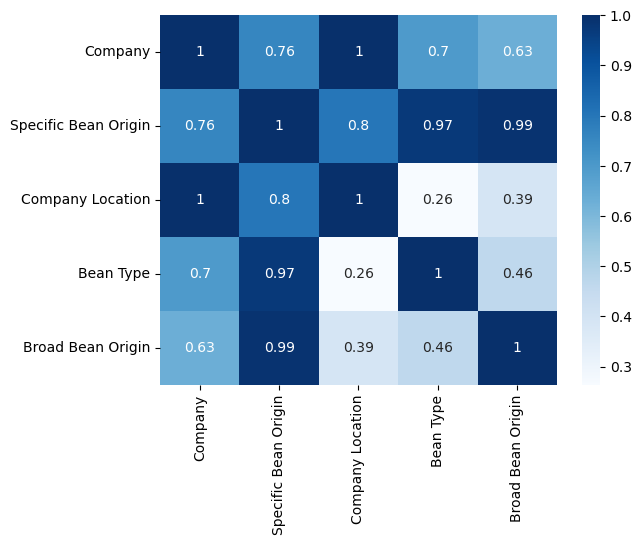

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

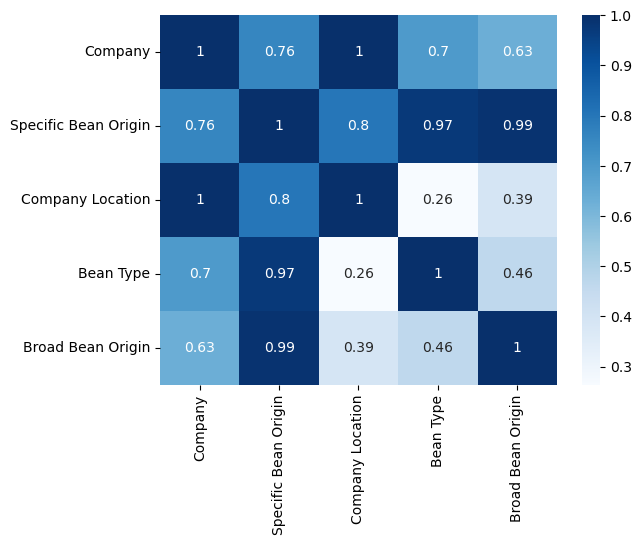

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

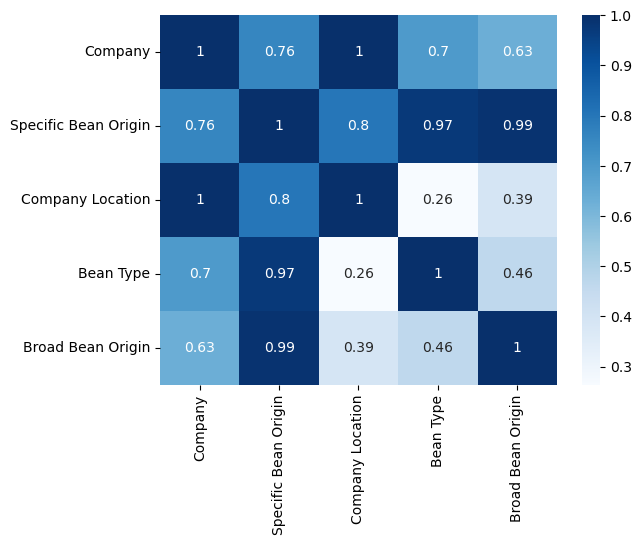

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

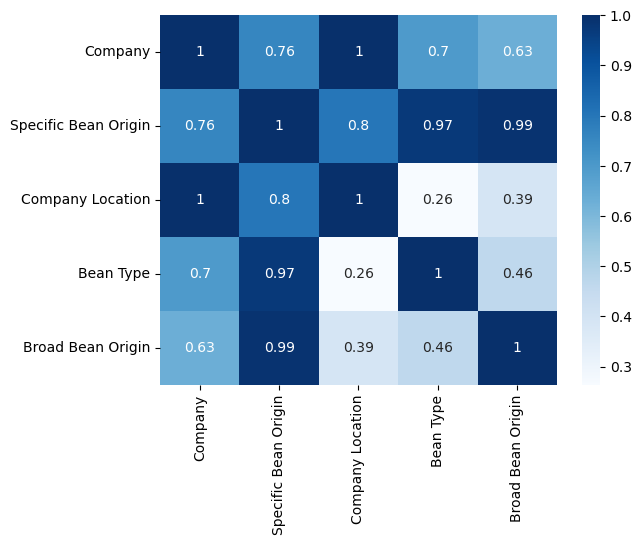

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

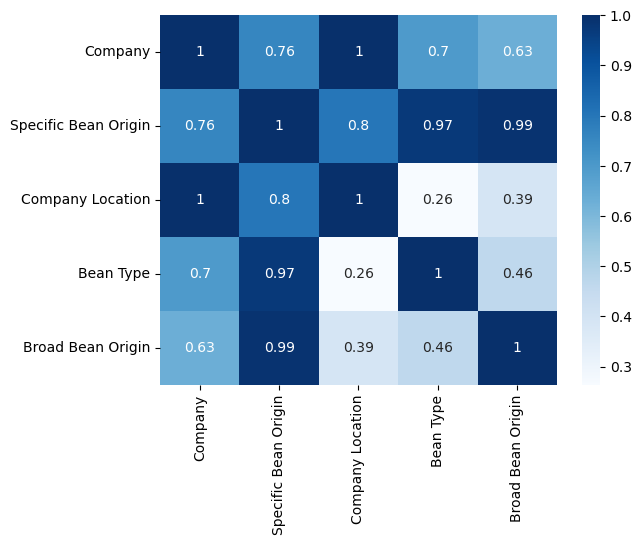

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

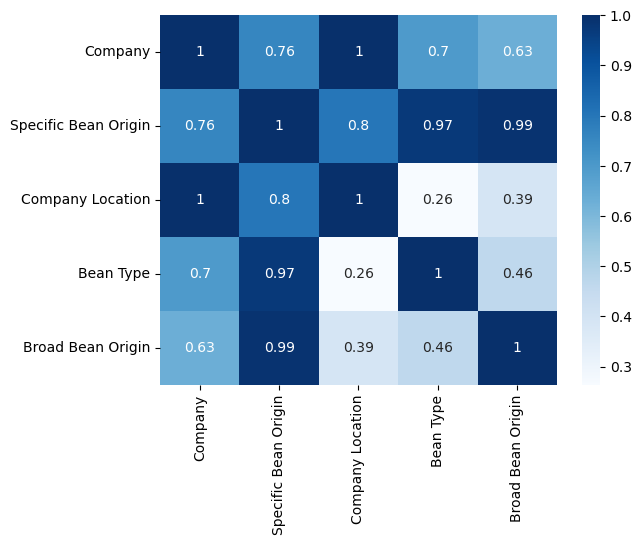

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

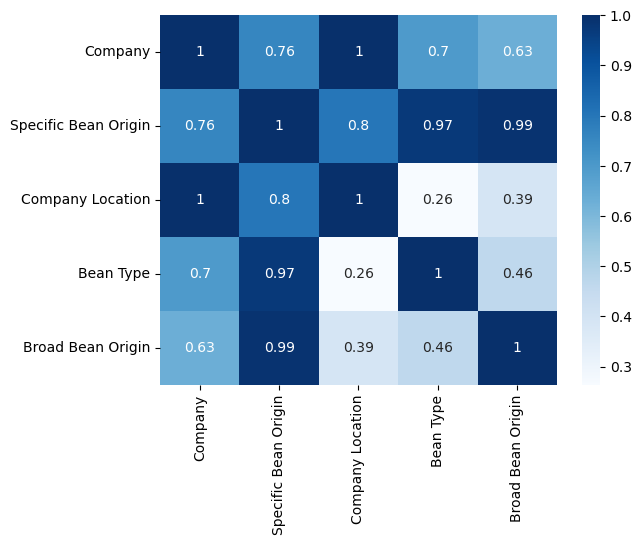

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

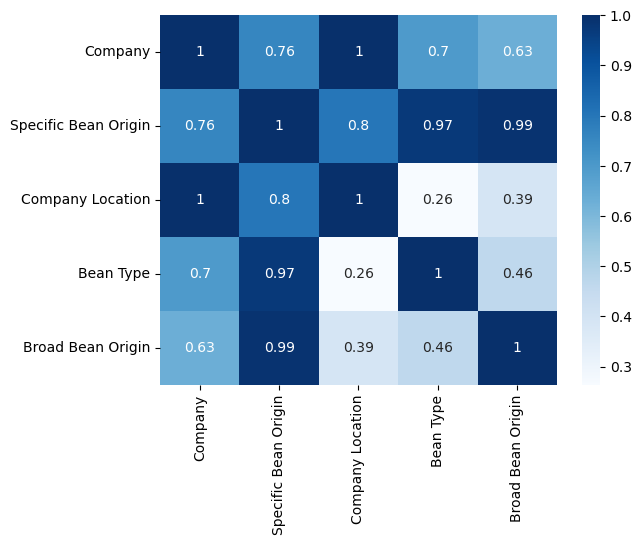

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

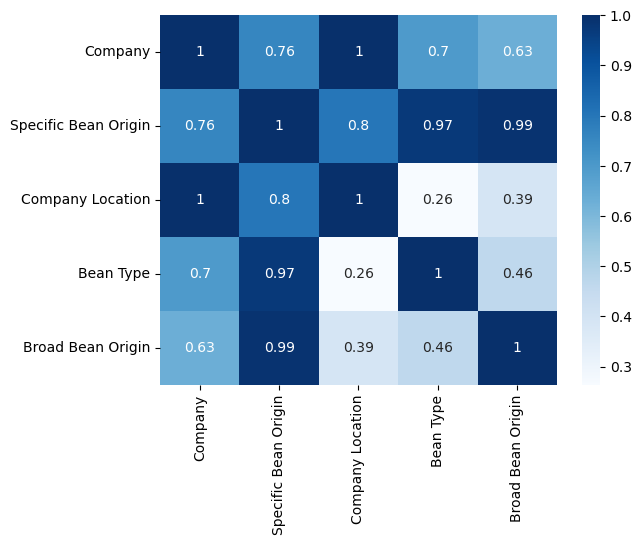

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

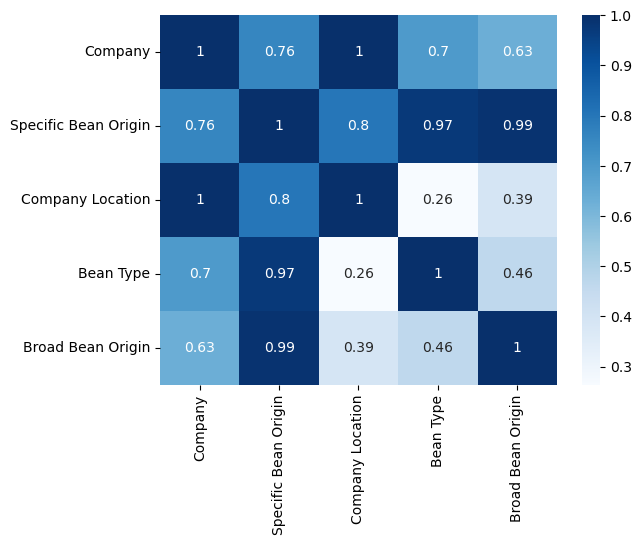

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

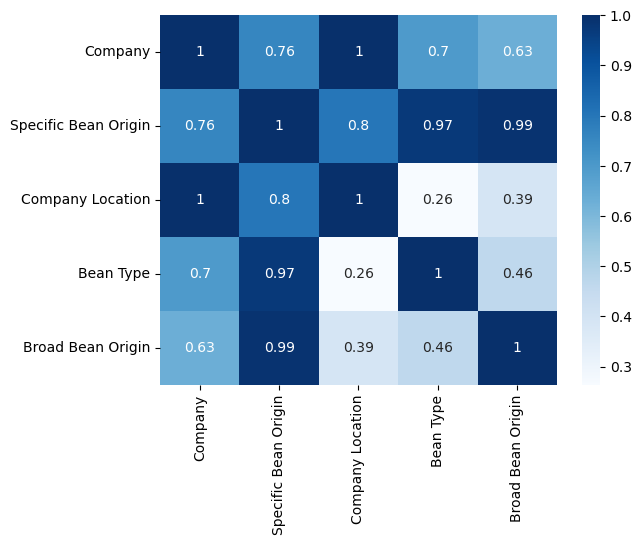

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

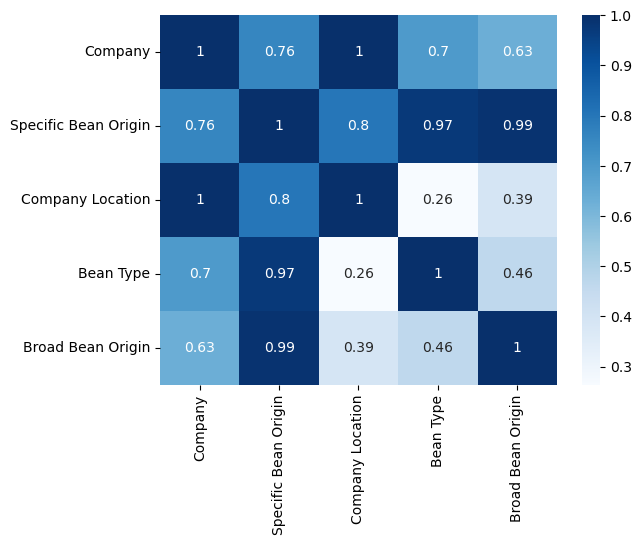

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

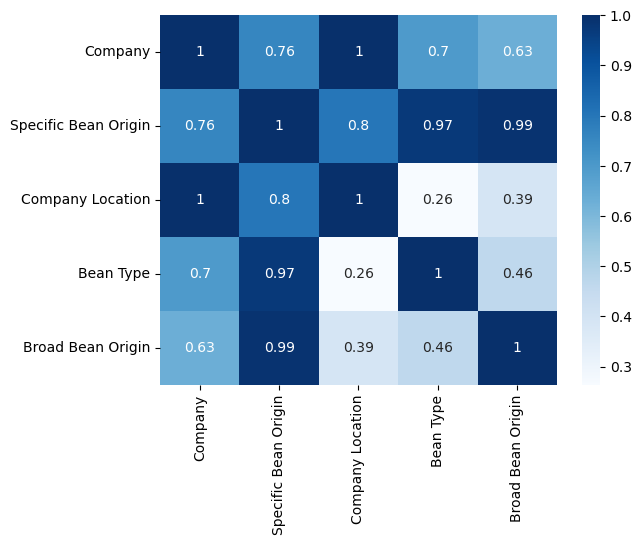

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

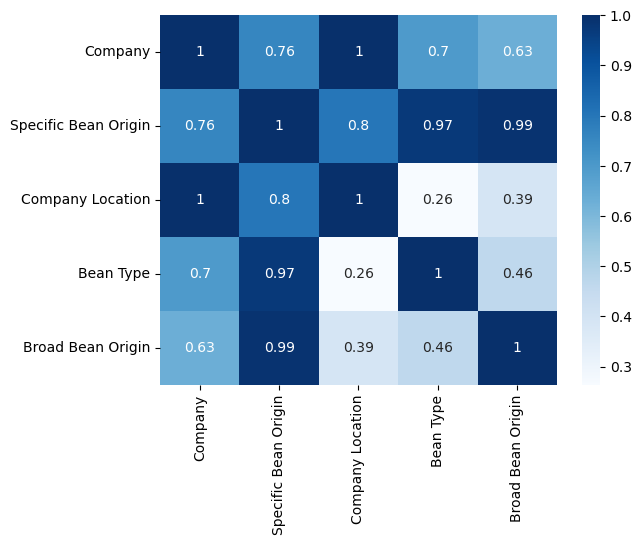

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

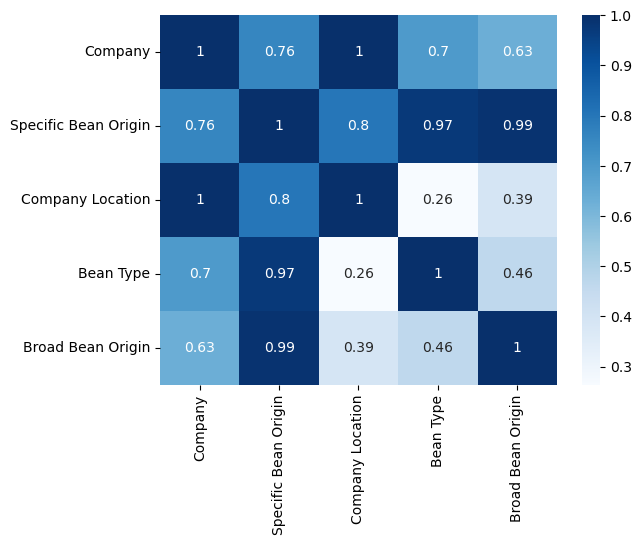

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

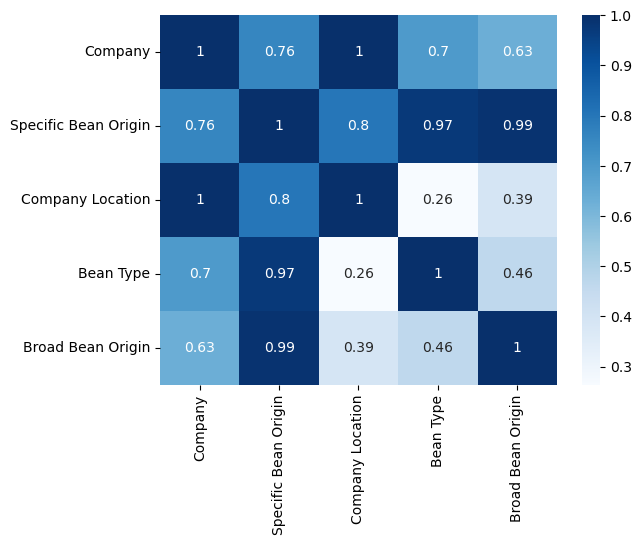

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

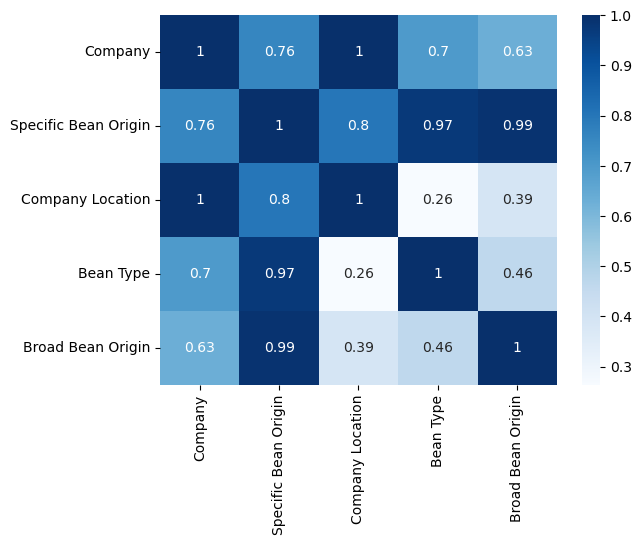

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

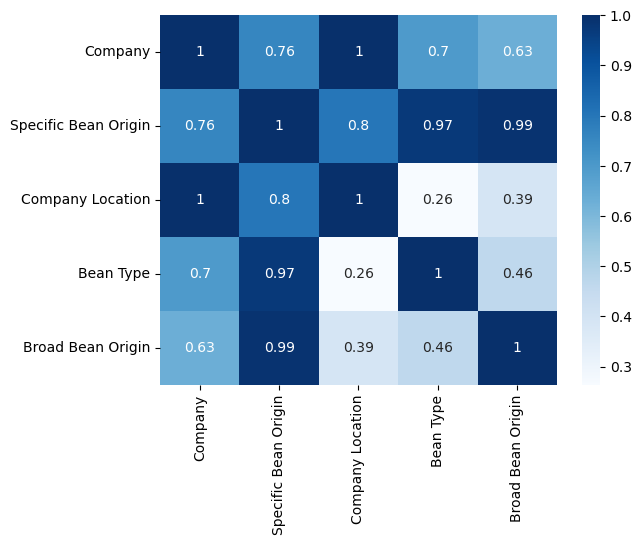

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

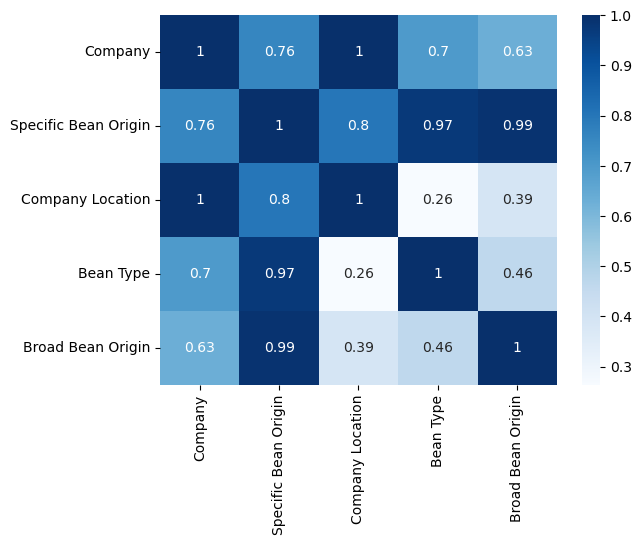

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

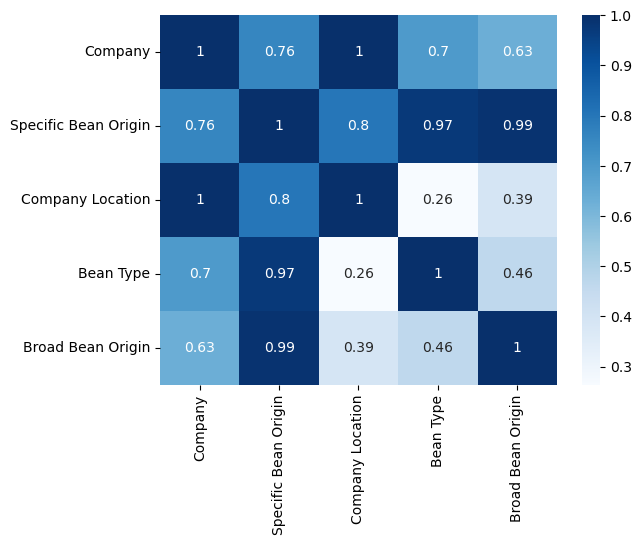

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

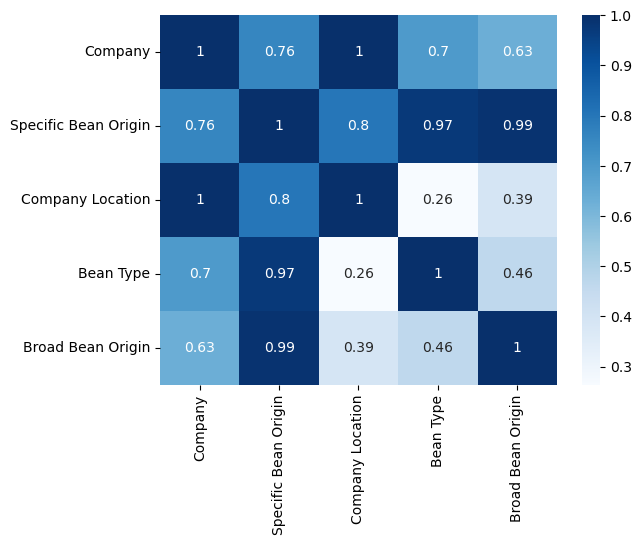

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

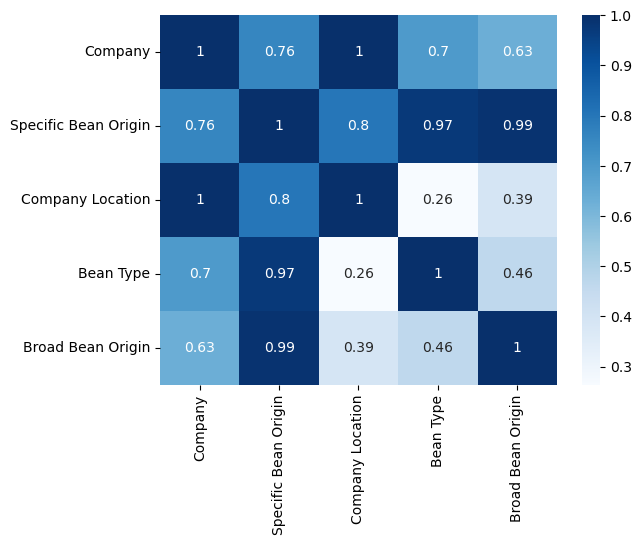

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

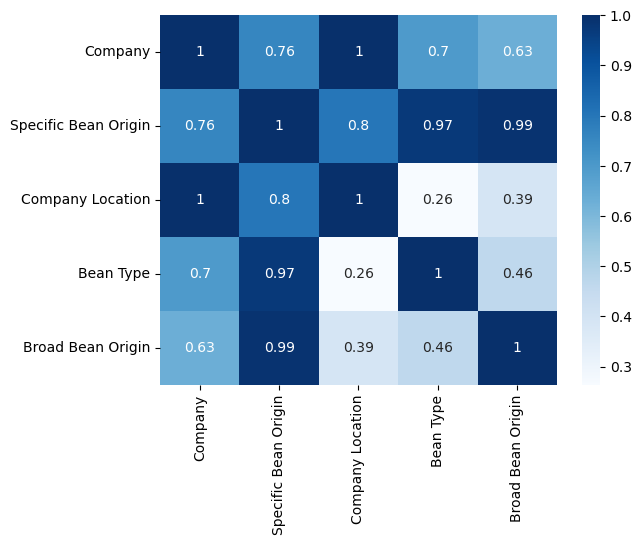

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

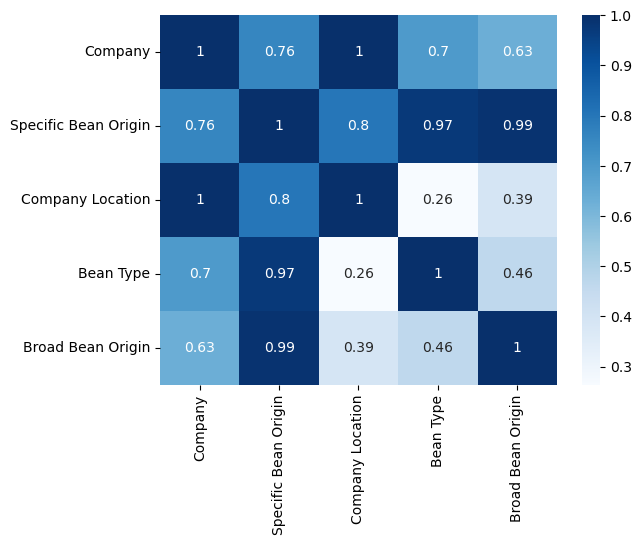

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

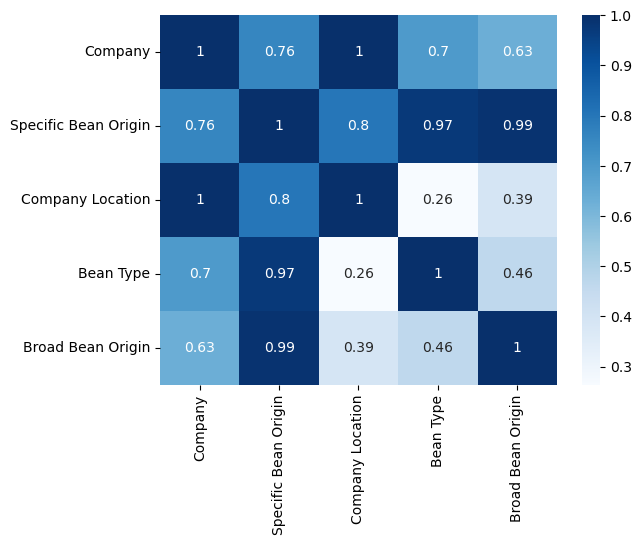

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

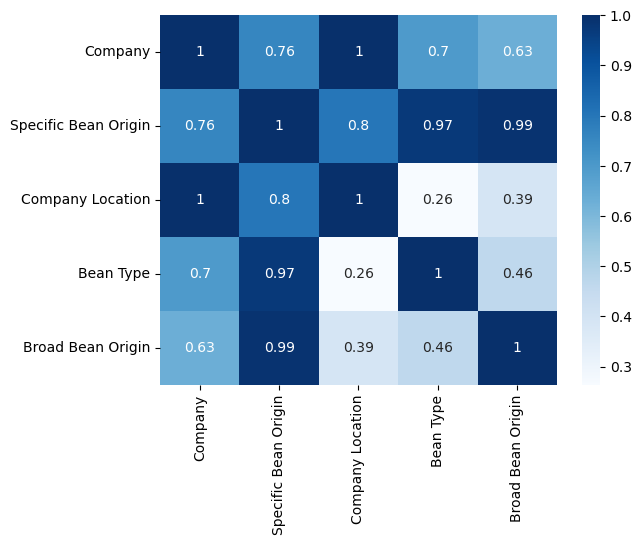

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

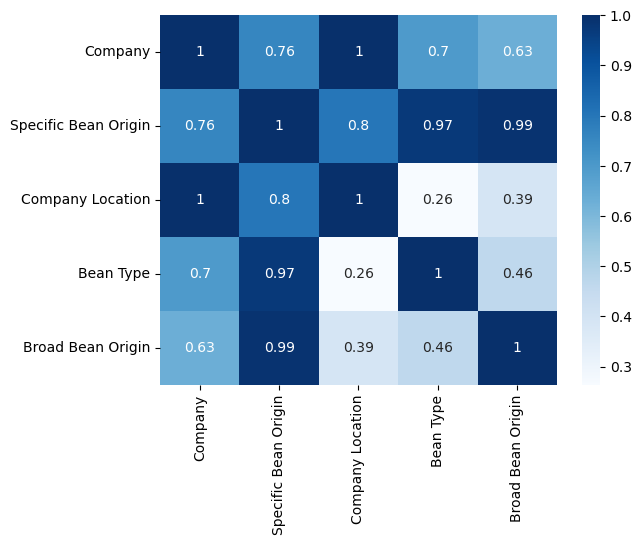

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

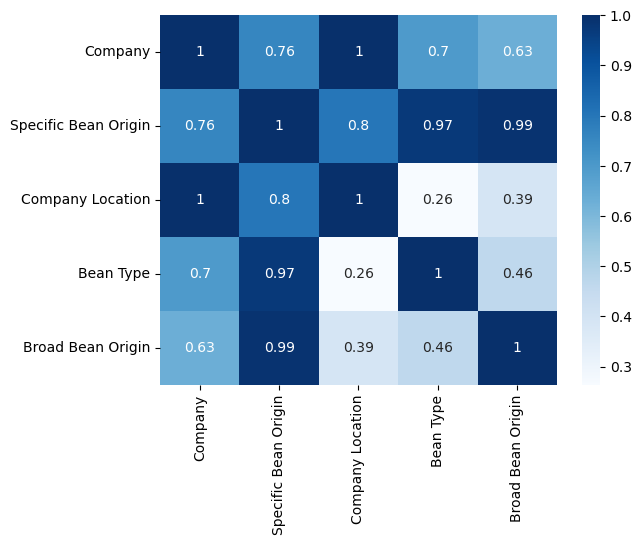

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


<!-- # Загрузка данных -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- # Загрузка данных -->

Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

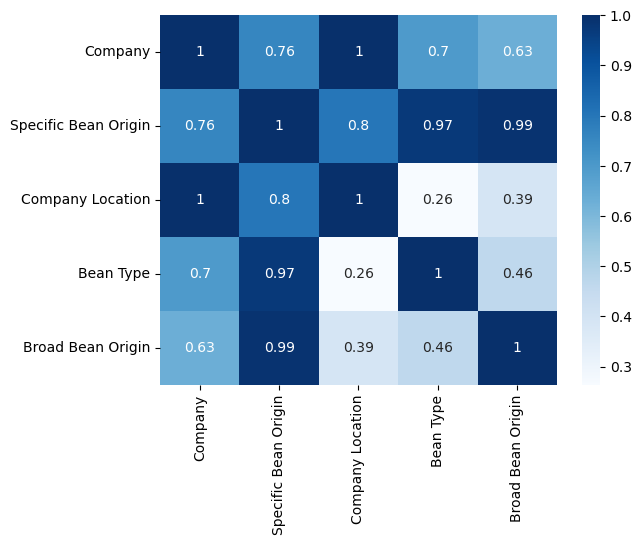

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

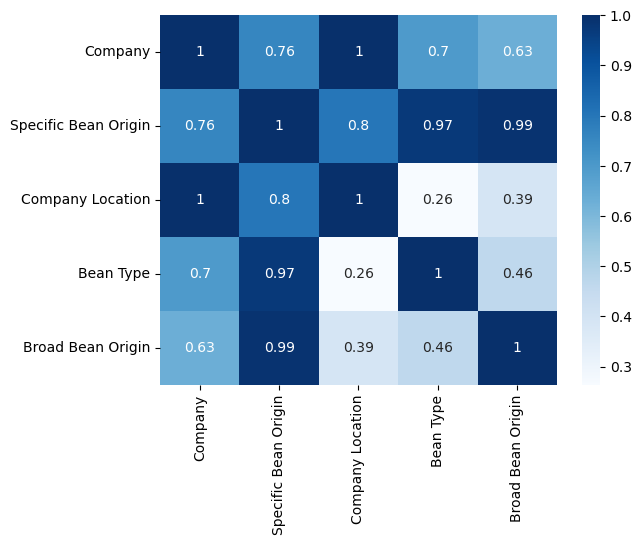

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

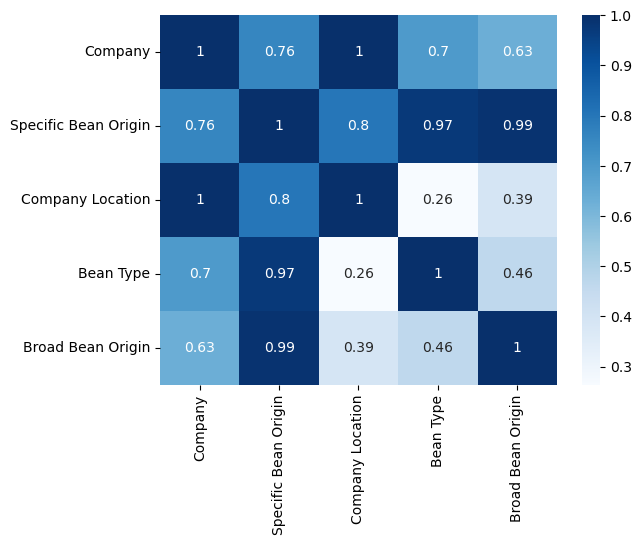

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

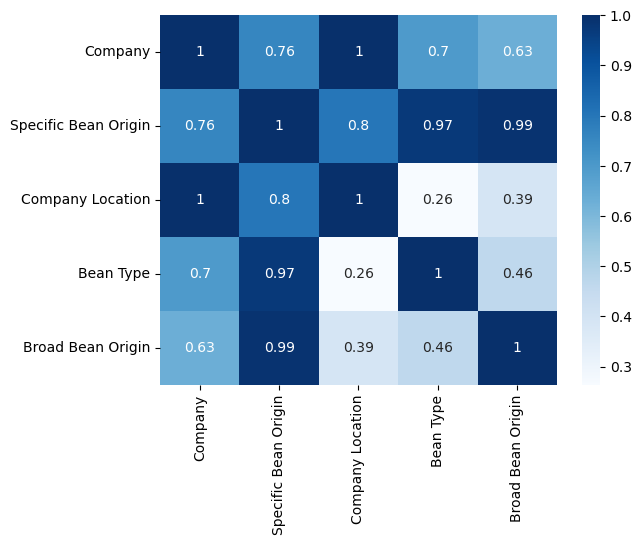

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

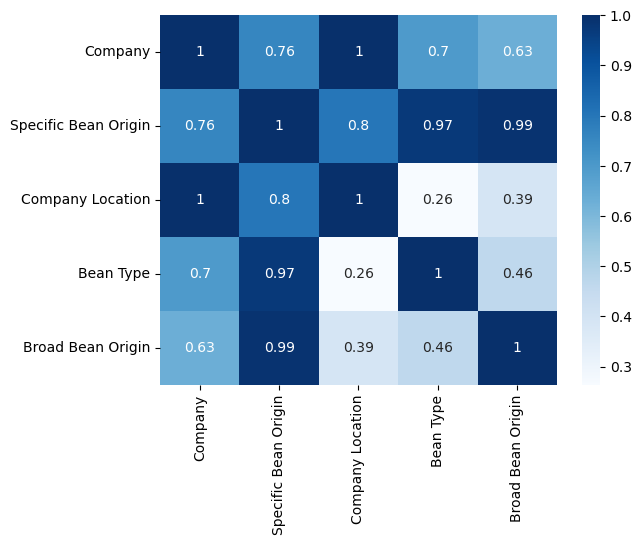

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

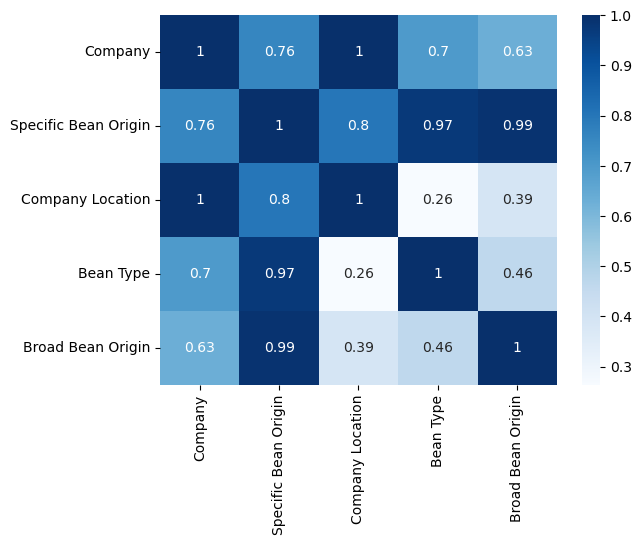

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

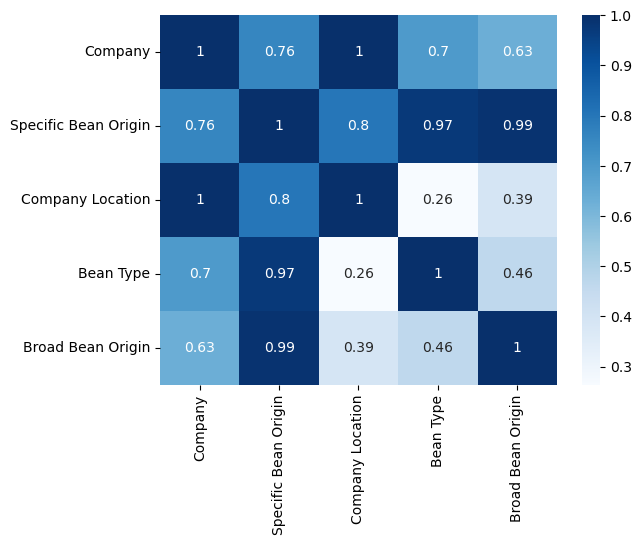

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

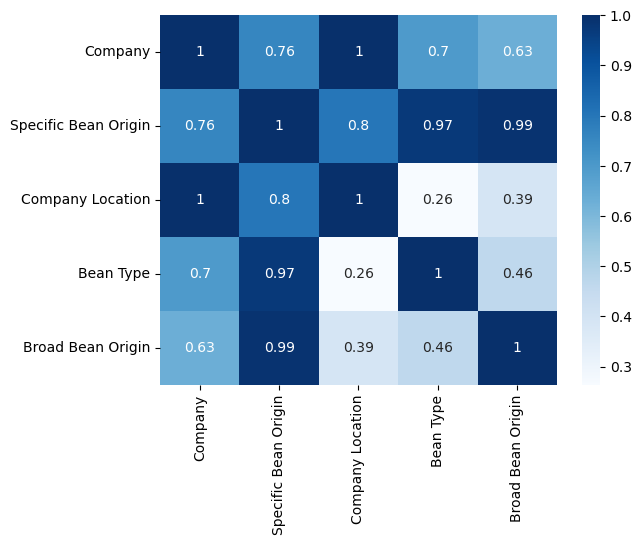

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

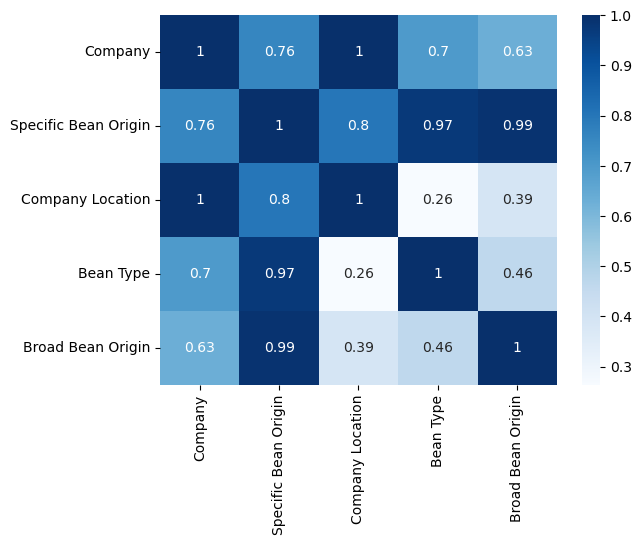

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

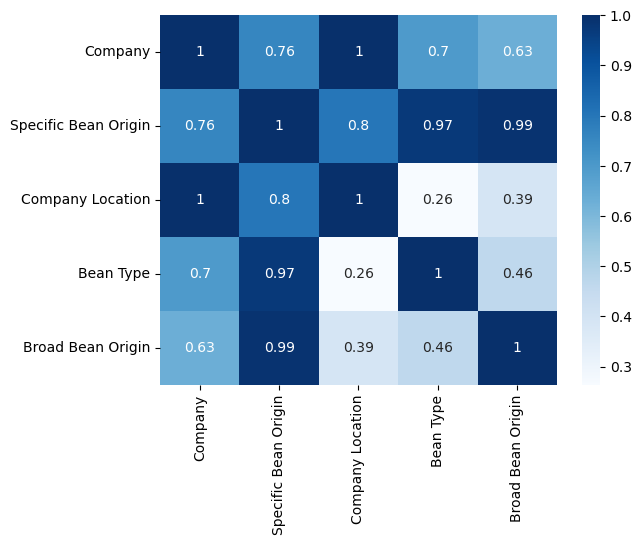

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

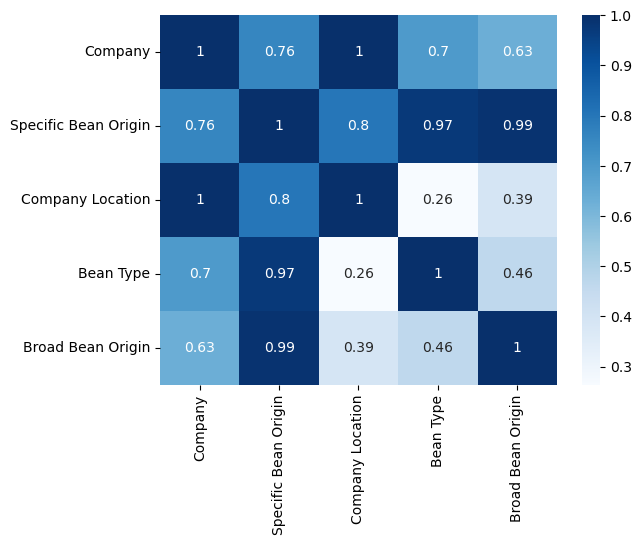

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

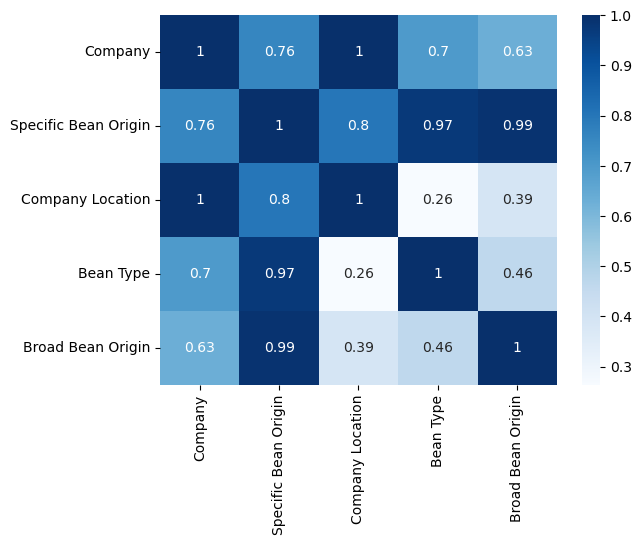

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

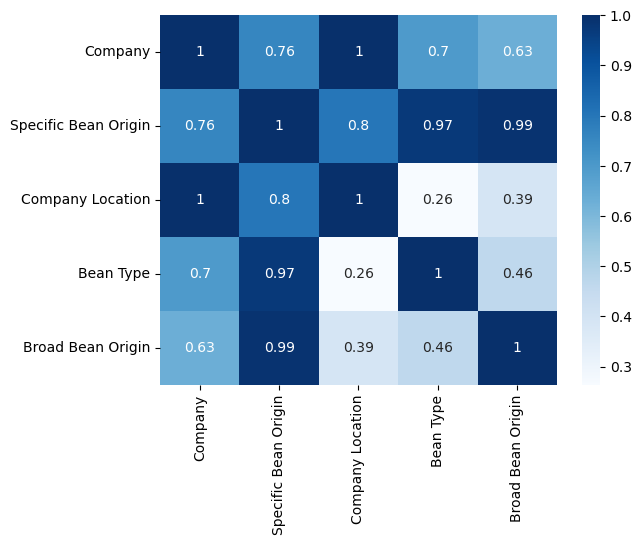

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

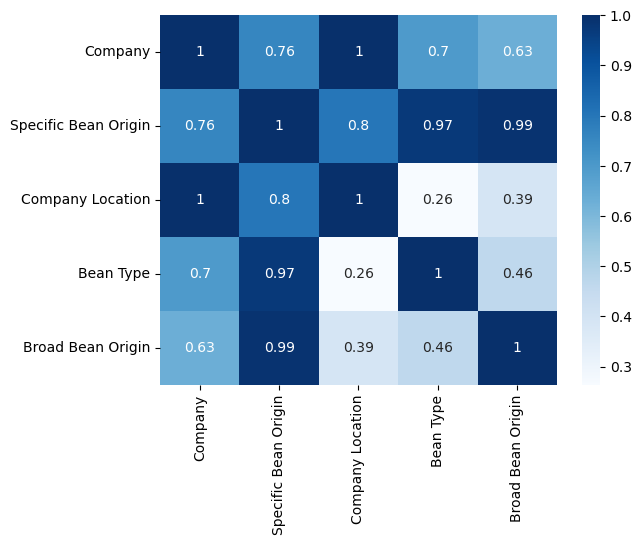

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

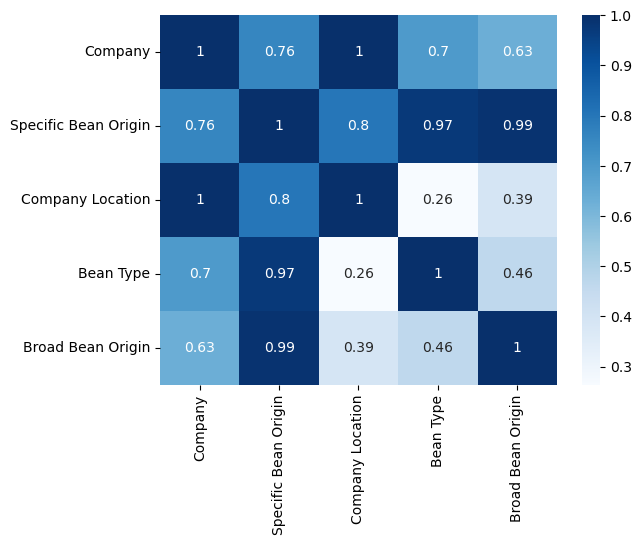

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

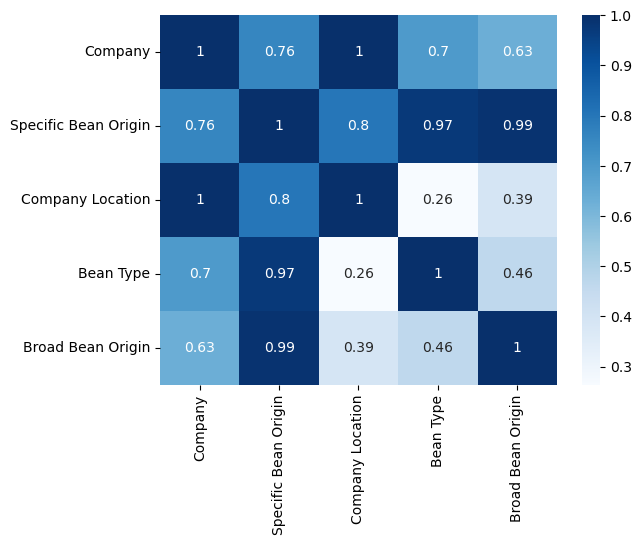

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

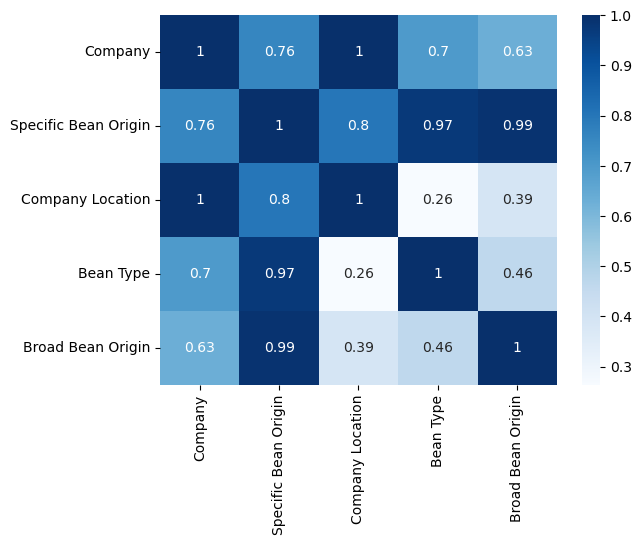

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

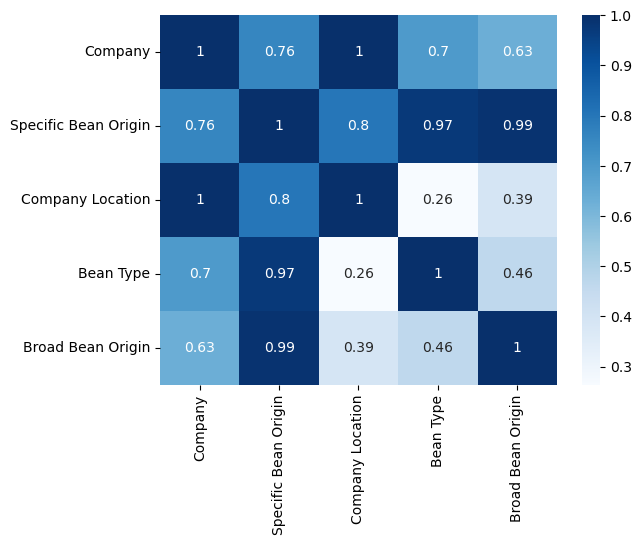

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

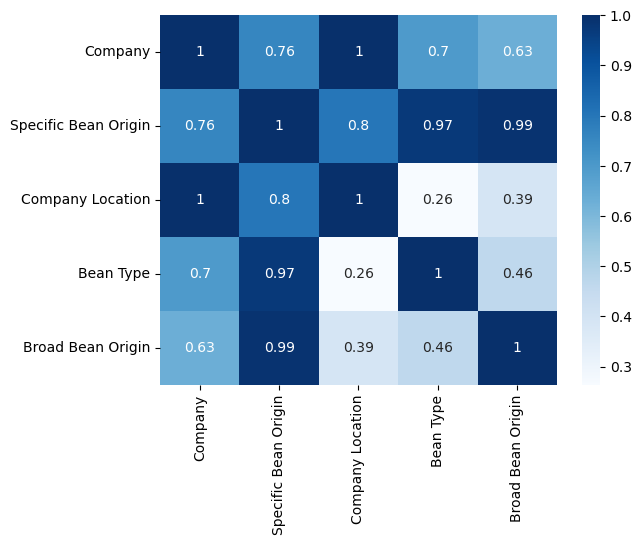

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

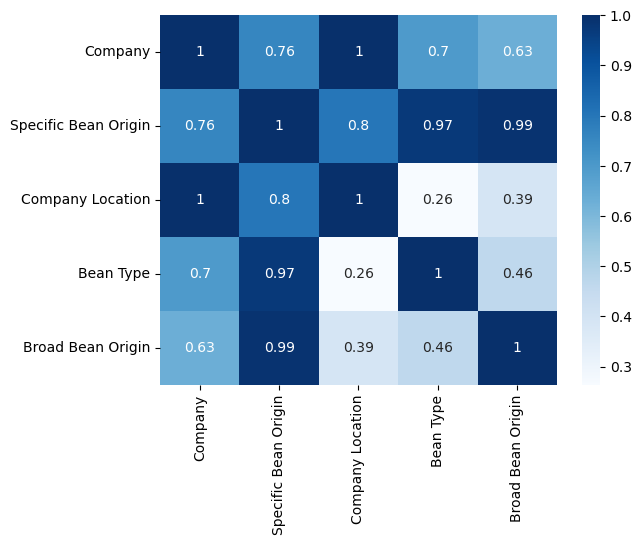

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

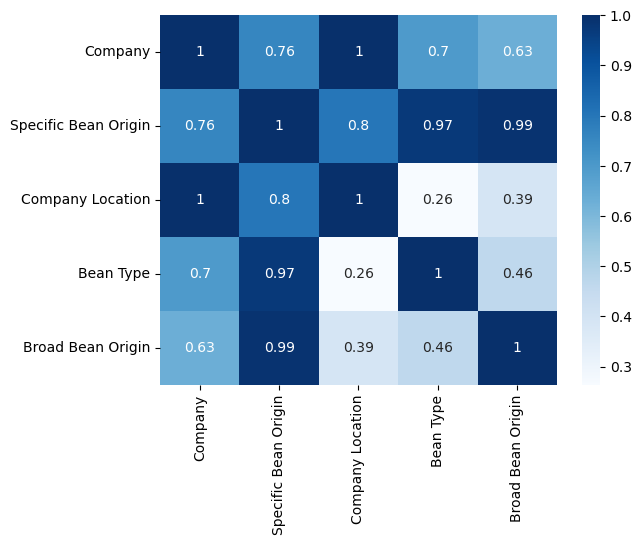

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

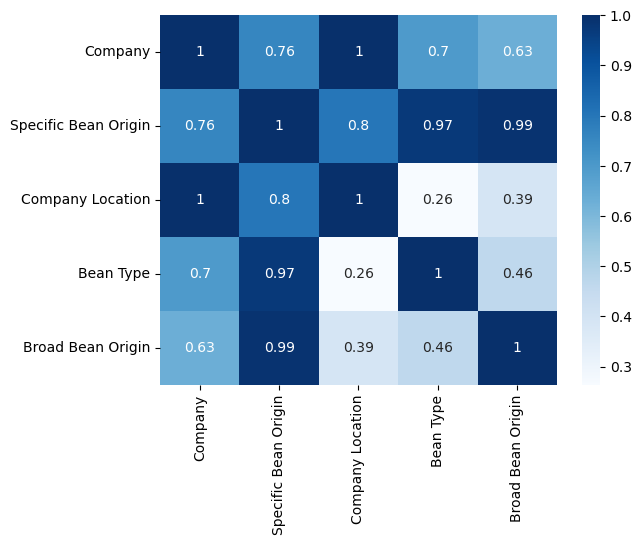

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

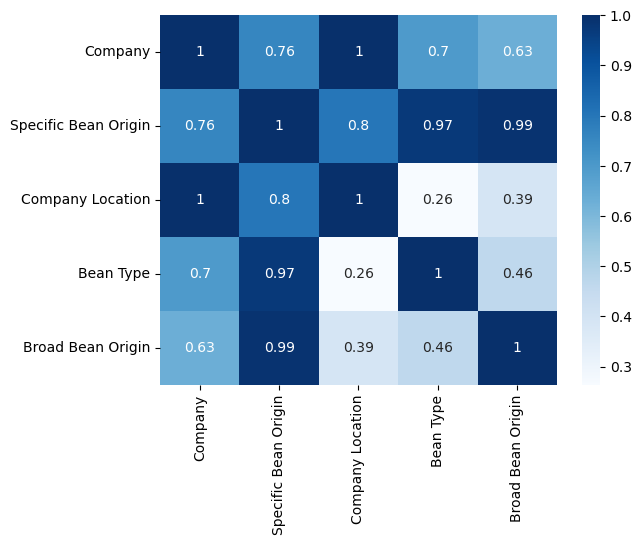

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

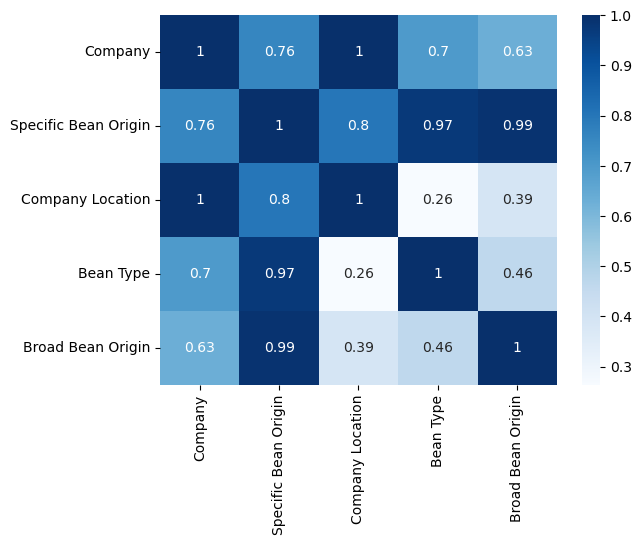

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

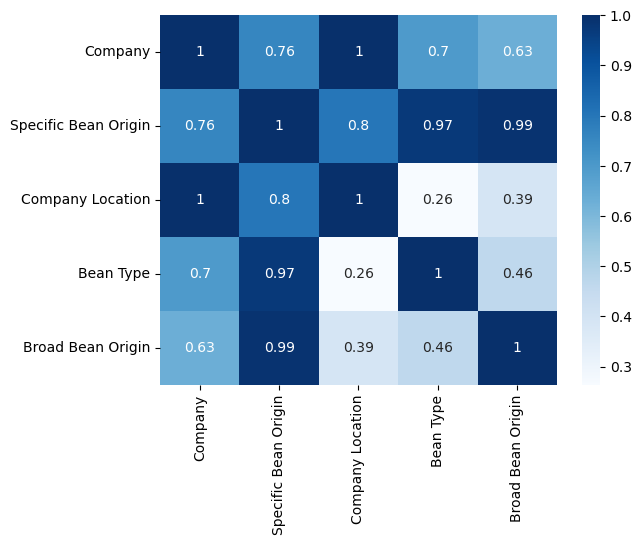

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

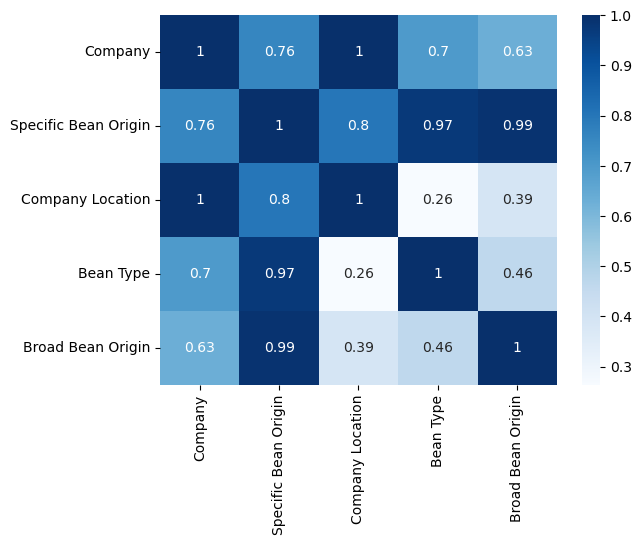

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

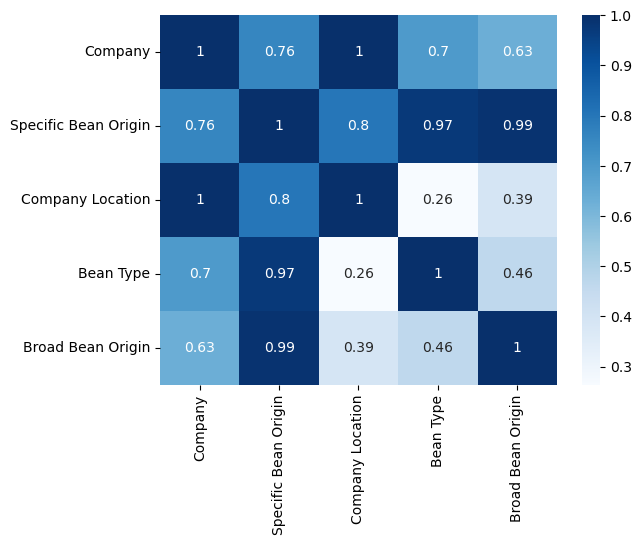

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

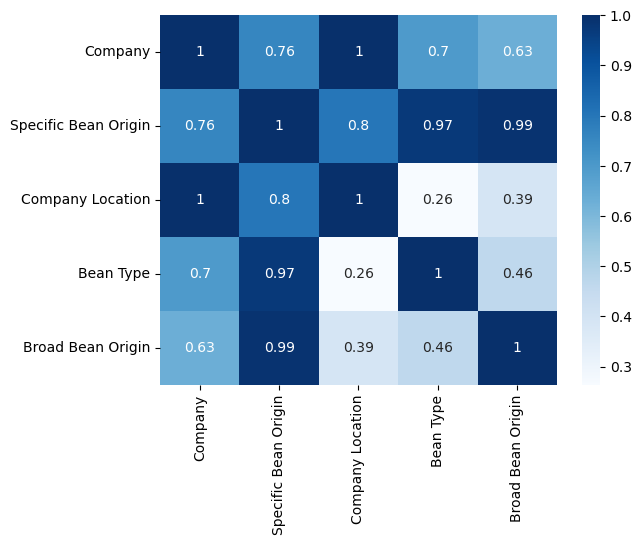

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

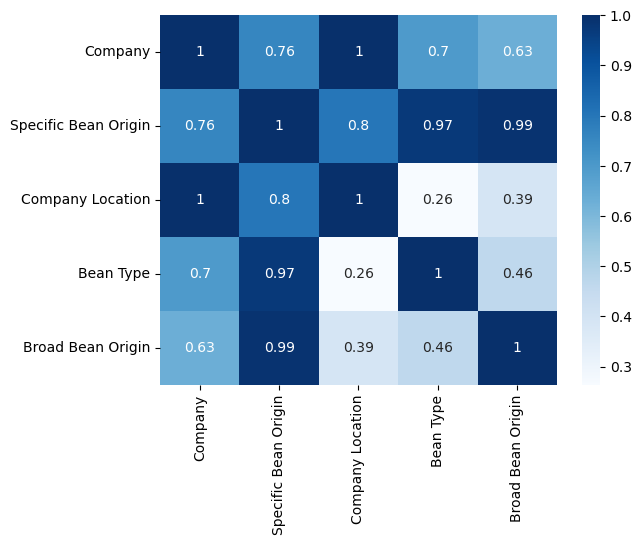

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

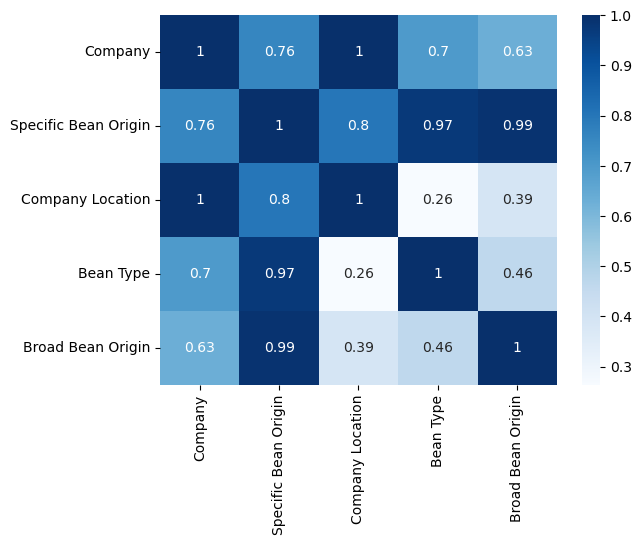

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

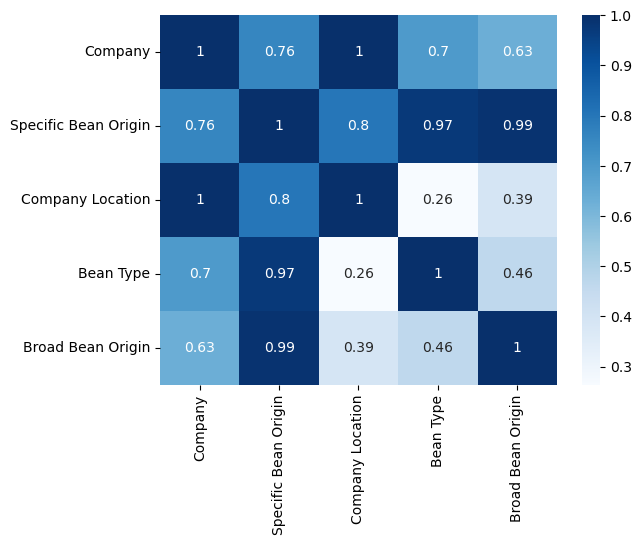

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

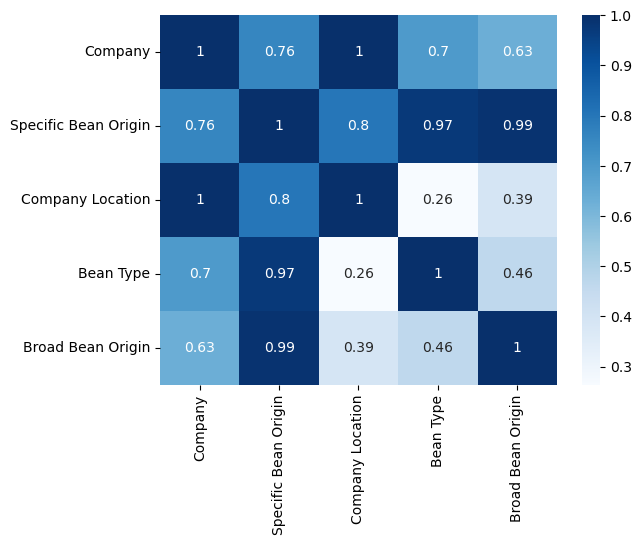

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

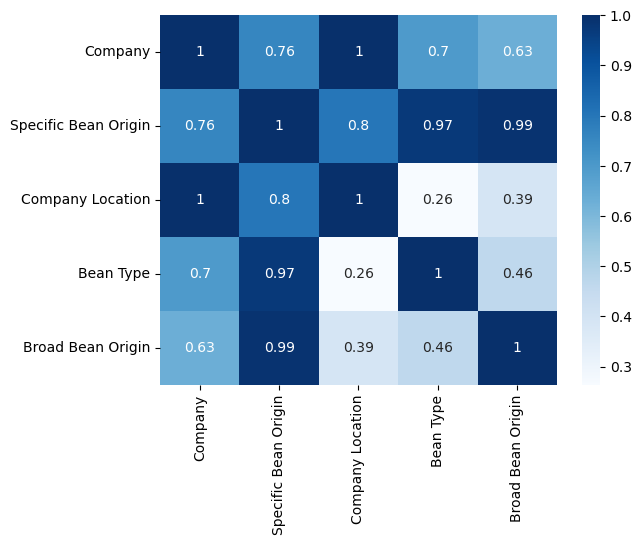

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

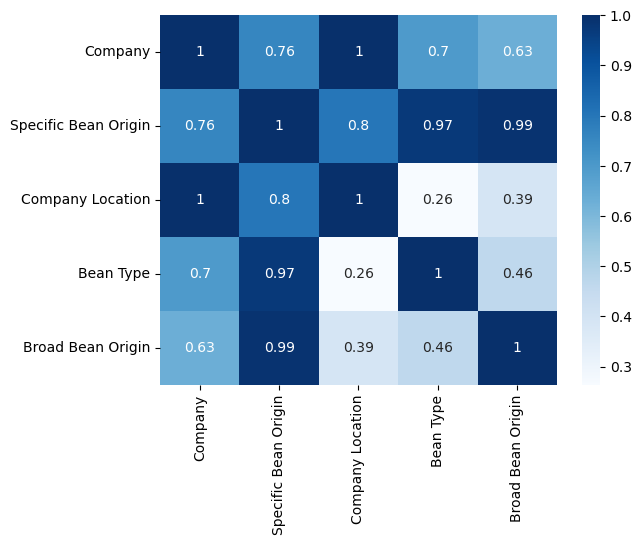

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

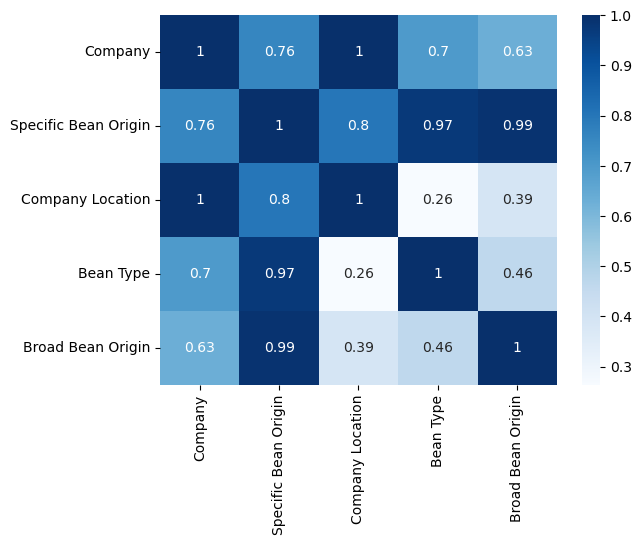

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

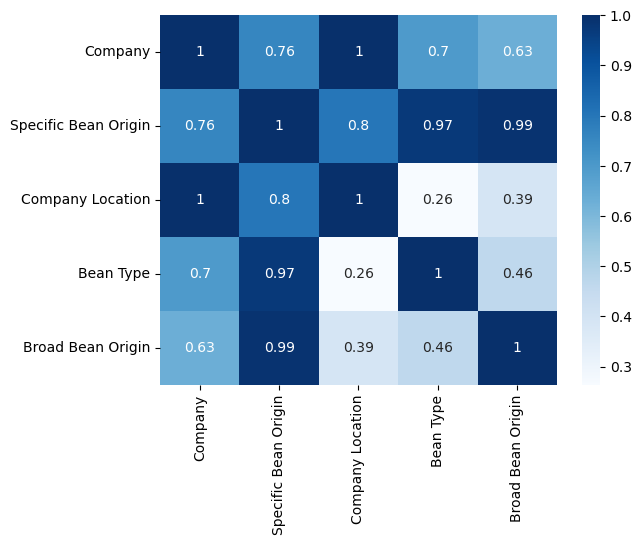

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

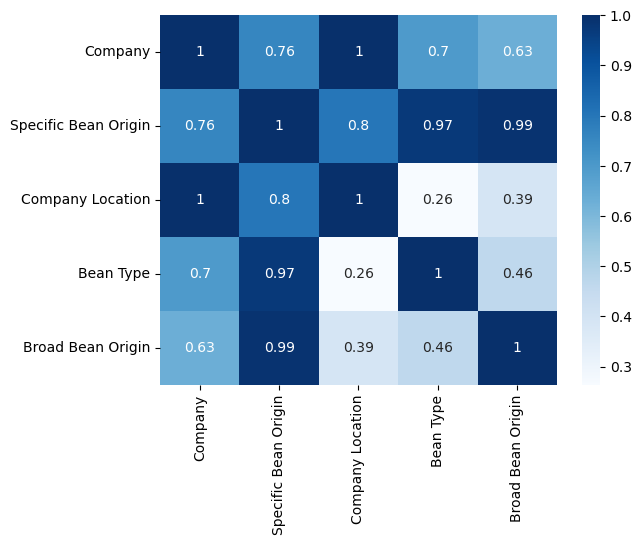

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

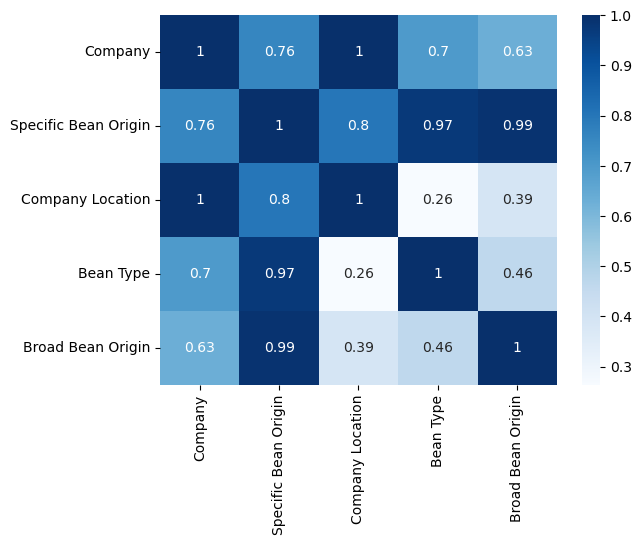

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

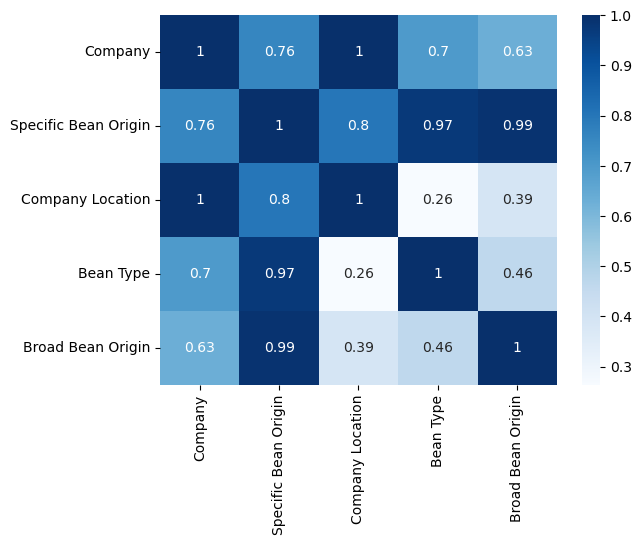

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


Загрузка данных

In [ ]:
# TRAIN = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_train.csv"
# TEST = "https://raw.githubusercontent.com/evgpat/edu_stepik_practical_ml/main/datasets/chocolate_test_new.csv"
TRAIN = 'data\chocolate-rating\chocolate_train.csv'
TEST = 'data\chocolate-rating\chocolate_test_new.csv'

In [ ]:
train_df = pd.read_csv(TRAIN)

In [ ]:
test_df = pd.read_csv(TEST)

In [ ]:
train_df['Bean Type'].value_counts().index[0]

'\xa0'

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
test_df = test_df.replace('\xa0', np.NaN)

Обзор данных

Описание данных
* Company - компания производитель
* Specific Bean Origin - географический регион происхождения
* REF - параметр, определяющий момент внесения записи в базу данных (чем выше значение, тем "свежее" запись)
* Review - дата публикации отзыва
* Cocoa Percent - процентное содержание какао
* Company Location - страна производитель
* Rating - экспертный рейтинг
* Bean Type - используемый сорт какао-бобов, если таковой имеется
* Broad Bean Origin - географический регион происхождения какао-бобов

In [ ]:
test_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Ohiyo,"San Juan Estate, Gran Couva",1594,2015,70%,U.S.A.,Trinitario,Trinidad
1,Blanxart,Organic Dark,322,2009,72%,Spain,NaN,NaN
2,Brazen,Maya Mountain,1518,2015,80%,U.S.A.,Trinitario,Belize
3,Patric,Madagascar,439,2009,67%,U.S.A.,Trinitario,Madagascar
4,Potomac,"Upala, Batch 12",607,2010,82%,U.S.A.,Matina,Costa Rica


In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
test_df.nunique()

Company                 244
Specific Bean Origin    385
REF                     338
Review                   12
Cocoa Percent            38
Company Location         42
Bean Type                19
Broad Bean Origin        59
dtype: int64

In [ ]:
def prepared_df_2(df):
    df.loc[df['Company Location'] == 'Amsterdam', 'Company Location'] = 'Netherlands'
    df.loc[df['Company Location'] == 'Eucador', 'Company Location'] = 'Ecuador'
    df.loc[df['Company Location'] == 'Niacragua', 'Company Location'] = 'Nicaragua'

In [ ]:
prepared_df_2(train_df)
prepared_df_2(test_df)

In [ ]:
train_df['Company Location'].value_counts().sort_index()

Company Location
Argentina              6
Australia             32
Austria               22
Belgium               25
Bolivia                2
Brazil                13
Canada                89
Chile                  2
Colombia              14
Costa Rica             6
Czech Republic         1
Denmark                8
Domincan Republic      5
Ecuador               43
Fiji                   3
Finland                2
France               116
Germany               22
Ghana                  1
Grenada                3
Guatemala              6
Honduras               6
Hungary               15
Iceland                2
India                  1
Ireland                3
Israel                 5
Italy                 41
Japan                 11
Lithuania              3
Madagascar            12
Mexico                 2
Netherlands            5
New Zealand           13
Nicaragua              2
Peru                  13
Poland                 7
Portugal               3
Puerto Rico            3
Russia  

In [ ]:
bean_types = {
    'Amazonian': ['Amazon', 'Amazon mix', 'Amazon, ICS'],
    'Blend': ['Blend', 'Blend-Forastero,Criollo', 'Criollo, Forastero', 'Criollo, Trinitario', 
              'Forastero, Trinitario', 'Trinitario, Criollo', 'Trinitario, Forastero',
              'Trinitario, Nacional', 'Trinitario, TCGA'],
    'Criollo': ['Criollo', 'Criollo (Amarru)', 'Criollo (Ocumare 61)', 'Criollo (Ocumare 67)',
                'Criollo (Ocumare 77)', 'Criollo (Ocumare)', 'Criollo (Porcelana)', 'Criollo (Wild)', 'Criollo, +'],
    'Forastero': ['Forastero', 'Forastero (Amelonado)', 'Forastero (Arriba)', 'Forastero (Arriba) ASS',
                  'Forastero (Arriba) ASSS', 'Forastero (Catongo)', 'Forastero (Nacional)', 'Forastero (Parazinho)',
                  'Forastero(Arriba, CCN)'],
    'Nacional': ['Nacional', 'Nacional (Arriba)'],
    'Trinitario': ['Trinitario', 'Trinitario (85% Criollo)', 'Trinitario (Amelonado)', 'Trinitario (Scavina)']
}

def bean_type_mapping(value):
    for group, values in bean_types.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Bean Type'] = train_df['Bean Type'].apply(bean_type_mapping)
test_df['Bean Type'] = test_df['Bean Type'].apply(bean_type_mapping)

In [ ]:
bb_origins = {
    'Carribean': ['Carribean', 'Carribean(DR/Jam/Tri)', 'Africa, Carribean, C. Am.'],
    'Colombia': ['Colombia', 'Colombia, Ecuador'],
    'Costa Rica': ['Costa Rica', 'Cost Rica, Ven'],
    'Dominican Republic': ['Dominican Republic', 'DR, Ecuador, Peru', 'Dom. Rep., Madagascar', 
                           'Domincan Republic', 'Dominican Rep., Bali'],
    'Ecuador': ['Ecuador', 'Ecuador, Costa Rica', 'Ecuador, Mad., PNG'],
    'Ghana': ['Ghana', 'Ghana & Madagascar', 'Ghana, Domin. Rep', 'Ghana, Panama, Ecuador'],
    'Grenada': ['Grenada', 'Gre., PNG, Haw., Haiti, Mad'],
    'Guatemala': ['Guatemala', 'Guat., D.R., Peru, Mad., PNG',],
    'Indonesia': ['Indonesia', 'Indonesia, Ghana'],
    'Madagascar': ['Madagascar', 'Madagascar & Ecuador','Mad., Java, PNG'],
    'Papua New Guinea': ['Papua New Guinea', 'PNG, Vanuatu, Mad'],
    'Peru': ['Peru', 'Peru(SMartin,Pangoa,nacional)', 'Peru, Belize', 'Peru, Dom. Rep', 'Peru, Ecuador',
    'Peru, Ecuador, Venezuela', 'Peru, Mad., Dom. Rep.', 'Peru, Madagascar'],
    'Sao Tome': ['Sao Tome', 'Sao Tome & Principe'],
    'South America': ['South America', 'South America, Africa', 'Central and S. America'],
    'Trinidad': ['Trinidad', 'Trinidad, Ecuador', 'Trinidad, Tobago', 'Trinidad-Tobago',],
    'Venezuela': ['Venezuela', 'Ven, Bolivia, D.R.', 'Ven, Trinidad, Ecuador', 'Ven., Indonesia, Ecuad.',
                  'Ven., Trinidad, Mad.', 'Ven.,Ecu.,Peru,Nic.', 'Venez,Africa,Brasil,Peru,Mex',
                  'Venezuela, Carribean', 'Venezuela, Dom. Rep.', 'Venezuela, Ghana', 'Venezuela, Java',
                  'Venezuela, Trinidad', 'Venezuela/ Ghana']
}

def bb_origin_mapping(value):
    for group, values in bb_origins.items():
        if value in values:
            return group
    return value

In [ ]:
train_df['Broad Bean Origin'] = train_df['Broad Bean Origin'].apply(bb_origin_mapping)
test_df['Broad Bean Origin'] = test_df['Broad Bean Origin'].apply(bb_origin_mapping)

In [ ]:
df_concat = pd.concat([train_df, test_df], axis=0)

In [ ]:
cols_temp = ['Company', 'Specific Bean Origin', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
df_concat

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72%,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72%,Switzerland,3.50,NaN,Venezuela
2,Dark Forest,Tanzania,1554,2015,70%,U.S.A.,3.00,NaN,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72%,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75%,France,3.50,Criollo,Indonesia
...,...,...,...,...,...,...,...,...,...
535,Monsieur Truffe,Papaua New Guinea,1391,2014,70%,Australia,NaN,NaN,Papua New Guinea
536,Cacao Hunters,Macondo,1816,2016,71%,Colombia,NaN,NaN,Colombia
537,Bonnat,Maragnam,1038,2013,75%,France,NaN,NaN,Brazil
538,Altus aka Cao Artisan,Acopagro,1728,2016,60%,U.S.A.,NaN,NaN,Peru


In [ ]:
cramer_df = df_concat[cols_temp]
cramer_df = cramer_df.astype('category')

cramer = CramersV(cramer_df)
cramer = cramer.fit()

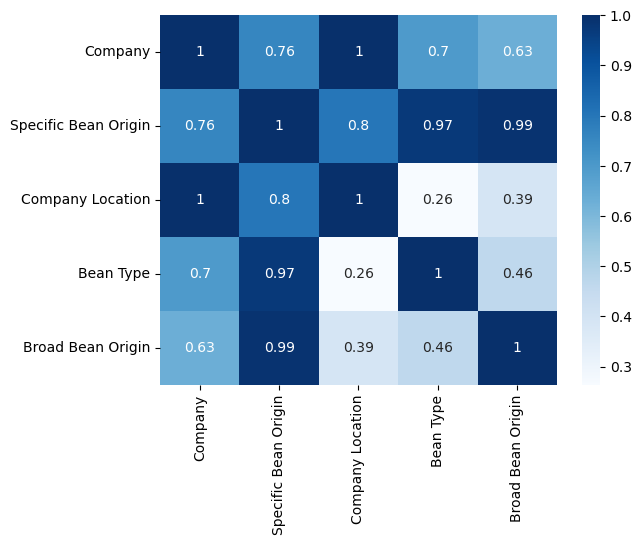

In [ ]:
import seaborn as sns

sns.heatmap(cramer, cmap='Blues', annot=True);

In [ ]:
def select_top_corr_cols(col_in):
    select_df = cramer[col_in].sort_values(ascending=False)
    return select_df[1:].index.to_list()

In [ ]:
def get_temp_df(col_in, col_on, SEED):
    np.random.seed(SEED)
    temp_df = df_concat.groupby(col_on)[col_in] \
                        .agg(lambda x: np.random.choice(x.mode()) if len(x.mode()) > 0 else np.NaN) \
                        .dropna().reset_index()
    return temp_df

In [ ]:
def fill_rows(row, col_on, temp_df):
    for variants, category in temp_df.values:
        if row[col_on] == variants:
            return category
    return np.NaN

In [ ]:
train_df.isna().sum()

Company                   0
Specific Bean Origin      0
REF                       0
Review                    0
Cocoa Percent             0
Company Location          0
Rating                    0
Bean Type               629
Broad Bean Origin        56
dtype: int64

In [ ]:
def prepared_df(df, col_in, SEED):
    selected_cols = select_top_corr_cols(col_in)
    print(selected_cols)
    for col_on in selected_cols:
        temp_df = get_temp_df(col_in, col_on, SEED)
        df[col_in] = df.apply(lambda row: fill_rows(row, col_on, temp_df) if row[col_in] is np.NaN else row[col_in], axis=1)
        df[col_in] = df[col_in].fillna('Other')

In [ ]:
cols_in = ['Bean Type', 'Broad Bean Origin']
SEED = np.random.randint(1, 10000)
print(SEED)
for col_in in cols_in:
    prepared_df(train_df, col_in, SEED)

for col_in in cols_in:
    prepared_df(test_df, col_in, SEED)

3907
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']
['Specific Bean Origin', 'Company', 'Broad Bean Origin', 'Company Location']
['Specific Bean Origin', 'Company', 'Bean Type', 'Company Location']


In [ ]:
train_df.isna().sum()

Company                 0
Specific Bean Origin    0
REF                     0
Review                  0
Cocoa Percent           0
Company Location        0
Rating                  0
Bean Type               0
Broad Bean Origin       0
dtype: int64

In [ ]:
train_df = train_df.replace('\xa0', np.NaN)
train_df['Cocoa Percent'] = train_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
train_df['Review'] = train_df['Review'].astype('object')

test_df = test_df.replace('\xa0', np.NaN)
test_df['Cocoa Percent'] = test_df['Cocoa Percent'].str.rstrip('%').astype(np.float16)
test_df['Review'] = test_df['Review'].astype('object')

In [ ]:
train_df.head()

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Rating,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,457,2009,72.0,U.K.,3.25,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",508,2010,72.0,Switzerland,3.50,Other,Venezuela
2,Dark Forest,Tanzania,1554,2015,70.0,U.S.A.,3.00,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,1125,2013,72.0,U.S.A.,3.00,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",32,2006,75.0,France,3.50,Criollo,Indonesia


In [ ]:
train_df.dtypes

Company                  object
Specific Bean Origin     object
REF                       int64
Review                   object
Cocoa Percent           float16
Company Location         object
Rating                  float64
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cols = ['Company', 'Specific Bean Origin', 'REF', 'Review', 'Cocoa Percent', 'Company Location', 'Bean Type', 'Broad Bean Origin']

In [ ]:
X = train_df[cols]
target = train_df['Rating']
test = test_df[cols]

In [ ]:
scaler = MinMaxScaler()

X['REF'] = scaler.fit_transform(X[['REF']])  
test['REF'] = scaler.transform(test[['REF']])

In [ ]:
scaler = MinMaxScaler()

X['Cocoa Percent'] = scaler.fit_transform(X[['Cocoa Percent']])  
test['Cocoa Percent'] = scaler.transform(test[['Cocoa Percent']])

In [ ]:
X

,Company,Specific Bean Origin,REF,Review,Cocoa Percent,Company Location,Bean Type,Broad Bean Origin
0,Willie's Cacao,Rio Caribe,0.232152,2009,0.481934,U.K.,Trinitario,Venezuela
1,Beschle (Felchlin),"Ocumare, Premier Cru, Quizas No. 2",0.258346,2010,0.481934,Switzerland,Other,Venezuela
2,Dark Forest,Tanzania,0.795583,2015,0.444824,U.S.A.,Criollo,Tanzania
3,Brasstown aka It's Chocolate,Cooproagro,0.575244,2013,0.481934,U.S.A.,Trinitario,Dominican Republic
4,Pralus,"Java, Indonesie",0.013867,2006,0.537598,France,Criollo,Indonesia
...,...,...,...,...,...,...,...,...
1250,Artisan du Chocolat,Madagascar,0.183873,2009,0.630371,U.K.,Blend,Madagascar
1251,Marana,Cusco,0.965074,2016,0.444824,Peru,Other,Peru
1252,Arete,Nacional,0.785311,2015,0.407715,U.S.A.,Forastero,Peru
1253,Fresco,"Conacado, #212, LR, SC",0.327170,2011,0.481934,U.S.A.,Other,Dominican Republic


In [ ]:
X.dtypes

Company                  object
Specific Bean Origin     object
REF                     float64
Review                   object
Cocoa Percent           float16
Company Location         object
Bean Type                object
Broad Bean Origin        object
dtype: object

In [ ]:
cat_features = [i for i, col in enumerate(X.columns) if X[col].dtype.name in ['category', 'object']]

Обучение и подбор гиперпараметров

In [ ]:
# [I 2025-05-16 13:37:52,998] Trial 269 finished with value: 0.21572682980104738 and parameters: {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}. Best is trial 269 with value: 0.21572682980104738.

# params = study.best_params
params = {'learning_rate': 0.007147252650298629, 'n_estimators': 2943, 'l2_leaf_reg': 1.7213112072165055, 'random_strength': 7.798118771174216, 'bagging_temperature': 0.33743402572607145}

model = CatBoostRegressor(
        cat_features=cat_features, **params,
        silent=True
    )
model.fit(X, target)

In [ ]:
pred = model.predict(test)

In [ ]:
# test = test.copy()
# result = pd.DataFrame()
# result['id'] = np.arange(len(test))
# result['Rating'] = pred

# result[['id','Rating']].to_csv("choko_submission_46.csv", index=False)

![image.png](attachment:image.png)

In [ ]:
y_test = pd.read_csv('choko_submission_35_32.csv', usecols=['Rating']).values.reshape(-1)

print(SEED)
r2 = r2_score(y_test, pred)
print(r2)
mae = MAE(y_test, pred)
print(mae)

3907
0.9607737205534693
0.033275909451088014


# Результат

In [ ]:
if mae < mae_0 and r2 > r2_0:
    mae_0 = mae
    r2_0 = r2
    seed_0 = SEED

print(seed_0)
print(r2_0)
print(mae_0)

3907
0.9607737205534693
0.033275909451088014


<!-- # Загрузка данных -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- # Загрузка данных -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->

<!-- {'learning_rate': 0.008553940111605946, 'n_estimators': 2114, 'l2_leaf_reg': 1.4163130536678312, 'random_strength': 4.287920281067569, 'bagging_temperature': 0.7916641053388684, 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 7, 'rsm': 0.9923008576207031} -->